In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statistics import mode
from scipy import stats
import warnings
warnings.filterwarnings('ignore')
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller

In [6]:
consum_dades = pd.read_parquet("Mostra Set de dades 4_Incidències en comptadors intel·ligents_Consum.parquet")
perimetre_dades = pd.read_parquet("Mostra Set de dades 4_Incidències en comptadors intel·ligents_Perímetre.parquet")

In [ ]:
def comprehensive_eda(df, figsize=(12, 6), categorical_threshold=10):
    """
    Performs comprehensive Exploratory Data Analysis on a DataFrame.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        The dataframe to analy  ze
    figsize : tuple, default=(12, 6)
        Default figure size for plots
    categorical_threshold : int, default=10
        Maximum unique values for a column to be considered categorical
    
    Returns:
    --------
    dict : Dictionary containing statistical summaries
    """
    
    print("="*80)
    print("COMPREHENSIVE EXPLORATORY DATA ANALYSIS")
    print("="*80)
    print(f"\nDataset Shape: {df.shape}")
    print(f"Number of Rows: {df.shape[0]}")
    print(f"Number of Columns: {df.shape[1]}")
    
    # Identify numerical and categorical columns
    numerical_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
    
    # Also check for numerical columns with few unique values (potential categorical)
    for col in numerical_cols.copy():
        if df[col].nunique() <= categorical_threshold:
            print(f"\nNote: '{col}' is numerical but has only {df[col].nunique()} unique values. Consider treating as categorical.")
    
    print(f"\n{'='*80}")
    print("DATA TYPES AND MISSING VALUES")
    print("="*80)
    print("\nColumn Information:")
    print(df.info())
    
    print("\n\nMissing Values Summary:")
    missing_df = pd.DataFrame({
        'Column': df.columns,
        'Missing_Count': df.isnull().sum(),
        'Missing_Percentage': (df.isnull().sum() / len(df) * 100).round(2)
    })
    print(missing_df[missing_df['Missing_Count'] > 0])
    
    # ===========================
    # NUMERICAL VARIABLES ANALYSIS
    # ===========================
    if len(numerical_cols) > 0:
        print(f"\n{'='*80}")
        print("NUMERICAL VARIABLES ANALYSIS")
        print("="*80)
        print(f"\nNumerical Columns: {numerical_cols}")
        
        # Descriptive Statistics
        print("\n" + "-"*80)
        print("DESCRIPTIVE STATISTICS")
        print("-"*80)
        print(df[numerical_cols].describe().round(3))
        
        # Additional statistics
        print("\n\nADDITIONAL STATISTICS:")
        stats_df = pd.DataFrame({
            'Variable': numerical_cols,
            'Mean': df[numerical_cols].mean().round(3),
            'Median': df[numerical_cols].median().round(3),
            'Std': df[numerical_cols].std().round(3),
            'Skewness': df[numerical_cols].skew().round(3),
            'Kurtosis': df[numerical_cols].kurtosis().round(3)
        })
        print(stats_df.to_string(index=False))
        
        # Analyze each numerical variable
        for col in numerical_cols:
            print(f"\n{'='*80}")
            print(f"ANALYZING: {col}")
            print("="*80)
            
            # Calculate statistics
            col_mean = df[col].mean()
            col_median = df[col].median()
            try:
                col_mode = mode(df[col].dropna())
            except:
                col_mode = df[col].mode()[0] if len(df[col].mode()) > 0 else np.nan
            
            print(f"Mean: {col_mean:.3f}")
            print(f"Median: {col_median:.3f}")
            print(f"Mode: {col_mode:.3f}")
            print(f"Std Dev: {df[col].std():.3f}")
            print(f"Min: {df[col].min():.3f}")
            print(f"Max: {df[col].max():.3f}")
            
            # 1. HISTOGRAM
            plt.figure(figsize=figsize)
            plt.hist(x=df[col].dropna(), bins=min(50, df[col].nunique()), 
                    color='orange', edgecolor='black', alpha=0.7)
            plt.xlabel(col, fontsize=12)
            plt.ylabel('Frequency', fontsize=12)
            plt.title(f'Histogram of {col}', fontsize=14, fontweight='bold')
            plt.grid(alpha=0.3)
            plt.tight_layout()
            plt.show()
            
            # 2. DISTRIBUTION PLOT WITH MEAN, MEDIAN, MODE
            plt.figure(figsize=figsize)
            sns.kdeplot(data=df[col].dropna(), fill=True, color='skyblue')
            plt.axvline(col_mean, color='r', linestyle='--', linewidth=2, label=f'Mean: {col_mean:.2f}')
            plt.axvline(col_median, color='b', linestyle='--', linewidth=2, label=f'Median: {col_median:.2f}')
            plt.axvline(col_mode, color='g', linestyle='--', linewidth=2, label=f'Mode: {col_mode:.2f}')
            plt.xlabel(col, fontsize=12)
            plt.ylabel('Density', fontsize=12)
            plt.title(f'Distribution of {col} with Central Tendency Measures', fontsize=14, fontweight='bold')
            plt.legend()
            plt.grid(alpha=0.3)
            plt.tight_layout()
            plt.show()
            
            # 3. BOX PLOT
            plt.figure(figsize=figsize)
            sns.boxplot(x=df[col], color='lightcoral')
            plt.xlabel(col, fontsize=12)
            plt.title(f'Box Plot of {col}', fontsize=14, fontweight='bold')
            plt.grid(alpha=0.3)
            plt.tight_layout()
            plt.show()
            
            # 4. VIOLIN PLOT
            plt.figure(figsize=figsize)
            parts = plt.violinplot([df[col].dropna()], positions=[0], showmeans=True, 
                                  showmedians=True, showextrema=True)
            plt.ylabel(col, fontsize=12)
            plt.title(f'Violin Plot of {col}', fontsize=14, fontweight='bold')
            plt.xticks([])
            plt.grid(alpha=0.3)
            plt.tight_layout()
            plt.show()
        
        # CORRELATION ANALYSIS
        if len(numerical_cols) > 1:
            print(f"\n{'='*80}")
            print("CORRELATION ANALYSIS")
            print("="*80)
            
            corr_matrix = df[numerical_cols].corr()
            print("\nCorrelation Matrix:")
            print(corr_matrix.round(3))
            
            # Correlation Heatmap
            plt.figure(figsize=(max(8, len(numerical_cols)), max(6, len(numerical_cols)*0.8)))
            sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0, 
                       fmt='.2f', square=True, linewidths=1, cbar_kws={"shrink": 0.8})
            plt.title('Correlation Matrix Heatmap', fontsize=16, fontweight='bold', pad=20)
            plt.tight_layout()
            plt.show()
            
            # Find strong correlations
            print("\nStrong Correlations (|r| > 0.5):")
            for i in range(len(corr_matrix.columns)):
                for j in range(i+1, len(corr_matrix.columns)):
                    if abs(corr_matrix.iloc[i, j]) > 0.5:
                        print(f"{corr_matrix.columns[i]} <-> {corr_matrix.columns[j]}: {corr_matrix.iloc[i, j]:.3f}")
            
            # PAIRWISE SCATTER PLOTS
            if len(numerical_cols) >= 2:
                print(f"\n{'='*80}")
                print("PAIRWISE RELATIONSHIPS")
                print("="*80)
                
                # Scatter plots for pairs
                num_pairs = min(3, len(numerical_cols))  # Show first 3 pairs
                for i in range(num_pairs-1):
                    for j in range(i+1, num_pairs):
                        col1, col2 = numerical_cols[i], numerical_cols[j]
                        
                        # Scatter plot
                        plt.figure(figsize=figsize)
                        plt.scatter(df[col1], df[col2], s=50, alpha=0.6, 
                                   c=df[col1], cmap='viridis', edgecolors='black', linewidth=0.5)
                        plt.xlabel(col1, fontsize=12)
                        plt.ylabel(col2, fontsize=12)
                        plt.title(f'Scatter Plot: {col1} vs {col2}', fontsize=14, fontweight='bold')
                        plt.colorbar(label=col1)
                        plt.grid(alpha=0.3)
                        plt.tight_layout()
                        plt.show()
                        
                        # Joint plot with regression
                        sns.jointplot(x=col1, y=col2, data=df, kind="reg", height=8)
                        plt.tight_layout()
                        plt.show()
                
                # Pair plot
                if len(numerical_cols) <= 5:  # Only if not too many columns
                    print("\nGenerating Pair Plot...")
                    if len(categorical_cols) > 0:
                        # Use first categorical variable for hue
                        hue_col = categorical_cols[0]
                        if df[hue_col].nunique() <= 5:
                            sns.pairplot(data=df, vars=numerical_cols, hue=hue_col, 
                                       diag_kind='kde', height=2.5)
                            plt.suptitle('Pair Plot of Numerical Variables', y=1.02, fontsize=16, fontweight='bold')
                            plt.tight_layout()
                            plt.show()
                        else:
                            sns.pairplot(data=df[numerical_cols], diag_kind='kde', height=2.5)
                            plt.suptitle('Pair Plot of Numerical Variables', y=1.02, fontsize=16, fontweight='bold')
                            plt.tight_layout()
                            plt.show()
                    else:
                        sns.pairplot(data=df[numerical_cols], diag_kind='kde', height=2.5)
                        plt.suptitle('Pair Plot of Numerical Variables', y=1.02, fontsize=16, fontweight='bold')
                        plt.tight_layout()
                        plt.show()
    
    # ===========================
    # CATEGORICAL VARIABLES ANALYSIS
    # ===========================
    if len(categorical_cols) > 0:
        print(f"\n{'='*80}")
        print("CATEGORICAL VARIABLES ANALYSIS")
        print("="*80)
        print(f"\nCategorical Columns: {categorical_cols}")
        
        for col in categorical_cols:
            print(f"\n{'='*80}")
            print(f"ANALYZING: {col}")
            print("="*80)
            
            # Value counts
            value_counts = df[col].value_counts()
            value_percentages = df[col].value_counts(normalize=True) * 100
            
            summary_df = pd.DataFrame({
                'Category': value_counts.index,
                'Count': value_counts.values,
                'Percentage': value_percentages.values.round(2)
            })
            
            print(f"\nUnique Values: {df[col].nunique()}")
            print(f"\nValue Counts:")
            print(summary_df.to_string(index=False))
            
            # Only plot if reasonable number of categories
            if df[col].nunique() <= 20:
                # Bar plot and Pie chart
                fig, axes = plt.subplots(1, 2, figsize=(figsize[0]*1.5, figsize[1]))
                
                # Bar plot
                value_counts.plot(kind='bar', ax=axes[0], color='steelblue', edgecolor='black')
                axes[0].set_xlabel(col, fontsize=12)
                axes[0].set_ylabel('Frequency', fontsize=12)
                axes[0].set_title(f'Bar Chart of {col}', fontsize=14, fontweight='bold')
                axes[0].grid(alpha=0.3, axis='y')
                axes[0].tick_params(axis='x', rotation=45)
                
                # Pie chart
                colors = plt.cm.Set3(range(len(value_counts)))
                axes[1].pie(value_counts, labels=value_counts.index, autopct='%1.1f%%',
                           colors=colors, startangle=90)
                axes[1].set_title(f'Pie Chart of {col}', fontsize=14, fontweight='bold')
                
                plt.tight_layout()
                plt.show()
            else:
                print(f"\nNote: Too many categories ({df[col].nunique()}) to plot effectively.")
        
        # Categorical vs Numerical Analysis
        if len(numerical_cols) > 0 and len(categorical_cols) > 0:
            print(f"\n{'='*80}")
            print("CATEGORICAL vs NUMERICAL ANALYSIS")
            print("="*80)
            
            for cat_col in categorical_cols[:2]:  # Analyze first 2 categorical variables
                if df[cat_col].nunique() <= 10:  # Only if not too many categories
                    for num_col in numerical_cols[:2]:  # With first 2 numerical variables
                        print(f"\n{cat_col} vs {num_col}")
                        
                        # Box plot
                        plt.figure(figsize=figsize)
                        sns.boxplot(data=df, x=cat_col, y=num_col, palette='Set2')
                        plt.xlabel(cat_col, fontsize=12)
                        plt.ylabel(num_col, fontsize=12)
                        plt.title(f'Box Plot: {num_col} by {cat_col}', fontsize=14, fontweight='bold')
                        plt.xticks(rotation=45)
                        plt.grid(alpha=0.3, axis='y')
                        plt.tight_layout()
                        plt.show()
                        
                        # Violin plot
                        if df[cat_col].nunique() <= 5:  # Only for few categories
                            plt.figure(figsize=figsize)
                            sns.violinplot(data=df, x=cat_col, y=num_col, palette='muted')
                            plt.xlabel(cat_col, fontsize=12)
                            plt.ylabel(num_col, fontsize=12)
                            plt.title(f'Violin Plot: {num_col} by {cat_col}', fontsize=14, fontweight='bold')
                            plt.xticks(rotation=45)
                            plt.grid(alpha=0.3, axis='y')
                            plt.tight_layout()
                            plt.show()
                        
                        # Group statistics
                        print("\nGroup Statistics:")
                        group_stats = df.groupby(cat_col)[num_col].agg(['count', 'mean', 'median', 'std', 'min', 'max'])
                        print(group_stats.round(3))
    
    print(f"\n{'='*80}")
    print("ANALYSIS COMPLETE")
    print("="*80)
    
    # Return summary statistics
    summary = {
        'shape': df.shape,
        'numerical_columns': numerical_cols,
        'categorical_columns': categorical_cols,
        'missing_values': df.isnull().sum().to_dict(),
        'numerical_stats': df[numerical_cols].describe().to_dict() if len(numerical_cols) > 0 else {},
        'correlation_matrix': df[numerical_cols].corr().to_dict() if len(numerical_cols) > 1 else {}
    }
    
    return summary

Running EDA on Consum Dataset...
COMPREHENSIVE EXPLORATORY DATA ANALYSIS

Dataset Shape: (14439, 3)
Number of Rows: 14439
Number of Columns: 3

DATA TYPES AND MISSING VALUES

Column Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14439 entries, 0 to 14438
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   POLISSA_SUBM  14439 non-null  object 
 1   DATA          14439 non-null  object 
 2   CONSUM        14439 non-null  float64
dtypes: float64(1), object(2)
memory usage: 338.5+ KB
None


Missing Values Summary:
Empty DataFrame
Columns: [Column, Missing_Count, Missing_Percentage]
Index: []

NUMERICAL VARIABLES ANALYSIS

Numerical Columns: ['CONSUM']

--------------------------------------------------------------------------------
DESCRIPTIVE STATISTICS
--------------------------------------------------------------------------------
            CONSUM
count    14439.000
mean     24527.209
std      79147

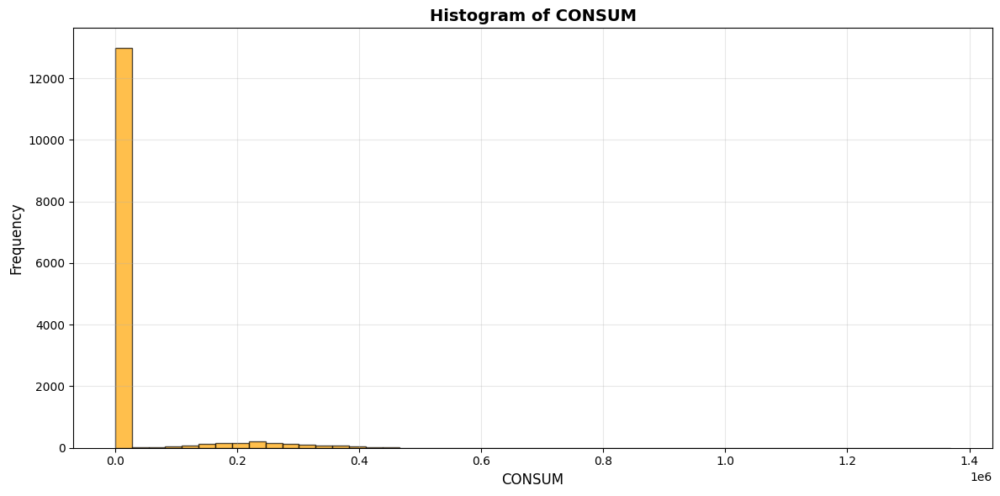

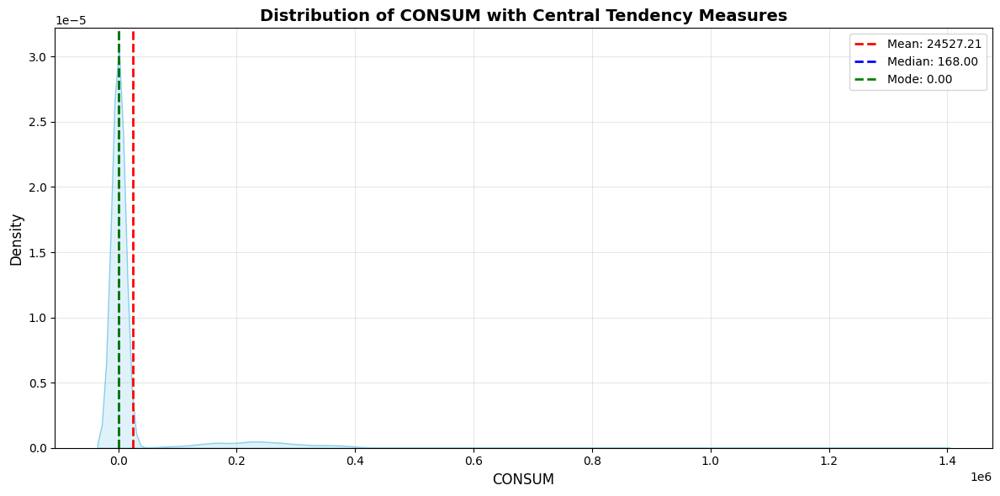

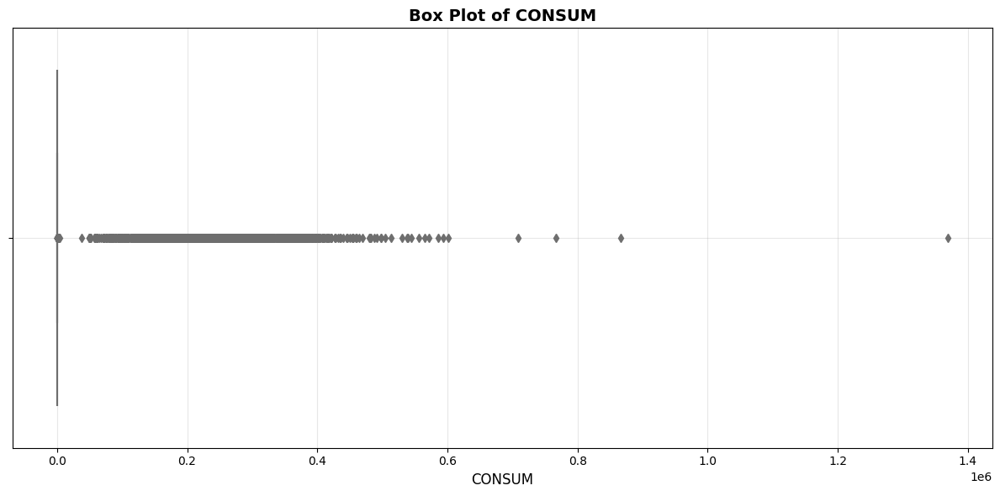

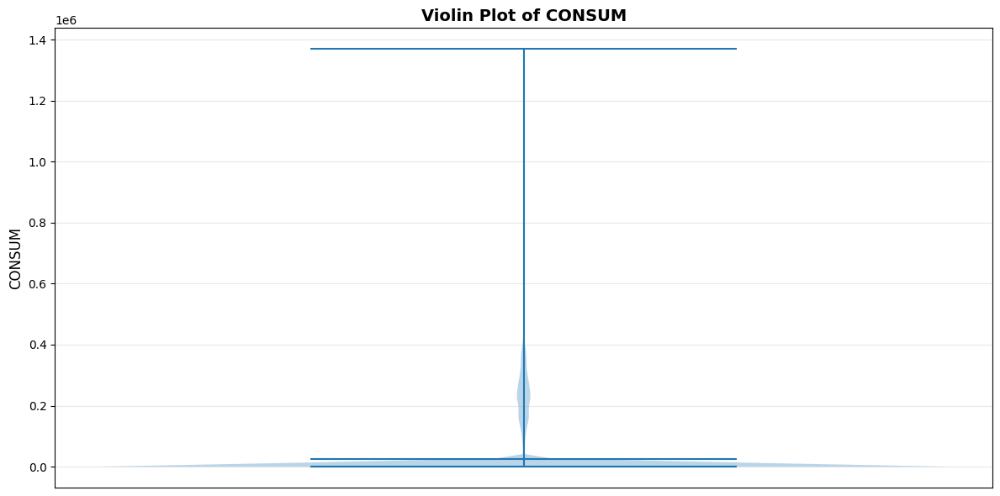


CATEGORICAL VARIABLES ANALYSIS

Categorical Columns: ['POLISSA_SUBM', 'DATA']

ANALYZING: POLISSA_SUBM

Unique Values: 10

Value Counts:
        Category  Count  Percentage
4XFL2NAR75V6CQIG   1454       10.07
6IK7MA7VMNEXSX4X   1454       10.07
UV5ZDXQTMOFLY3VR   1454       10.07
CWRMU5F7BP6LRJEQ   1454       10.07
5E3Z2LEFUIJAPAFY   1454       10.07
ESMNMUDLAMOYLGGR   1453       10.06
MUHJGPBALQP6MN6V   1453       10.06
6C3M54YW4J6HKY26   1453       10.06
QIP3NNLIZ6SRLGEO   1413        9.79
LNWMIE6QC7VVW5LO   1397        9.68


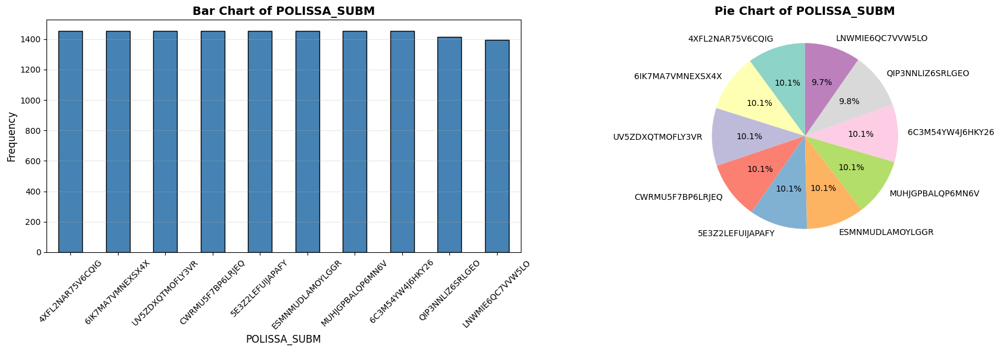


ANALYZING: DATA

Unique Values: 1456

Value Counts:
  Category  Count  Percentage
2021-01-01     10        0.07
2023-06-10     10        0.07
2023-08-13     10        0.07
2023-08-12     10        0.07
2023-08-11     10        0.07
2023-08-10     10        0.07
2023-08-09     10        0.07
2023-08-08     10        0.07
2023-08-07     10        0.07
2023-08-06     10        0.07
2023-08-05     10        0.07
2023-08-04     10        0.07
2023-08-03     10        0.07
2023-08-02     10        0.07
2023-08-01     10        0.07
2023-07-31     10        0.07
2023-07-30     10        0.07
2023-07-29     10        0.07
2023-07-28     10        0.07
2023-07-27     10        0.07
2023-07-26     10        0.07
2023-08-14     10        0.07
2023-08-15     10        0.07
2023-08-16     10        0.07
2023-08-27     10        0.07
2023-09-04     10        0.07
2023-09-03     10        0.07
2023-09-02     10        0.07
2023-09-01     10        0.07
2023-08-31     10        0.07
2023-08-30     10

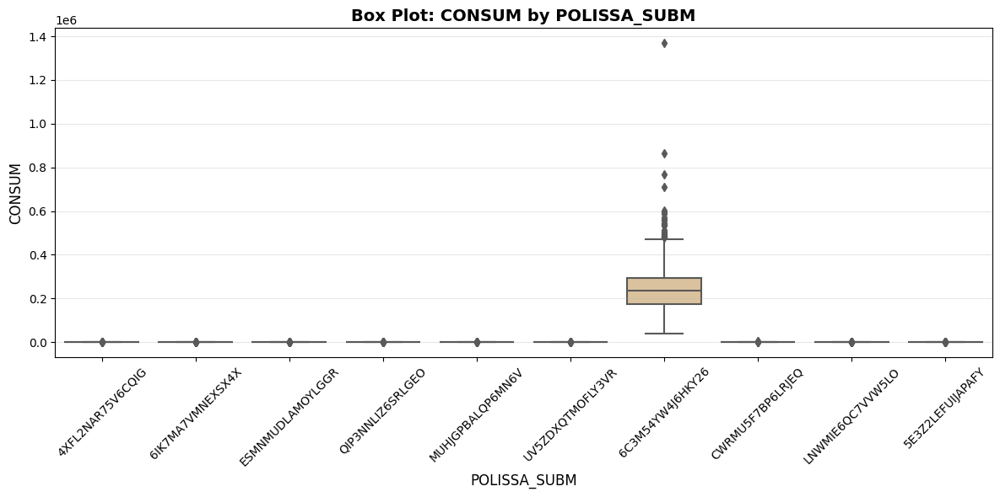


Group Statistics:
                  count        mean    median        std      min        max
POLISSA_SUBM                                                                
4XFL2NAR75V6CQIG   1454     187.246     182.0     90.274      0.0     1070.0
5E3Z2LEFUIJAPAFY   1454     148.790     140.0     93.445      0.0      848.0
6C3M54YW4J6HKY26   1453  242223.765  234440.0  97765.936  37190.0  1369300.0
6IK7MA7VMNEXSX4X   1454     197.426     184.0     73.123     21.0     1215.0
CWRMU5F7BP6LRJEQ   1454     292.479     297.0    211.299      0.0     4092.0
ESMNMUDLAMOYLGGR   1453      26.854      25.0     58.612      0.0     1365.0
LNWMIE6QC7VVW5LO   1397      40.676      15.0     54.334      0.0      561.0
MUHJGPBALQP6MN6V   1453     337.759     322.0    161.452      0.0     1756.0
QIP3NNLIZ6SRLGEO   1413      87.200      58.0    106.347      0.0     1241.0
UV5ZDXQTMOFLY3VR   1454     197.048     176.0     92.934      0.0     1074.0

ANALYSIS COMPLETE


Summary Statistics returned:
Shape: 

In [8]:
consum_dades = pd.read_parquet("Mostra Set de dades 4_Incidències en comptadors intel·ligents_Consum.parquet")
print("Running EDA on Consum Dataset...")
summary = comprehensive_eda(consum_dades)

print("\n\nSummary Statistics returned:")
print(f"Shape: {summary['shape']}")
print(f"Numerical columns: {summary['numerical_columns']}")
print(f"Categorical columns: {summary['categorical_columns']}")

Running EDA on Perímetre Dataset...
COMPREHENSIVE EXPLORATORY DATA ANALYSIS

Dataset Shape: (10, 6)
Number of Rows: 10
Number of Columns: 6

Note: 'DIAM_COMP' is numerical but has only 2 unique values. Consider treating as categorical.

DATA TYPES AND MISSING VALUES

Column Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   POLISSA_SUBM    10 non-null     object 
 1   NUM_COMPLET     10 non-null     object 
 2   DATA_INST_COMP  10 non-null     object 
 3   MARCA_COMP      10 non-null     object 
 4   CODI_MODEL      10 non-null     object 
 5   DIAM_COMP       10 non-null     float64
dtypes: float64(1), object(5)
memory usage: 612.0+ bytes
None


Missing Values Summary:
Empty DataFrame
Columns: [Column, Missing_Count, Missing_Percentage]
Index: []

NUMERICAL VARIABLES ANALYSIS

Numerical Columns: ['DIAM_COMP']

-------------------

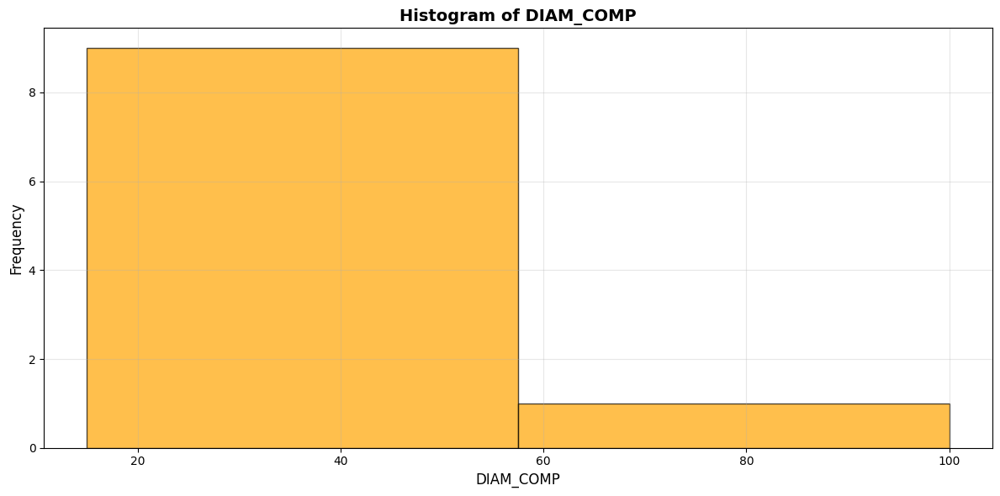

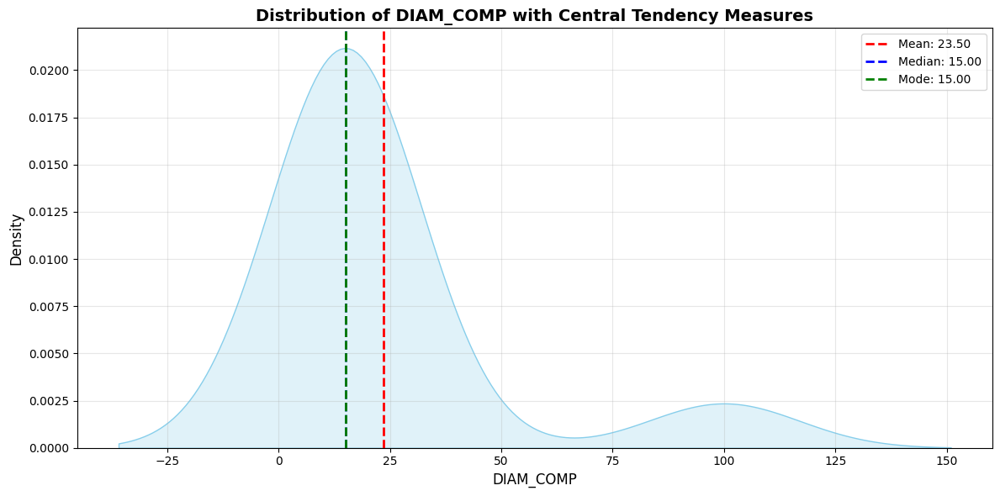

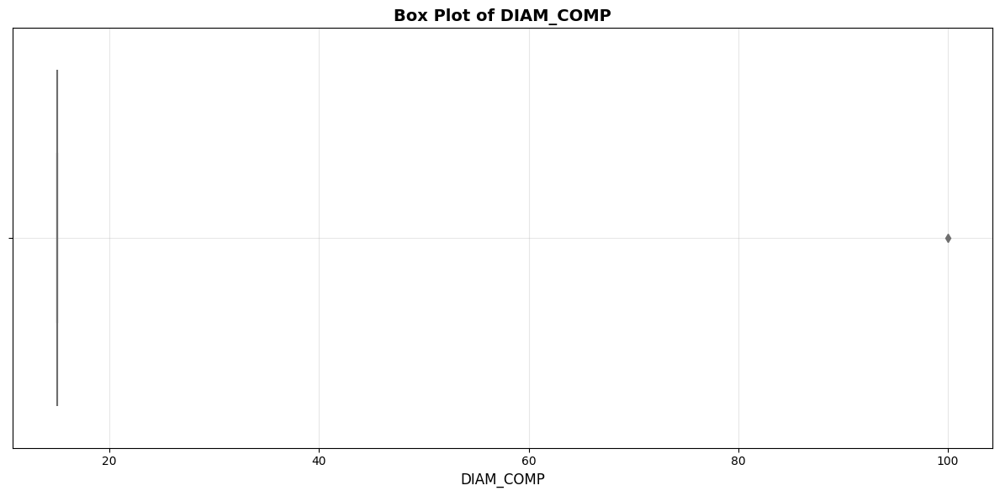

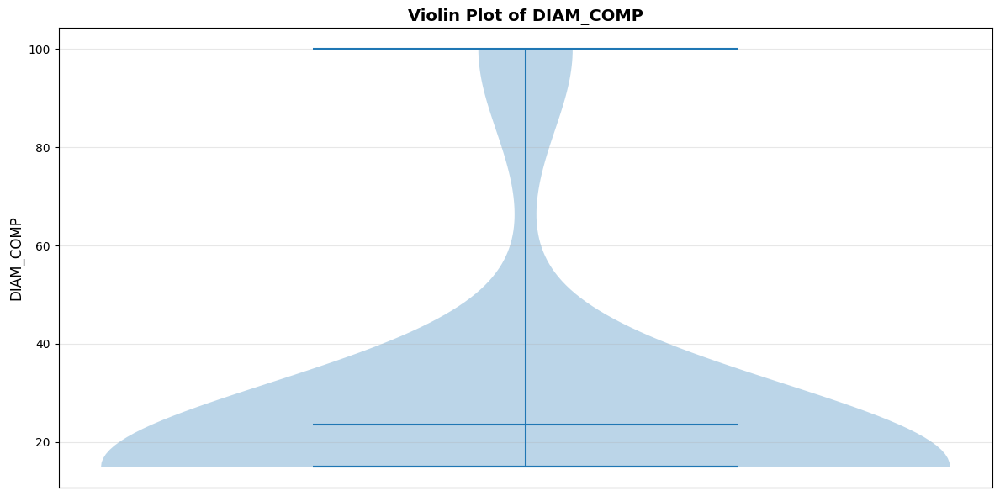


CATEGORICAL VARIABLES ANALYSIS

Categorical Columns: ['POLISSA_SUBM', 'NUM_COMPLET', 'DATA_INST_COMP', 'MARCA_COMP', 'CODI_MODEL']

ANALYZING: POLISSA_SUBM

Unique Values: 10

Value Counts:
        Category  Count  Percentage
6C3M54YW4J6HKY26      1        10.0
5E3Z2LEFUIJAPAFY      1        10.0
LNWMIE6QC7VVW5LO      1        10.0
UV5ZDXQTMOFLY3VR      1        10.0
QIP3NNLIZ6SRLGEO      1        10.0
MUHJGPBALQP6MN6V      1        10.0
ESMNMUDLAMOYLGGR      1        10.0
6IK7MA7VMNEXSX4X      1        10.0
CWRMU5F7BP6LRJEQ      1        10.0
4XFL2NAR75V6CQIG      1        10.0


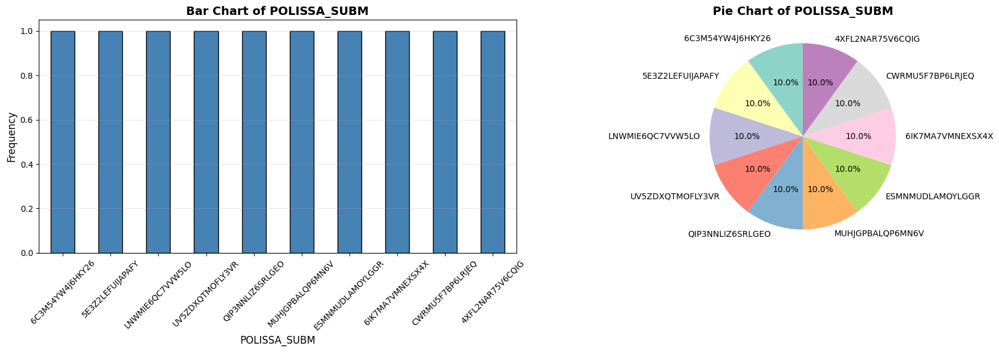


ANALYZING: NUM_COMPLET

Unique Values: 10

Value Counts:
        Category  Count  Percentage
X4MMWDS367J7UO2B      1        10.0
WRECBJB6E4LHAA2M      1        10.0
OBPNN3V4KBVK5LYF      1        10.0
ZOV6EA7YFL65DEUH      1        10.0
P2PRZV6SEE5SUP3T      1        10.0
M7FS7R4PPJTCESMF      1        10.0
NT5COFRJE6JWUUJM      1        10.0
ZVNZFWCBRKJU753Y      1        10.0
IMWONGZAQ3ZQ3N56      1        10.0
IBU3QNDABEVUQA7J      1        10.0


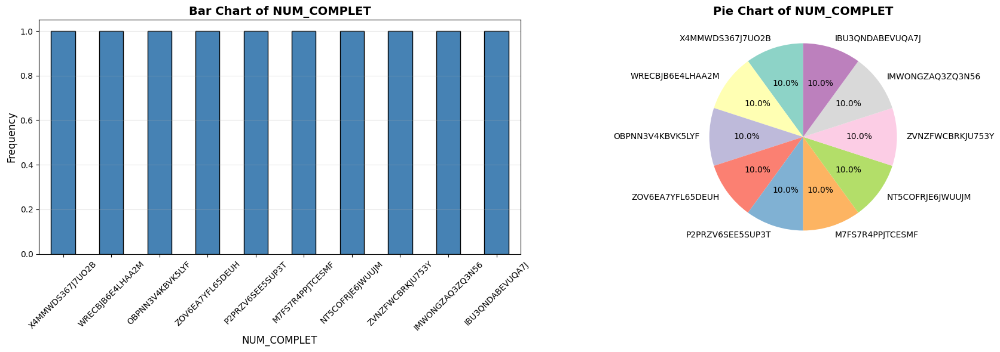


ANALYZING: DATA_INST_COMP

Unique Values: 10

Value Counts:
  Category  Count  Percentage
2014-10-23      1        10.0
2019-07-16      1        10.0
2018-06-25      1        10.0
2015-10-15      1        10.0
2014-11-26      1        10.0
2016-05-31      1        10.0
2015-07-06      1        10.0
2016-04-21      1        10.0
2017-02-13      1        10.0
2016-07-20      1        10.0


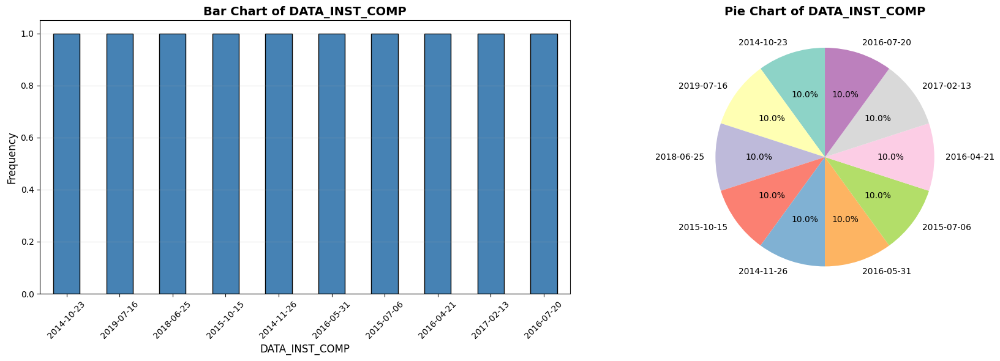


ANALYZING: MARCA_COMP

Unique Values: 3

Value Counts:
        Category  Count  Percentage
5557SZ47QZAZ56EQ      6        60.0
OKV4SQYX72EBODPA      3        30.0
R7GO7PZAU5F6DHFH      1        10.0


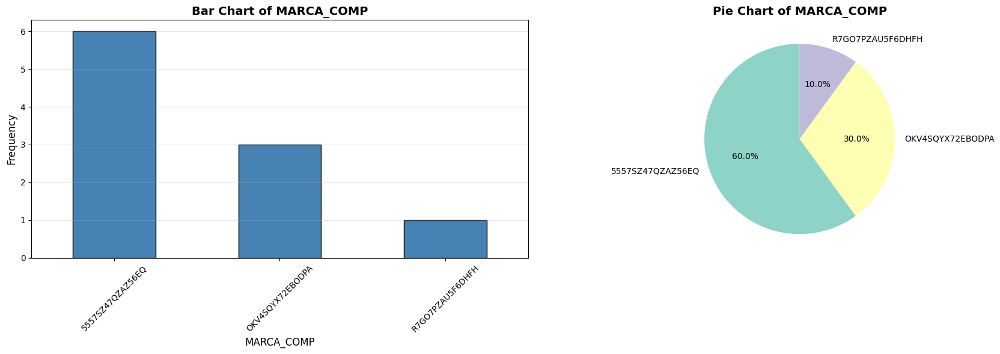


ANALYZING: CODI_MODEL

Unique Values: 6

Value Counts:
Category  Count  Percentage
      31      4        40.0
      46      2        20.0
      36      1        10.0
      63      1        10.0
      27      1        10.0
      02      1        10.0


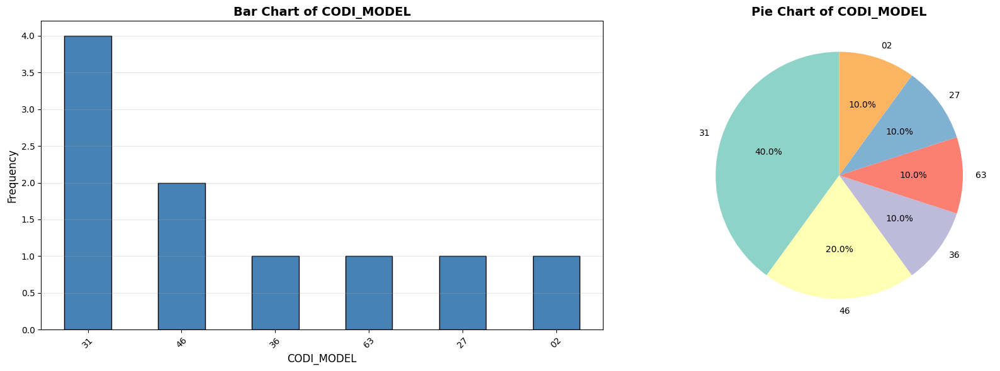


CATEGORICAL vs NUMERICAL ANALYSIS

POLISSA_SUBM vs DIAM_COMP


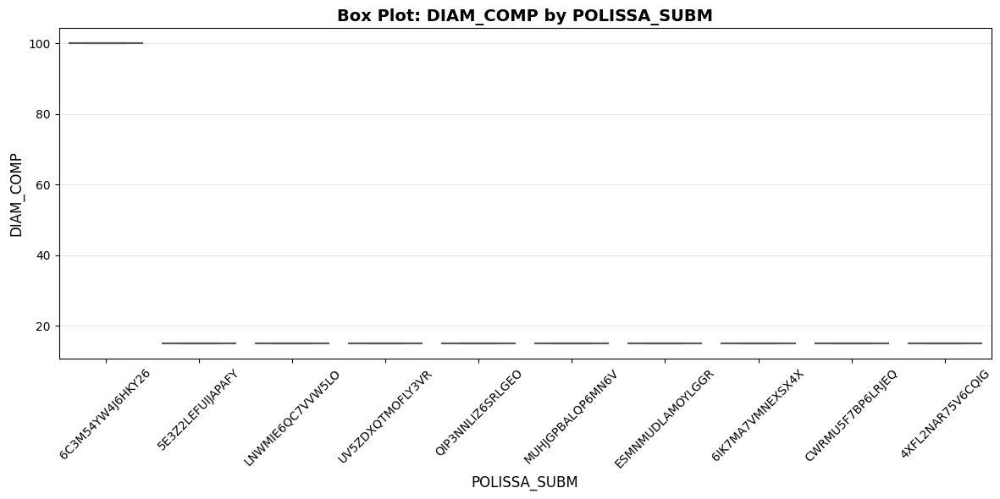


Group Statistics:
                  count   mean  median  std    min    max
POLISSA_SUBM                                             
4XFL2NAR75V6CQIG      1   15.0    15.0  NaN   15.0   15.0
5E3Z2LEFUIJAPAFY      1   15.0    15.0  NaN   15.0   15.0
6C3M54YW4J6HKY26      1  100.0   100.0  NaN  100.0  100.0
6IK7MA7VMNEXSX4X      1   15.0    15.0  NaN   15.0   15.0
CWRMU5F7BP6LRJEQ      1   15.0    15.0  NaN   15.0   15.0
ESMNMUDLAMOYLGGR      1   15.0    15.0  NaN   15.0   15.0
LNWMIE6QC7VVW5LO      1   15.0    15.0  NaN   15.0   15.0
MUHJGPBALQP6MN6V      1   15.0    15.0  NaN   15.0   15.0
QIP3NNLIZ6SRLGEO      1   15.0    15.0  NaN   15.0   15.0
UV5ZDXQTMOFLY3VR      1   15.0    15.0  NaN   15.0   15.0

NUM_COMPLET vs DIAM_COMP


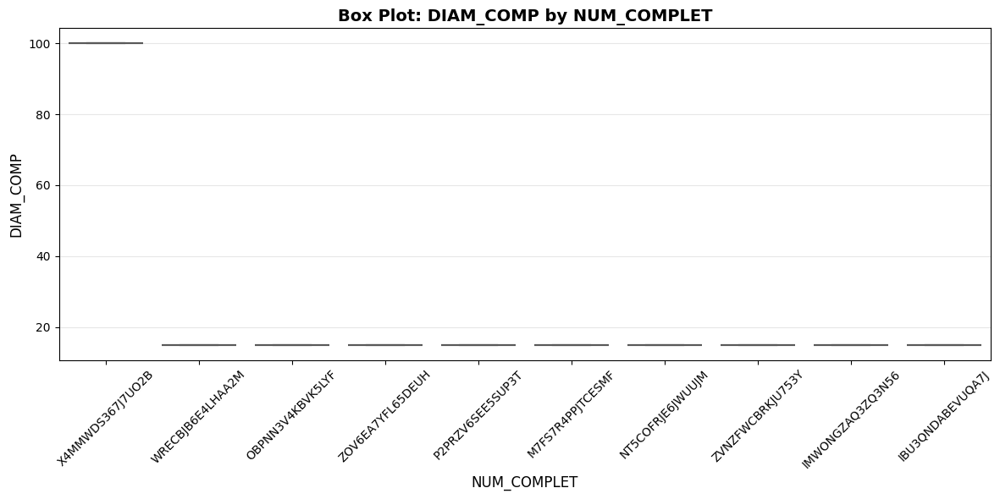


Group Statistics:
                  count   mean  median  std    min    max
NUM_COMPLET                                              
IBU3QNDABEVUQA7J      1   15.0    15.0  NaN   15.0   15.0
IMWONGZAQ3ZQ3N56      1   15.0    15.0  NaN   15.0   15.0
M7FS7R4PPJTCESMF      1   15.0    15.0  NaN   15.0   15.0
NT5COFRJE6JWUUJM      1   15.0    15.0  NaN   15.0   15.0
OBPNN3V4KBVK5LYF      1   15.0    15.0  NaN   15.0   15.0
P2PRZV6SEE5SUP3T      1   15.0    15.0  NaN   15.0   15.0
WRECBJB6E4LHAA2M      1   15.0    15.0  NaN   15.0   15.0
X4MMWDS367J7UO2B      1  100.0   100.0  NaN  100.0  100.0
ZOV6EA7YFL65DEUH      1   15.0    15.0  NaN   15.0   15.0
ZVNZFWCBRKJU753Y      1   15.0    15.0  NaN   15.0   15.0

ANALYSIS COMPLETE


Summary Statistics returned:
Shape: (10, 6)
Numerical columns: ['DIAM_COMP']
Categorical columns: ['POLISSA_SUBM', 'NUM_COMPLET', 'DATA_INST_COMP', 'MARCA_COMP', 'CODI_MODEL']


In [9]:
perimetre_dades = pd.read_parquet("Mostra Set de dades 4_Incidències en comptadors intel·ligents_Perímetre.parquet")
print("Running EDA on Perímetre Dataset...")
summary = comprehensive_eda(perimetre_dades)

print("\n\nSummary Statistics returned:")
print(f"Shape: {summary['shape']}")
print(f"Numerical columns: {summary['numerical_columns']}")
print(f"Categorical columns: {summary['categorical_columns']}")

In [10]:
perimetre_dades.head()

,POLISSA_SUBM,NUM_COMPLET,DATA_INST_COMP,MARCA_COMP,CODI_MODEL,DIAM_COMP
0,6C3M54YW4J6HKY26,X4MMWDS367J7UO2B,2014-10-23,5557SZ47QZAZ56EQ,36,100.0
1,5E3Z2LEFUIJAPAFY,WRECBJB6E4LHAA2M,2019-07-16,5557SZ47QZAZ56EQ,63,15.0
2,LNWMIE6QC7VVW5LO,OBPNN3V4KBVK5LYF,2018-06-25,OKV4SQYX72EBODPA,27,15.0
3,UV5ZDXQTMOFLY3VR,ZOV6EA7YFL65DEUH,2015-10-15,OKV4SQYX72EBODPA,46,15.0
4,QIP3NNLIZ6SRLGEO,P2PRZV6SEE5SUP3T,2014-11-26,OKV4SQYX72EBODPA,46,15.0


In [11]:
perimetre_dades[perimetre_dades['MARCA_COMP'] == '5557SZ47QZAZ56EQ'].shape

(6, 6)

In [12]:
perimetre_dades.shape

(10, 6)

In [13]:
perimetre_dades.head(100)

,POLISSA_SUBM,NUM_COMPLET,DATA_INST_COMP,MARCA_COMP,CODI_MODEL,DIAM_COMP
0,6C3M54YW4J6HKY26,X4MMWDS367J7UO2B,2014-10-23,5557SZ47QZAZ56EQ,36,100.0
1,5E3Z2LEFUIJAPAFY,WRECBJB6E4LHAA2M,2019-07-16,5557SZ47QZAZ56EQ,63,15.0
2,LNWMIE6QC7VVW5LO,OBPNN3V4KBVK5LYF,2018-06-25,OKV4SQYX72EBODPA,27,15.0
3,UV5ZDXQTMOFLY3VR,ZOV6EA7YFL65DEUH,2015-10-15,OKV4SQYX72EBODPA,46,15.0
4,QIP3NNLIZ6SRLGEO,P2PRZV6SEE5SUP3T,2014-11-26,OKV4SQYX72EBODPA,46,15.0
5,MUHJGPBALQP6MN6V,M7FS7R4PPJTCESMF,2016-05-31,5557SZ47QZAZ56EQ,31,15.0
6,ESMNMUDLAMOYLGGR,NT5COFRJE6JWUUJM,2015-07-06,5557SZ47QZAZ56EQ,31,15.0
7,6IK7MA7VMNEXSX4X,ZVNZFWCBRKJU753Y,2016-04-21,5557SZ47QZAZ56EQ,31,15.0
8,CWRMU5F7BP6LRJEQ,IMWONGZAQ3ZQ3N56,2017-02-13,R7GO7PZAU5F6DHFH,02,15.0
9,4XFL2NAR75V6CQIG,IBU3QNDABEVUQA7J,2016-07-20,5557SZ47QZAZ56EQ,31,15.0


In [14]:
perimetre_dades[perimetre_dades['POLISSA_SUBM'] == '4XFL2NAR75V6CQIG']

,POLISSA_SUBM,NUM_COMPLET,DATA_INST_COMP,MARCA_COMP,CODI_MODEL,DIAM_COMP
9,4XFL2NAR75V6CQIG,IBU3QNDABEVUQA7J,2016-07-20,5557SZ47QZAZ56EQ,31,15.0


In [15]:
consum_dades.head(100)

,POLISSA_SUBM,DATA,CONSUM
0,4XFL2NAR75V6CQIG,2021-01-01,231.0
1,4XFL2NAR75V6CQIG,2021-01-02,176.0
2,4XFL2NAR75V6CQIG,2021-01-03,222.0
3,4XFL2NAR75V6CQIG,2021-01-04,240.0
4,4XFL2NAR75V6CQIG,2021-01-05,224.0
...,...,...,...
95,4XFL2NAR75V6CQIG,2021-04-06,174.0
96,4XFL2NAR75V6CQIG,2021-04-07,75.0
97,4XFL2NAR75V6CQIG,2021-04-08,218.0
98,4XFL2NAR75V6CQIG,2021-04-09,267.0


MODULAR EDA TOOLKIT - EXAMPLE USAGE

EXAMPLE 1: Quick Summary with 95th Percentile Filtering
QUICK DATASET SUMMARY
✓ Dropped columns: ['size']
📊 Filtering data to 95th percentile...
✓ Filtered 24 rows (9.84%) as outliers
✓ Remaining data: 220 rows

Original Shape: (244, 7)
After dropping columns: (220, 6)
After percentile filtering: (220, 6)

Final Shape: (220, 6)
Rows: 220
Columns: 6

Numerical Columns (2): ['total_bill', 'tip']
Categorical Columns (4): ['sex', 'smoker', 'day', 'time']

--------------------------------------------------------------------------------
Missing Values:
Empty DataFrame
Columns: [Count, Percentage]
Index: []

--------------------------------------------------------------------------------
Numerical Variables Summary:
       total_bill     tip
count      220.00  220.00
mean        19.05    2.88
std          7.25    1.05
min          8.35    1.25
25%         13.42    2.00
50%         17.55    2.86
75%         22.89    3.50
max         41.19    5.85


EXAMPLE 

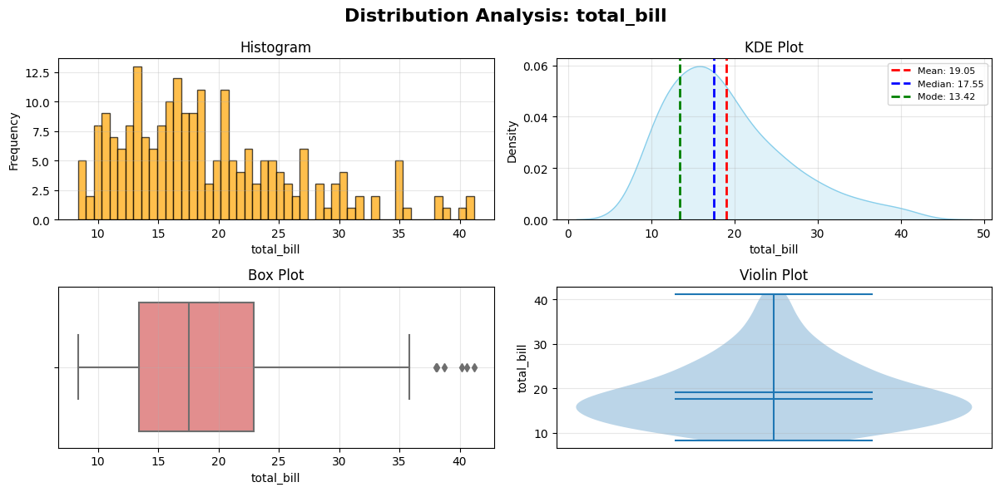



EXAMPLE 3: Correlation Analysis (on filtered data)


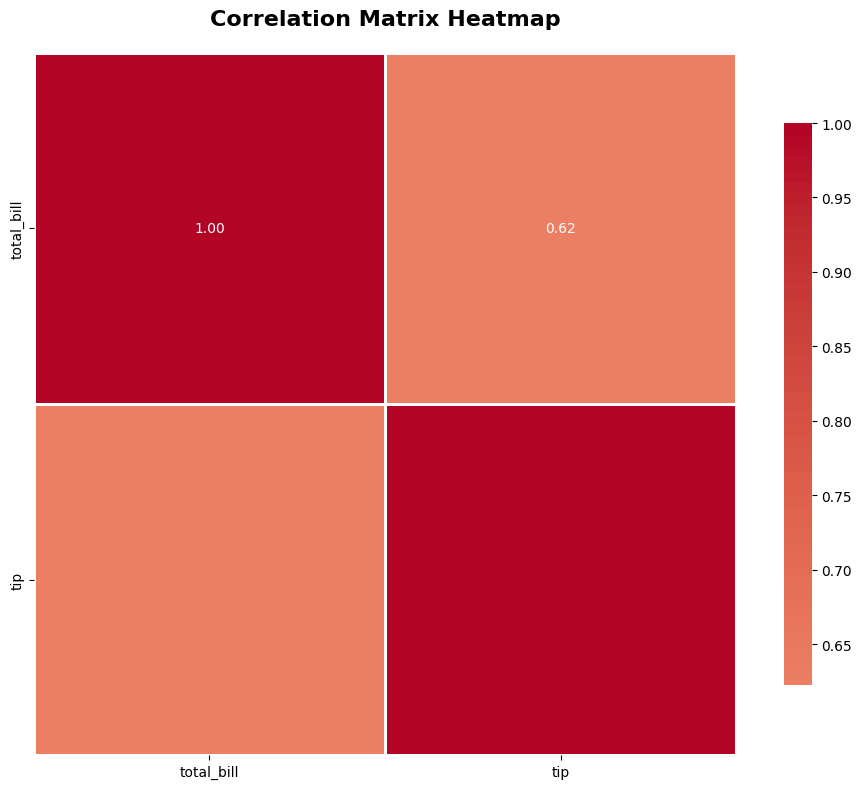


Strong Correlations (|r| > 0.5):
total_bill <-> tip: 0.623


EXAMPLE 4: Scatter Plot Analysis


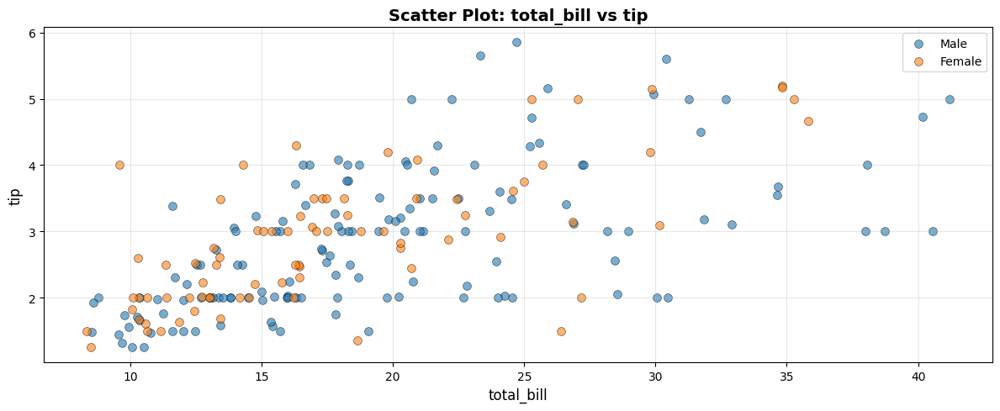

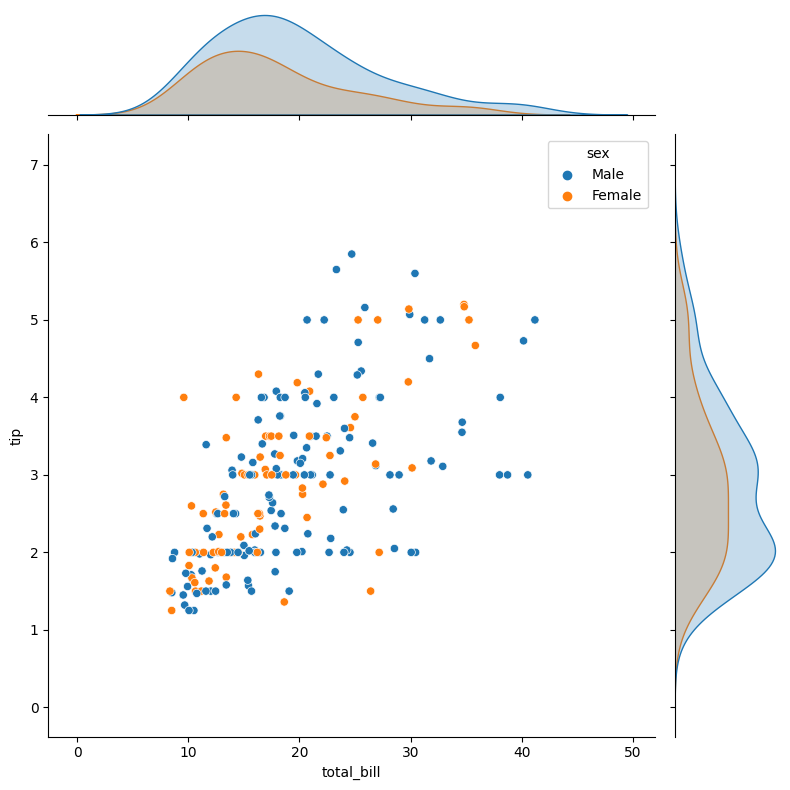



EXAMPLE 5: Categorical Variable Analysis

CATEGORICAL ANALYSIS: day

Unique Values: 4

Value Counts:
Category  Count  Percentage
     Sat     74       33.64
     Sun     70       31.82
    Thur     58       26.36
     Fri     18        8.18


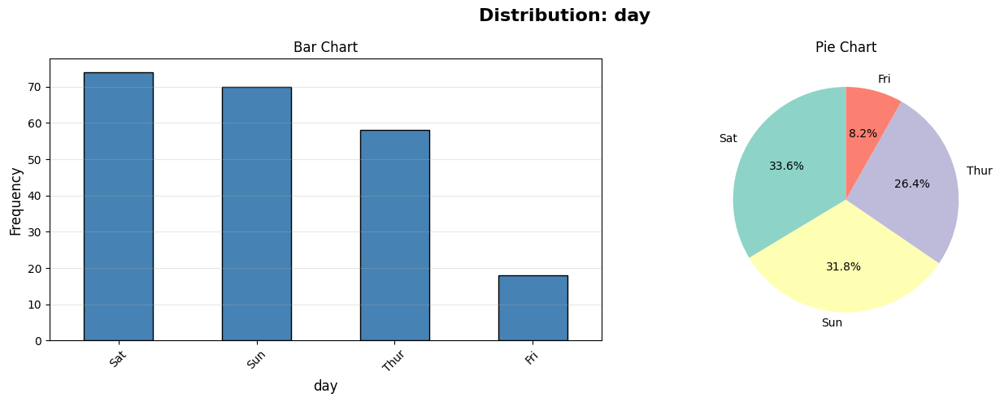



EXAMPLE 6: Categorical vs Numerical Analysis

day vs tip
------------------------------------------------------------

Group Statistics:
      count   mean  median    std   min   max
day                                          
Thur     58  2.702   2.305  1.114  1.25  5.85
Fri      18  2.831   3.000  0.956  1.50  4.73
Sat      74  2.776   2.815  0.927  1.25  5.16
Sun      70  3.146   3.085  1.102  1.32  5.65


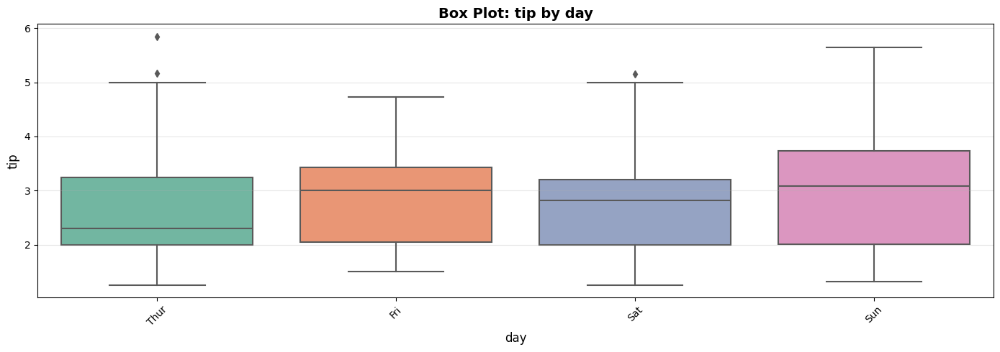

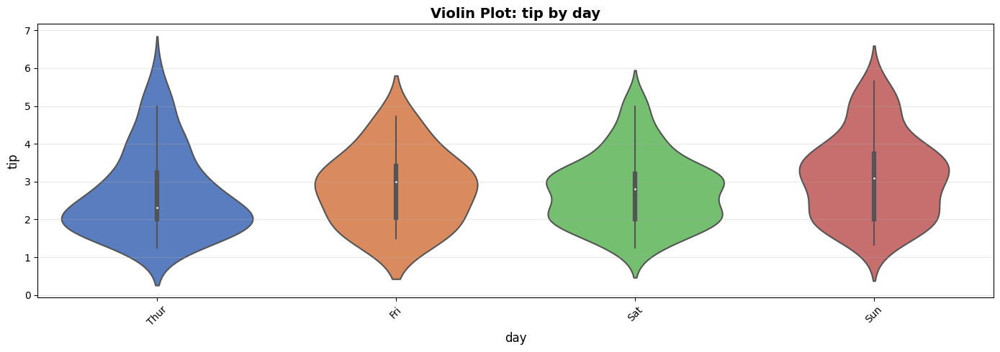



EXAMPLE 7: Using filter_dataframe directly
✓ Dropped columns: ['smoker', 'size']
📊 Filtering data to 99th percentile...
✓ Filtered 8 rows (3.28%) as outliers
✓ Remaining data: 236 rows

Filtering results:
Original shape: (244, 7)
Dropped columns: ['smoker', 'size']
Filtered rows: 8
Final shape: (236, 5)


In [16]:
# ===================================
# UTILITY FUNCTIONS
# ===================================

def filter_dataframe(df, percentile=100, columns_to_drop=None):
    """
    Filter dataframe by percentile and drop specified columns.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        The dataframe to filter
    percentile : float, default=100
        Percentile threshold for filtering outliers (e.g., 99 keeps data within 99th percentile)
        Value must be between 0 and 100. Use 100 to keep all data.
    columns_to_drop : list, default=None
        List of column names to exclude
    
    Returns:
    --------
    pandas.DataFrame : Filtered dataframe
    dict : Information about filtering applied
    """
    # Validate percentile parameter
    if not 0 < percentile <= 100:
        raise ValueError("Percentile must be between 0 and 100")
    
    # Create a copy to avoid modifying original dataframe
    df_filtered = df.copy()
    filter_info = {
        'original_shape': df.shape,
        'dropped_columns': [],
        'filtered_rows': 0,
        'final_shape': None
    }
    
    # Drop specified columns
    if columns_to_drop is not None:
        if not isinstance(columns_to_drop, list):
            columns_to_drop = [columns_to_drop]
        
        # Validate columns exist
        invalid_cols = [col for col in columns_to_drop if col not in df_filtered.columns]
        if invalid_cols:
            print(f"⚠️  Warning: Columns not found and will be ignored: {invalid_cols}")
        
        valid_cols_to_drop = [col for col in columns_to_drop if col in df_filtered.columns]
        if valid_cols_to_drop:
            df_filtered = df_filtered.drop(columns=valid_cols_to_drop)
            filter_info['dropped_columns'] = valid_cols_to_drop
            print(f"✓ Dropped columns: {valid_cols_to_drop}")
    
    # Filter outliers based on percentile
    if percentile < 100:
        print(f"📊 Filtering data to {percentile}th percentile...")
        numerical_cols = df_filtered.select_dtypes(include=[np.number]).columns.tolist()
        
        original_rows = df_filtered.shape[0]
        
        # Calculate percentile bounds for each numerical column
        for col in numerical_cols:
            lower_bound = df_filtered[col].quantile((100 - percentile) / 200)
            upper_bound = df_filtered[col].quantile((100 + percentile) / 200)
            df_filtered = df_filtered[(df_filtered[col] >= lower_bound) & (df_filtered[col] <= upper_bound)]
        
        filtered_rows = original_rows - df_filtered.shape[0]
        filter_info['filtered_rows'] = filtered_rows
        filtered_pct = (filtered_rows / original_rows * 100)
        print(f"✓ Filtered {filtered_rows:,} rows ({filtered_pct:.2f}%) as outliers")
        print(f"✓ Remaining data: {df_filtered.shape[0]:,} rows")
    
    filter_info['final_shape'] = df_filtered.shape
    
    return df_filtered, filter_info

# ===================================
# NUMERICAL ANALYSIS FUNCTIONS
# ===================================

def analyze_numerical_distribution(df, column, figsize=(12, 6)):
    """
    Analyze distribution of a numerical variable with multiple plots.
    
    Parameters:
    -----------
    df : pandas.DataFrame
    column : str - Column name to analyze
    figsize : tuple - Figure size
    """
    print(f"\n{'='*60}")
    print(f"DISTRIBUTION ANALYSIS: {column}")
    print("="*60)
    
    # Calculate statistics
    col_mean = df[column].mean()
    col_median = df[column].median()
    try:
        col_mode = mode(df[column].dropna())
    except:
        col_mode = df[column].mode()[0] if len(df[column].mode()) > 0 else np.nan
    
    col_std = df[column].std()
    col_min = df[column].min()
    col_max = df[column].max()
    col_skew = df[column].skew()
    col_kurt = df[column].kurtosis()
    
    print(f"\nMean:     {col_mean:.3f}")
    print(f"Median:   {col_median:.3f}")
    print(f"Mode:     {col_mode:.3f}")
    print(f"Std Dev:  {col_std:.3f}")
    print(f"Min:      {col_min:.3f}")
    print(f"Max:      {col_max:.3f}")
    print(f"Skewness: {col_skew:.3f}")
    print(f"Kurtosis: {col_kurt:.3f}")
    
    # Create subplots
    fig, axes = plt.subplots(2, 2, figsize=figsize)
    fig.suptitle(f'Distribution Analysis: {column}', fontsize=16, fontweight='bold')
    
    # 1. Histogram
    axes[0, 0].hist(df[column].dropna(), bins=min(50, df[column].nunique()), 
                    color='orange', edgecolor='black', alpha=0.7)
    axes[0, 0].set_xlabel(column)
    axes[0, 0].set_ylabel('Frequency')
    axes[0, 0].set_title('Histogram')
    axes[0, 0].grid(alpha=0.3)
    
    # 2. KDE with mean, median, mode
    sns.kdeplot(data=df[column].dropna(), fill=True, color='skyblue', ax=axes[0, 1])
    axes[0, 1].axvline(col_mean, color='r', linestyle='--', linewidth=2, label=f'Mean: {col_mean:.2f}')
    axes[0, 1].axvline(col_median, color='b', linestyle='--', linewidth=2, label=f'Median: {col_median:.2f}')
    axes[0, 1].axvline(col_mode, color='g', linestyle='--', linewidth=2, label=f'Mode: {col_mode:.2f}')
    axes[0, 1].set_xlabel(column)
    axes[0, 1].set_ylabel('Density')
    axes[0, 1].set_title('KDE Plot')
    axes[0, 1].legend(fontsize=8)
    axes[0, 1].grid(alpha=0.3)
    
    # 3. Box plot
    sns.boxplot(x=df[column], ax=axes[1, 0], color='lightcoral')
    axes[1, 0].set_xlabel(column)
    axes[1, 0].set_title('Box Plot')
    axes[1, 0].grid(alpha=0.3)
    
    # 4. Violin plot
    parts = axes[1, 1].violinplot([df[column].dropna()], positions=[0], 
                                   showmeans=True, showmedians=True, showextrema=True)
    axes[1, 1].set_ylabel(column)
    axes[1, 1].set_title('Violin Plot')
    axes[1, 1].set_xticks([])
    axes[1, 1].grid(alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    return {
        'mean': col_mean,
        'median': col_median,
        'mode': col_mode,
        'std': col_std,
        'min': col_min,
        'max': col_max,
        'skewness': col_skew,
        'kurtosis': col_kurt
    }


def plot_correlation_matrix(df, columns=None, figsize=(10, 8), annot=True):
    """
    Plot correlation matrix heatmap for numerical columns.
    
    Parameters:
    -----------
    df : pandas.DataFrame
    columns : list - Specific columns to include (default: all numerical)
    figsize : tuple - Figure size
    annot : bool - Show correlation values on heatmap
    """
    if columns is None:
        columns = df.select_dtypes(include=[np.number]).columns.tolist()
    
    corr_matrix = df[columns].corr()
    
    plt.figure(figsize=figsize)
    sns.heatmap(corr_matrix, annot=annot, cmap='coolwarm', center=0, 
               fmt='.2f', square=True, linewidths=1, cbar_kws={"shrink": 0.8})
    plt.title('Correlation Matrix Heatmap', fontsize=16, fontweight='bold', pad=20)
    plt.tight_layout()
    plt.show()
    
    # Print strong correlations
    print("\nStrong Correlations (|r| > 0.5):")
    for i in range(len(corr_matrix.columns)):
        for j in range(i+1, len(corr_matrix.columns)):
            if abs(corr_matrix.iloc[i, j]) > 0.5:
                print(f"{corr_matrix.columns[i]} <-> {corr_matrix.columns[j]}: {corr_matrix.iloc[i, j]:.3f}")
    
    return corr_matrix


def plot_scatter_relationship(df, x_col, y_col, figsize=(12, 5), hue=None):
    """
    Plot scatter plot with regression line and joint plot.
    
    Parameters:
    -----------
    df : pandas.DataFrame
    x_col : str - X-axis column
    y_col : str - Y-axis column
    figsize : tuple - Figure size for scatter plot
    hue : str - Column for color coding (optional)
    """
    # Scatter plot
    plt.figure(figsize=figsize)
    if hue and hue in df.columns:
        for category in df[hue].unique():
            mask = df[hue] == category
            plt.scatter(df[mask][x_col], df[mask][y_col], 
                       label=category, s=50, alpha=0.6, edgecolors='black', linewidth=0.5)
        plt.legend()
    else:
        plt.scatter(df[x_col], df[y_col], s=50, alpha=0.6, 
                   c=df[x_col], cmap='viridis', edgecolors='black', linewidth=0.5)
        plt.colorbar(label=x_col)
    
    plt.xlabel(x_col, fontsize=12)
    plt.ylabel(y_col, fontsize=12)
    plt.title(f'Scatter Plot: {x_col} vs {y_col}', fontsize=14, fontweight='bold')
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Joint plot
    if hue and hue in df.columns and df[hue].nunique() <= 5:
        sns.jointplot(x=x_col, y=y_col, data=df, hue=hue, height=8)
    else:
        sns.jointplot(x=x_col, y=y_col, data=df, kind="reg", height=8)
    plt.tight_layout()
    plt.show()


def plot_pairwise_relationships(df, columns=None, hue=None, figsize=2.5):
    """
    Create pairplot showing all pairwise relationships.
    
    Parameters:
    -----------
    df : pandas.DataFrame
    columns : list - Columns to include (default: all numerical)
    hue : str - Column for color coding
    figsize : float - Size of each subplot
    """
    if columns is None:
        columns = df.select_dtypes(include=[np.number]).columns.tolist()
    
    if len(columns) > 6:
        print(f"Warning: {len(columns)} columns is a lot for a pairplot. Consider selecting fewer columns.")
        return None
    
    if hue and hue in df.columns and df[hue].nunique() <= 5:
        sns.pairplot(data=df, vars=columns, hue=hue, diag_kind='kde', height=figsize)
    else:
        sns.pairplot(data=df[columns], diag_kind='kde', height=figsize)
    
    plt.suptitle('Pairwise Relationships', y=1.02, fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()


# ===================================
# CATEGORICAL ANALYSIS FUNCTIONS
# ===================================

def analyze_categorical_variable(df, column, figsize=(14, 5)):
    """
    Analyze a categorical variable with value counts and visualizations.
    
    Parameters:
    -----------
    df : pandas.DataFrame
    column : str - Column name to analyze
    figsize : tuple - Figure size
    """
    print(f"\n{'='*60}")
    print(f"CATEGORICAL ANALYSIS: {column}")
    print("="*60)
    
    value_counts = df[column].value_counts()
    value_percentages = df[column].value_counts(normalize=True) * 100
    
    summary_df = pd.DataFrame({
        'Category': value_counts.index,
        'Count': value_counts.values,
        'Percentage': value_percentages.values.round(2)
    })
    
    print(f"\nUnique Values: {df[column].nunique()}")
    print(f"\nValue Counts:")
    print(summary_df.to_string(index=False))
    
    if df[column].nunique() <= 20:
        fig, axes = plt.subplots(1, 2, figsize=figsize)
        fig.suptitle(f'Distribution: {column}', fontsize=16, fontweight='bold')
        
        # Bar plot
        value_counts.plot(kind='bar', ax=axes[0], color='steelblue', edgecolor='black')
        axes[0].set_xlabel(column, fontsize=12)
        axes[0].set_ylabel('Frequency', fontsize=12)
        axes[0].set_title('Bar Chart')
        axes[0].grid(alpha=0.3, axis='y')
        axes[0].tick_params(axis='x', rotation=45)
        
        # Pie chart
        colors = plt.cm.Set3(range(len(value_counts)))
        axes[1].pie(value_counts, labels=value_counts.index, autopct='%1.1f%%',
                   colors=colors, startangle=90)
        axes[1].set_title('Pie Chart')
        
        plt.tight_layout()
        plt.show()
    else:
        print(f"\nNote: {df[column].nunique()} categories - too many to plot effectively.")
    
    return summary_df


def plot_categorical_vs_numerical(df, cat_col, num_col, figsize=(14, 5), plot_type='both'):
    """
    Visualize relationship between categorical and numerical variables.
    
    Parameters:
    -----------
    df : pandas.DataFrame
    cat_col : str - Categorical column
    num_col : str - Numerical column
    figsize : tuple - Figure size
    plot_type : str - 'box', 'violin', or 'both'
    """
    print(f"\n{cat_col} vs {num_col}")
    print("-" * 60)
    
    # Group statistics
    group_stats = df.groupby(cat_col)[num_col].agg(['count', 'mean', 'median', 'std', 'min', 'max'])
    print("\nGroup Statistics:")
    print(group_stats.round(3))
    
    # Plotting
    if plot_type in ['box', 'both']:
        plt.figure(figsize=figsize)
        sns.boxplot(data=df, x=cat_col, y=num_col, palette='Set2')
        plt.xlabel(cat_col, fontsize=12)
        plt.ylabel(num_col, fontsize=12)
        plt.title(f'Box Plot: {num_col} by {cat_col}', fontsize=14, fontweight='bold')
        plt.xticks(rotation=45)
        plt.grid(alpha=0.3, axis='y')
        plt.tight_layout()
        plt.show()
    
    if plot_type in ['violin', 'both'] and df[cat_col].nunique() <= 5:
        plt.figure(figsize=figsize)
        sns.violinplot(data=df, x=cat_col, y=num_col, palette='muted')
        plt.xlabel(cat_col, fontsize=12)
        plt.ylabel(num_col, fontsize=12)
        plt.title(f'Violin Plot: {num_col} by {cat_col}', fontsize=14, fontweight='bold')
        plt.xticks(rotation=45)
        plt.grid(alpha=0.3, axis='y')
        plt.tight_layout()
        plt.show()
    
    return group_stats


# ===================================
# SUMMARY FUNCTIONS
# ===================================

def quick_summary(df, percentile=100, columns_to_drop=None):
    """
    Print quick summary of dataframe.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        The dataframe to analyze
    percentile : float, default=100
        Percentile threshold for filtering outliers
    columns_to_drop : list, default=None
        List of column names to exclude
    """
    print("="*80)
    print("QUICK DATASET SUMMARY")
    print("="*80)
    
    # Apply filtering
    df_filtered, filter_info = filter_dataframe(df, percentile, columns_to_drop)
    
    print(f"\nOriginal Shape: {filter_info['original_shape']}")
    if filter_info['dropped_columns']:
        print(f"After dropping columns: {df_filtered.shape}")
    if filter_info['filtered_rows'] > 0:
        print(f"After percentile filtering: {filter_info['final_shape']}")
    
    print(f"\nFinal Shape: {df_filtered.shape}")
    print(f"Rows: {df_filtered.shape[0]:,}")
    print(f"Columns: {df_filtered.shape[1]}")
    
    numerical_cols = df_filtered.select_dtypes(include=[np.number]).columns.tolist()
    categorical_cols = df_filtered.select_dtypes(include=['object', 'category']).columns.tolist()
    
    print(f"\nNumerical Columns ({len(numerical_cols)}): {numerical_cols}")
    print(f"Categorical Columns ({len(categorical_cols)}): {categorical_cols}")
    
    print("\n" + "-"*80)
    print("Missing Values:")
    missing = df_filtered.isnull().sum()
    missing_pct = (missing / len(df_filtered) * 100).round(2)
    missing_df = pd.DataFrame({'Count': missing, 'Percentage': missing_pct})
    print(missing_df[missing_df['Count'] > 0])
    
    if len(numerical_cols) > 0:
        print("\n" + "-"*80)
        print("Numerical Variables Summary:")
        print(df_filtered[numerical_cols].describe().round(2))
    
    return {
        'numerical_cols': numerical_cols,
        'categorical_cols': categorical_cols,
        'missing': missing_df,
        'filtered_df': df_filtered,
        'filter_info': filter_info
    }


# ===================================
# EXAMPLE USAGE
# ===================================

if __name__ == "__main__":
    # Load example dataset
    tips = sns.load_dataset('tips')
    
    print("MODULAR EDA TOOLKIT - EXAMPLE USAGE\n")
    
    # 1. Quick Summary with filtering
    print("="*80)
    print("EXAMPLE 1: Quick Summary with 95th Percentile Filtering")
    print("="*80)
    summary = quick_summary(tips, percentile=95, columns_to_drop=['size'])
    
    # Get filtered dataframe for further analysis
    df_filtered = summary['filtered_df']
    
    # 2. Analyze individual numerical variables (using filtered data)
    print("\n\n" + "="*80)
    print("EXAMPLE 2: Analyzing 'total_bill' distribution (on filtered data)")
    print("="*80)
    stats = analyze_numerical_distribution(df_filtered, 'total_bill')
    
    # 3. Correlation matrix
    print("\n\n" + "="*80)
    print("EXAMPLE 3: Correlation Analysis (on filtered data)")
    print("="*80)
    corr = plot_correlation_matrix(df_filtered)
    
    # 4. Scatter relationships
    print("\n\n" + "="*80)
    print("EXAMPLE 4: Scatter Plot Analysis")
    print("="*80)
    plot_scatter_relationship(df_filtered, 'total_bill', 'tip', hue='sex')
    
    # 5. Categorical analysis
    print("\n\n" + "="*80)
    print("EXAMPLE 5: Categorical Variable Analysis")
    print("="*80)
    cat_summary = analyze_categorical_variable(df_filtered, 'day')
    
    # 6. Categorical vs Numerical
    print("\n\n" + "="*80)
    print("EXAMPLE 6: Categorical vs Numerical Analysis")
    print("="*80)
    group_stats = plot_categorical_vs_numerical(df_filtered, 'day', 'tip')
    
    # Example showing direct filter usage
    print("\n\n" + "="*80)
    print("EXAMPLE 7: Using filter_dataframe directly")
    print("="*80)
    df_custom, info = filter_dataframe(tips, percentile=99, columns_to_drop=['smoker', 'size'])
    print(f"\nFiltering results:")
    print(f"Original shape: {info['original_shape']}")
    print(f"Dropped columns: {info['dropped_columns']}")
    print(f"Filtered rows: {info['filtered_rows']}")
    print(f"Final shape: {info['final_shape']}")
    
    # 7. Pairwise relationships (optional - commented out for brevity)
    # print("\n\nPairwise Relationships...")
    # plot_pairwise_relationships(df_filtered, hue='sex')

In [17]:
consum_dades.head()

,POLISSA_SUBM,DATA,CONSUM
0,4XFL2NAR75V6CQIG,2021-01-01,231.0
1,4XFL2NAR75V6CQIG,2021-01-02,176.0
2,4XFL2NAR75V6CQIG,2021-01-03,222.0
3,4XFL2NAR75V6CQIG,2021-01-04,240.0
4,4XFL2NAR75V6CQIG,2021-01-05,224.0


MODULAR EDA TOOLKIT - EXAMPLE USAGE

EXAMPLE 1: Quick Summary with 95th Percentile Filtering
QUICK DATASET SUMMARY
⚠️  Warning: Columns not found and will be ignored: ['size']
📊 Filtering data to 95th percentile...
✓ Filtered 361 rows (2.50%) as outliers
✓ Remaining data: 14,078 rows

Original Shape: (14439, 3)
After percentile filtering: (14078, 3)

Final Shape: (14078, 3)
Rows: 14,078
Columns: 3

Numerical Columns (1): ['CONSUM']
Categorical Columns (2): ['POLISSA_SUBM', 'DATA']

--------------------------------------------------------------------------------
Missing Values:
Empty DataFrame
Columns: [Count, Percentage]
Index: []

--------------------------------------------------------------------------------
Numerical Variables Summary:
          CONSUM
count   14078.00
mean    15737.77
std     56096.75
min         0.00
25%        53.00
50%       164.00
75%       285.00
max    295720.00


EXAMPLE 2: Analyzing 'CONSUM' distribution (on filtered data)

DISTRIBUTION ANALYSIS: CONSUM

M

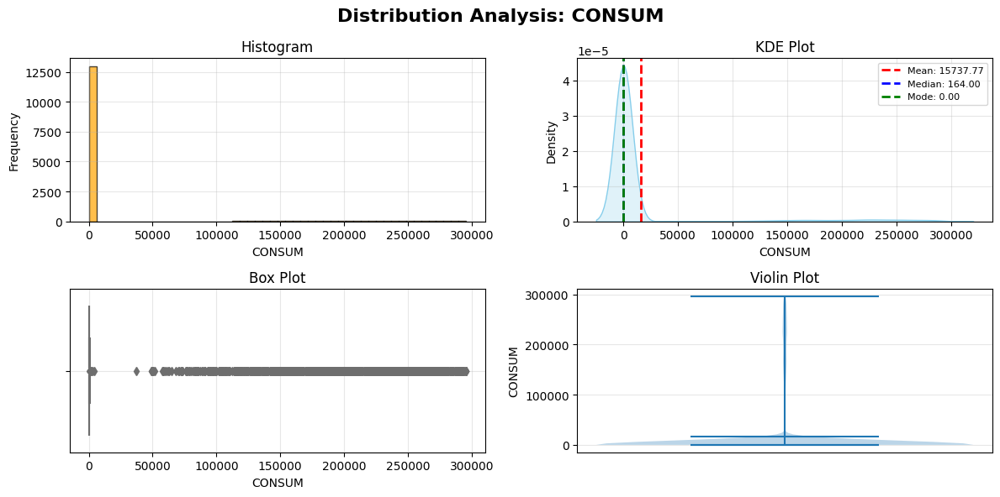



EXAMPLE 3: Correlation Analysis (on filtered data)


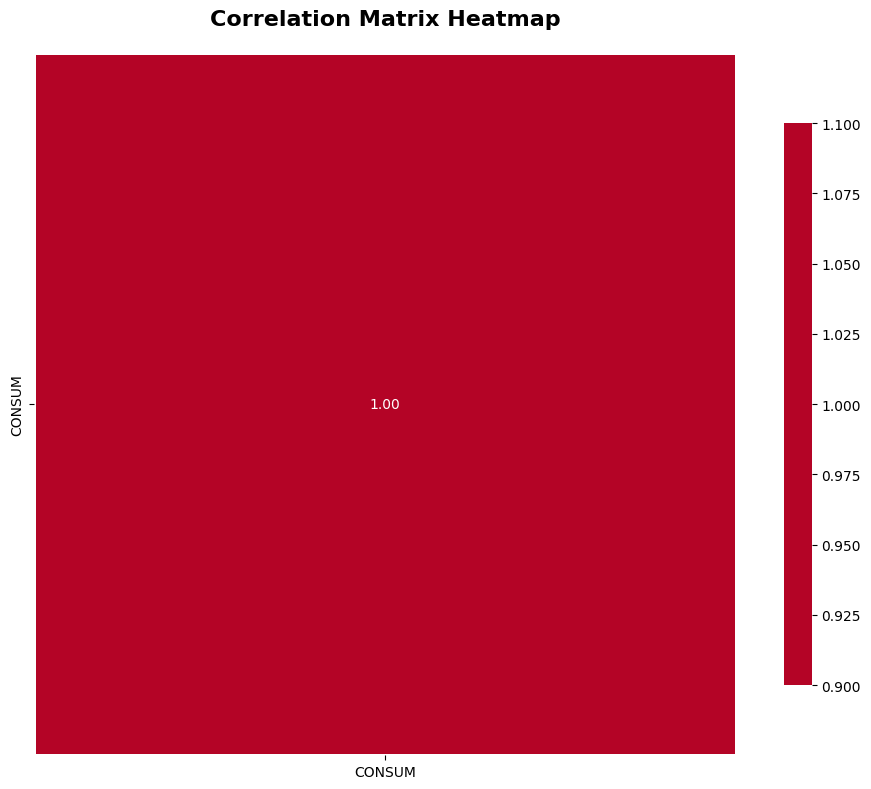


Strong Correlations (|r| > 0.5):


EXAMPLE 7: Using filter_dataframe directly
📊 Filtering data to 99th percentile...
✓ Filtered 73 rows (0.51%) as outliers
✓ Remaining data: 14,366 rows

Filtering results:
Original shape: (14439, 3)
Dropped columns: []
Filtered rows: 73
Final shape: (14366, 3)


In [18]:
tips = consum_dades

print("MODULAR EDA TOOLKIT - EXAMPLE USAGE\n")

# 1. Quick Summary with filtering
print("="*80)
print("EXAMPLE 1: Quick Summary with 95th Percentile Filtering")
print("="*80)
summary = quick_summary(tips, percentile=95, columns_to_drop=['size'])

# Get filtered dataframe for further analysis
df_filtered = summary['filtered_df']

# 2. Analyze individual numerical variables (using filtered data)
print("\n\n" + "="*80)
print("EXAMPLE 2: Analyzing 'CONSUM' distribution (on filtered data)")
print("="*80)
stats = analyze_numerical_distribution(df_filtered, 'CONSUM')

# 3. Correlation matrix
print("\n\n" + "="*80)
print("EXAMPLE 3: Correlation Analysis (on filtered data)")
print("="*80)
corr = plot_correlation_matrix(df_filtered)

## 4. Scatter relationships
#print("\n\n" + "="*80)
#print("EXAMPLE 4: Scatter Plot Analysis")
#print("="*80)
#plot_scatter_relationship(df_filtered, 'CONSUM')
#
## 5. Categorical analysis
#print("\n\n" + "="*80)
#print("EXAMPLE 5: Categorical Variable Analysis")
#print("="*80)
#cat_summary = analyze_categorical_variable(df_filtered)
#
## 6. Categorical vs Numerical
#print("\n\n" + "="*80)
#print("EXAMPLE 6: Categorical vs Numerical Analysis")
#print("="*80)
#group_stats = plot_categorical_vs_numerical(df_filtered, 'day', 'CONSUM')

# Example showing direct filter usage
print("\n\n" + "="*80)
print("EXAMPLE 7: Using filter_dataframe directly")
print("="*80)
df_custom, info = filter_dataframe(tips, percentile=99, columns_to_drop=[])
print(f"\nFiltering results:")
print(f"Original shape: {info['original_shape']}")
print(f"Dropped columns: {info['dropped_columns']}")
print(f"Filtered rows: {info['filtered_rows']}")
print(f"Final shape: {info['final_shape']}")

Running EDA on Tips Dataset...

EXAMPLE 1: Basic Analysis
COMPREHENSIVE EXPLORATORY DATA ANALYSIS

Dataset Shape: (244, 7)
Number of Rows: 244
Number of Columns: 7

Note: 'size' is numerical but has only 6 unique values. Consider treating as categorical.

DATA TYPES AND MISSING VALUES

Column Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 244 entries, 0 to 243
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   total_bill  244 non-null    float64 
 1   tip         244 non-null    float64 
 2   sex         244 non-null    category
 3   smoker      244 non-null    category
 4   day         244 non-null    category
 5   time        244 non-null    category
 6   size        244 non-null    int64   
dtypes: category(4), float64(2), int64(1)
memory usage: 7.4 KB
None


Missing Values Summary:
Empty DataFrame
Columns: [Column, Missing_Count, Missing_Percentage]
Index: []

NUMERICAL VARIABLES ANALYSIS

Numeric

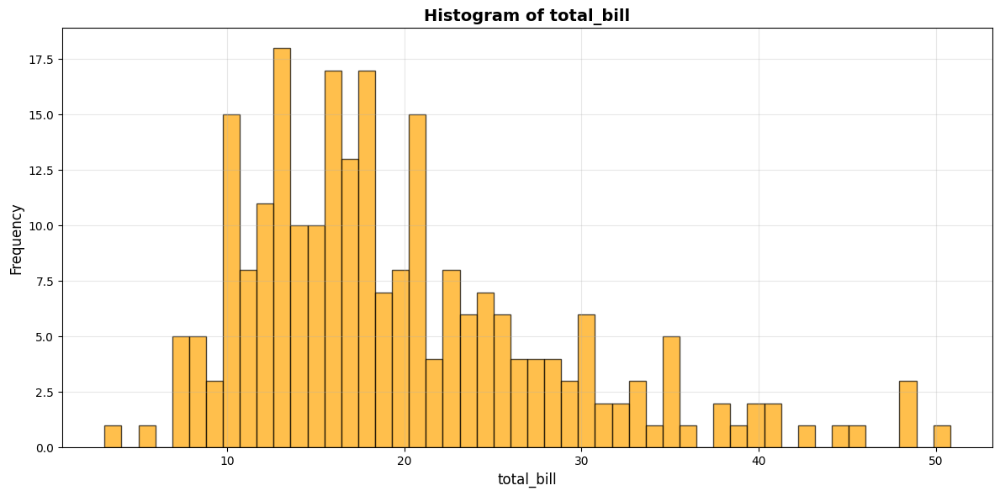

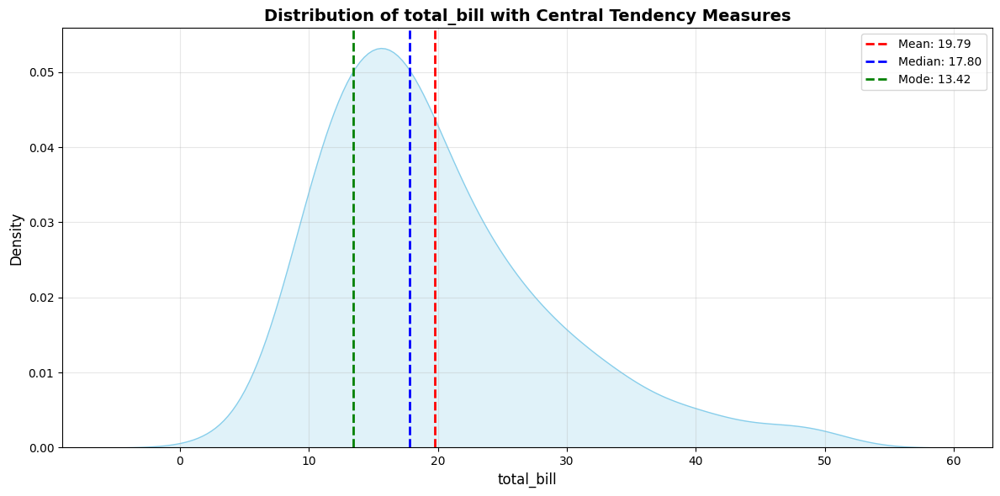

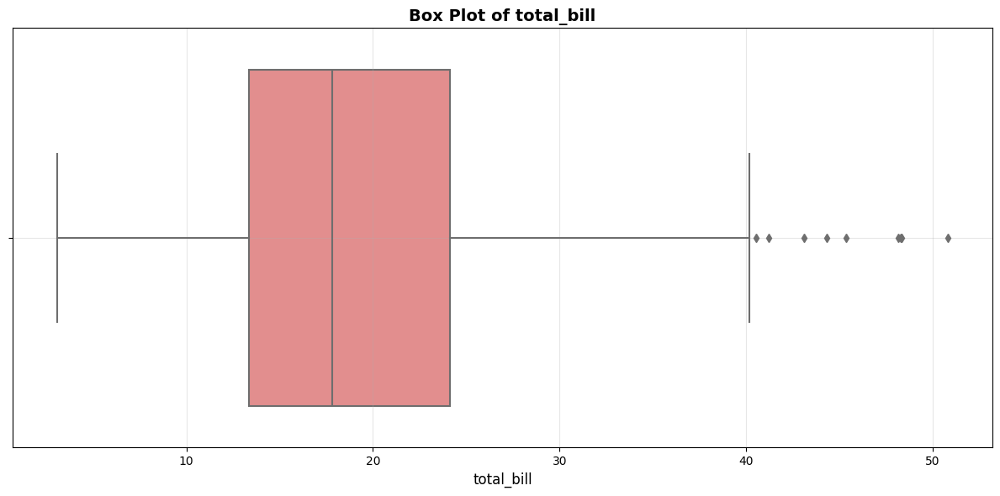

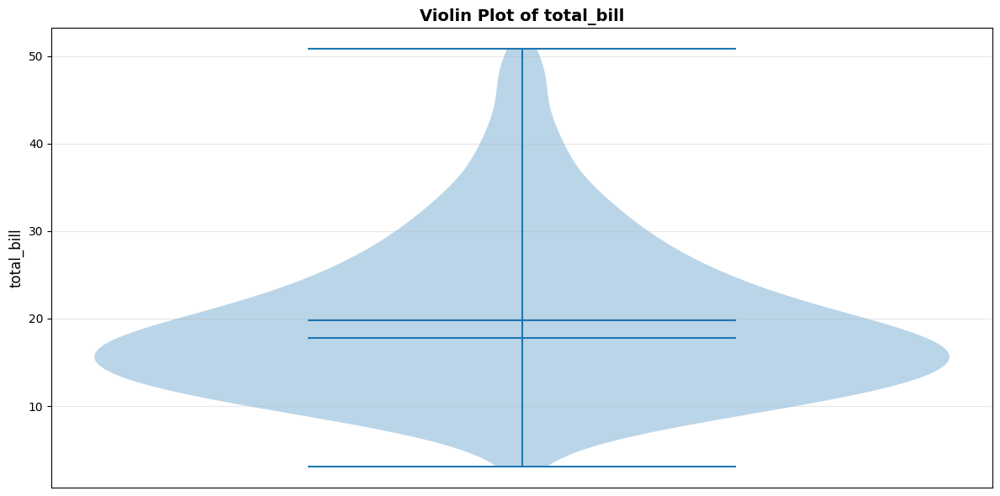


ANALYZING: tip
Mean: 2.998
Median: 2.900
Mode: 2.000
Std Dev: 1.384
Min: 1.000
Max: 10.000


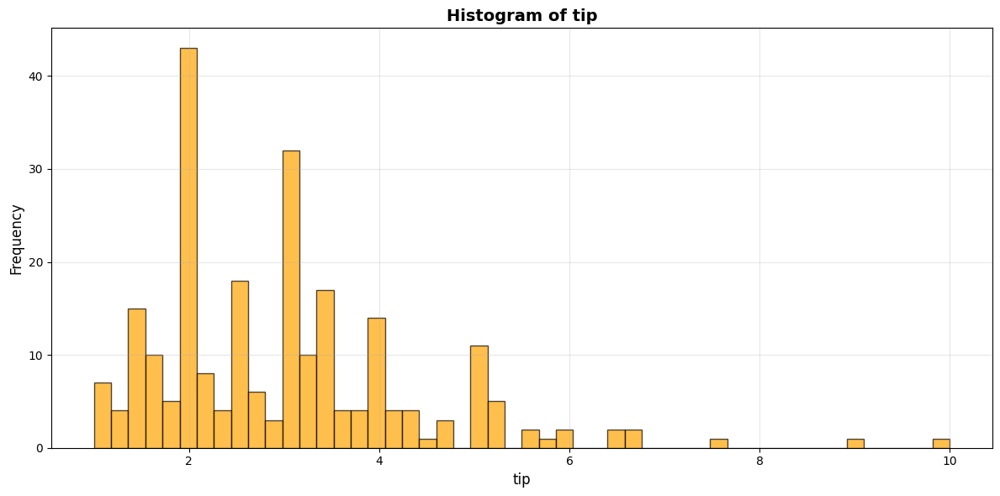

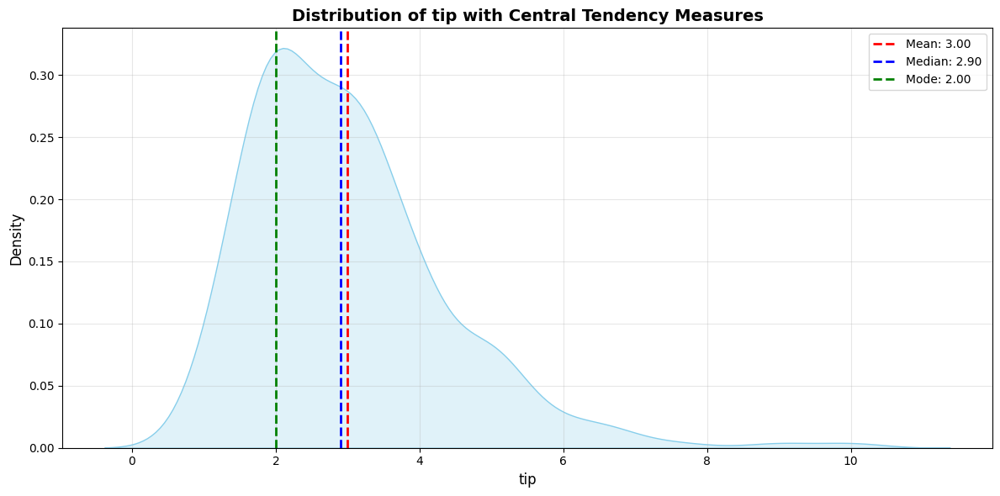

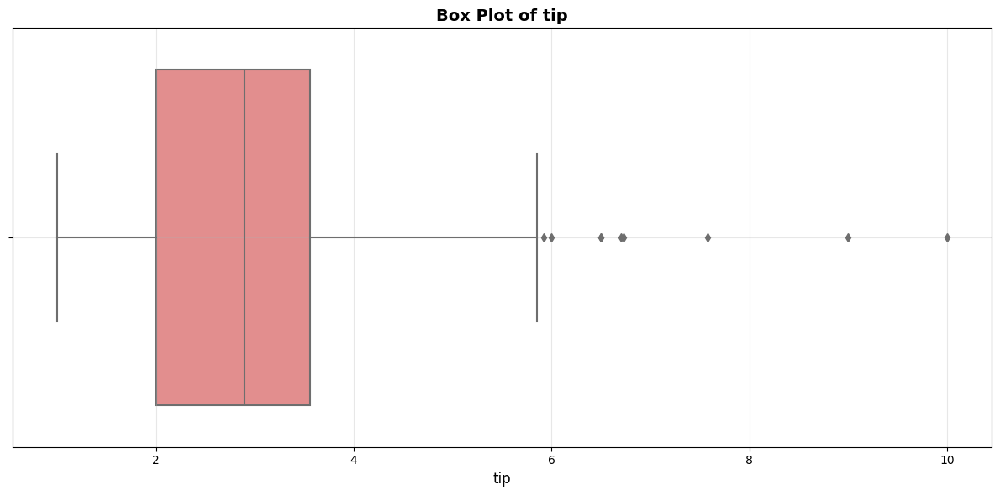

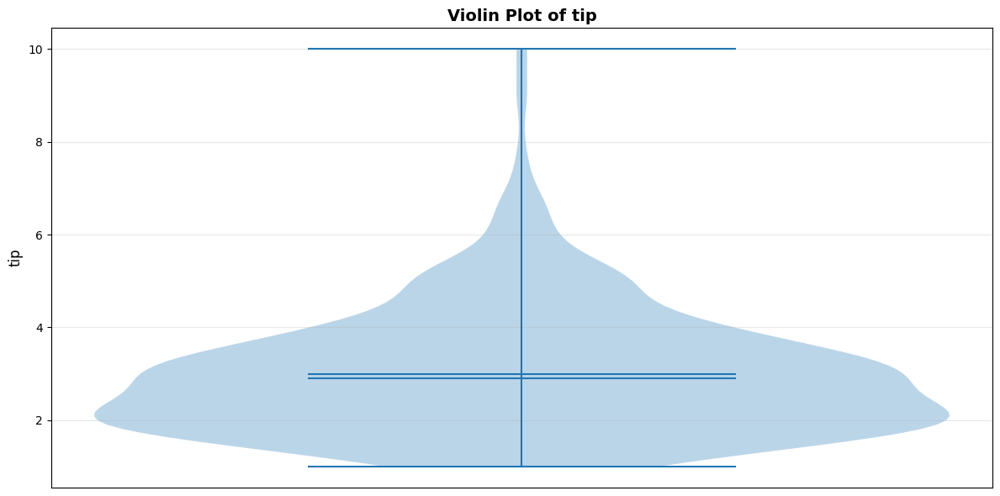


ANALYZING: size
Mean: 2.570
Median: 2.000
Mode: 2.000
Std Dev: 0.951
Min: 1.000
Max: 6.000


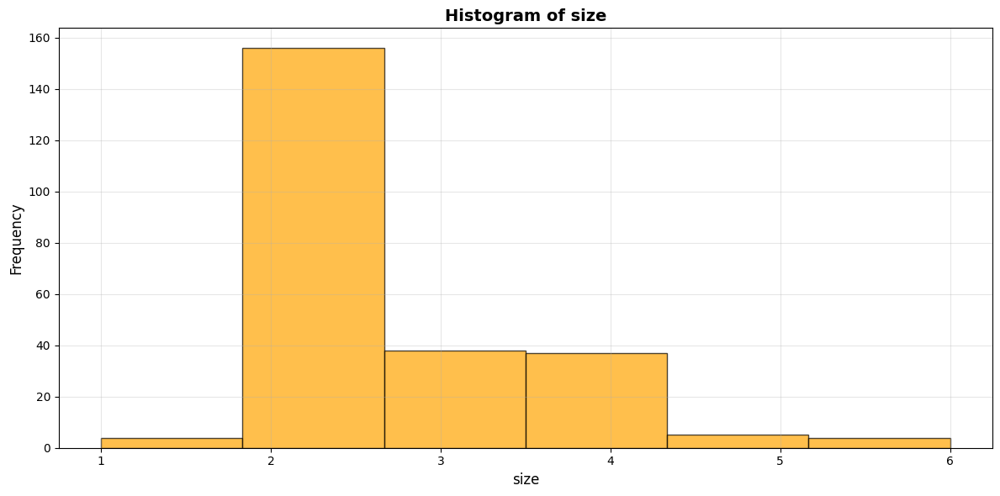

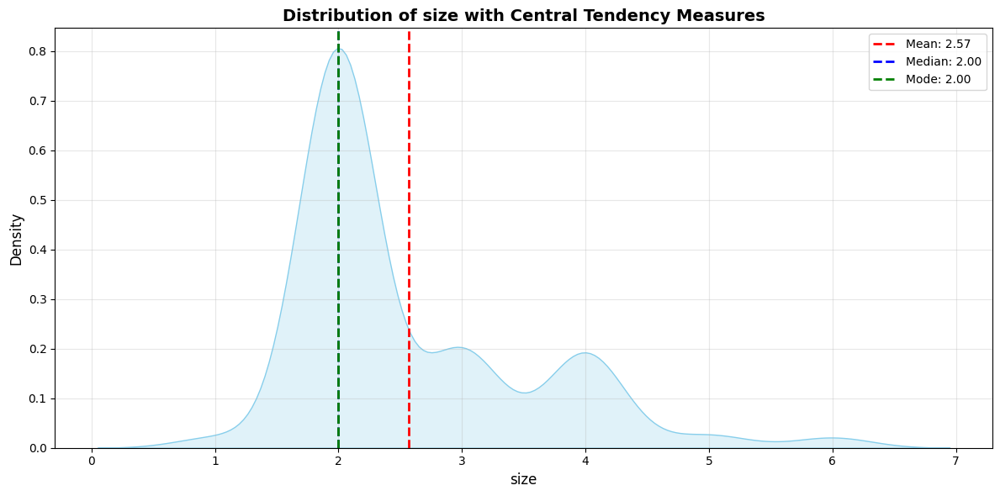

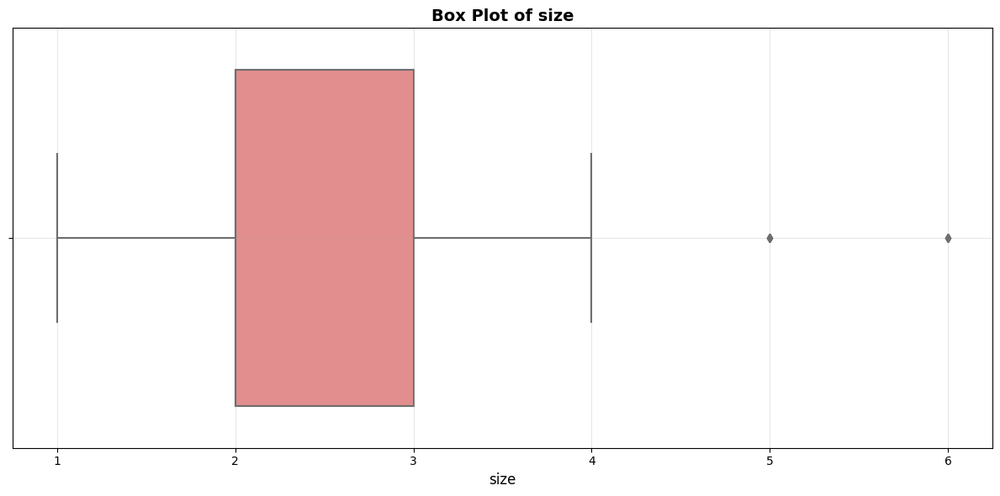

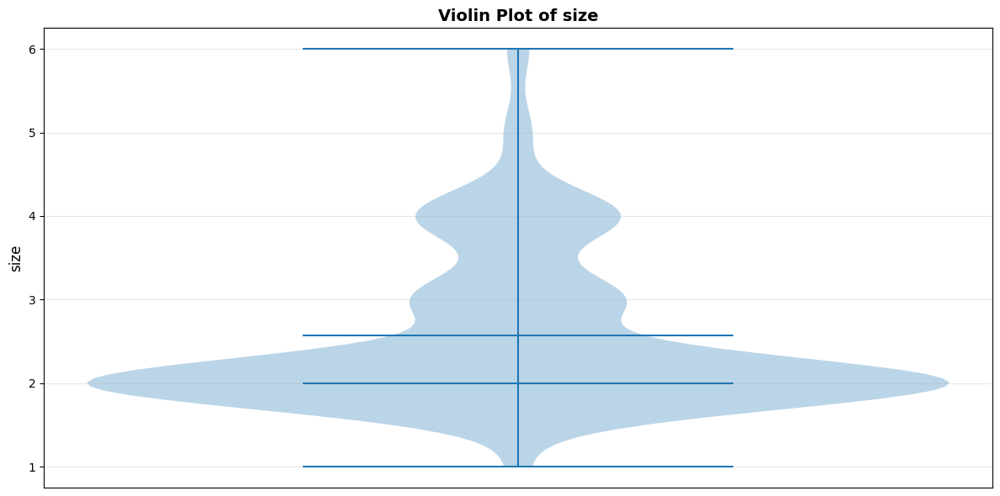


CORRELATION ANALYSIS

Correlation Matrix:
            total_bill    tip   size
total_bill       1.000  0.676  0.598
tip              0.676  1.000  0.489
size             0.598  0.489  1.000


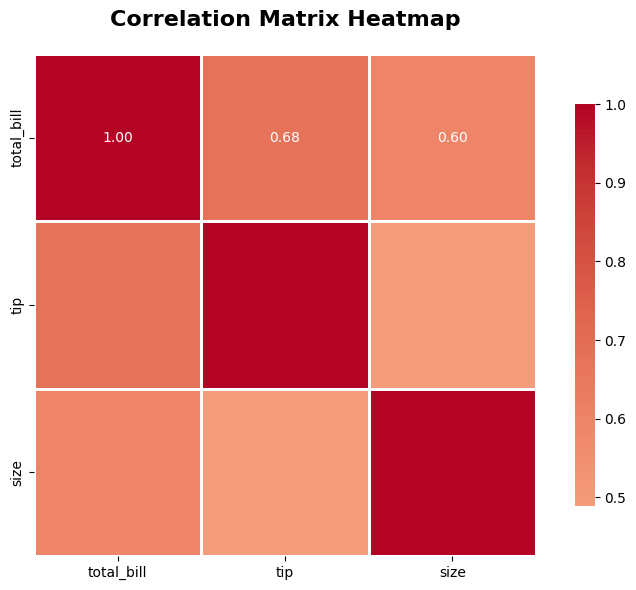


Strong Correlations (|r| > 0.5):
total_bill <-> tip: 0.676
total_bill <-> size: 0.598

PAIRWISE RELATIONSHIPS


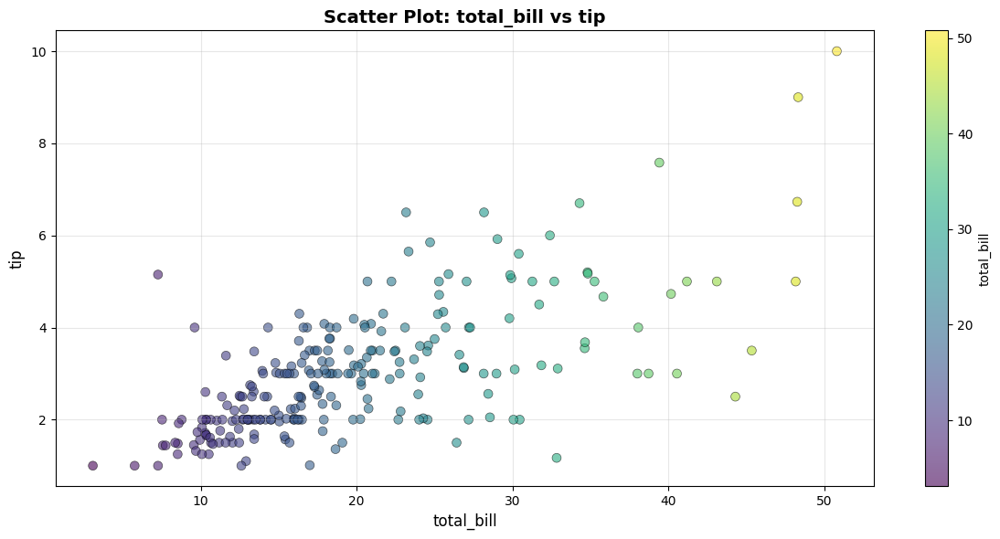

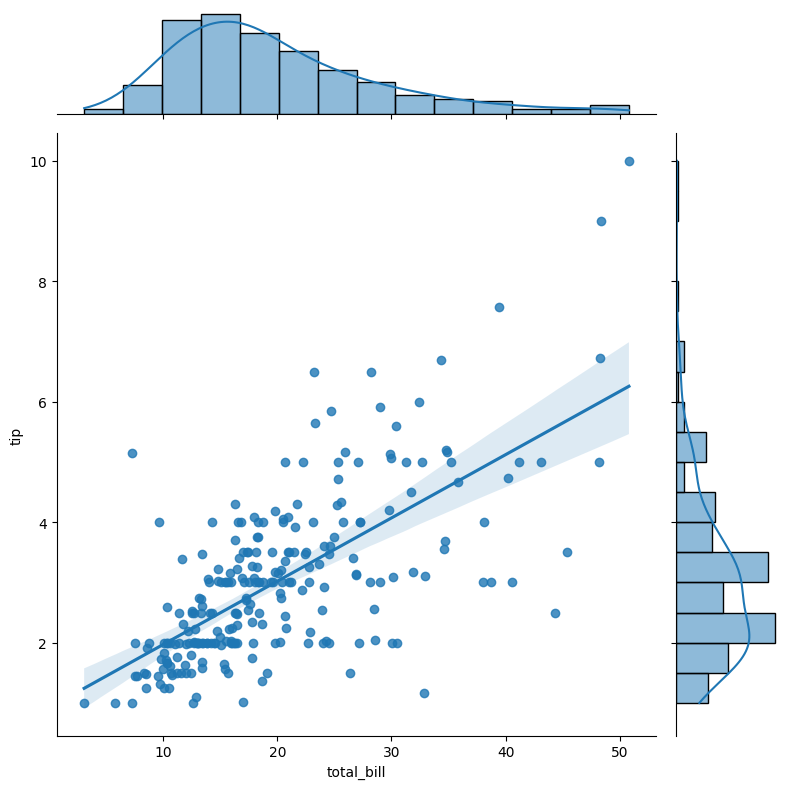

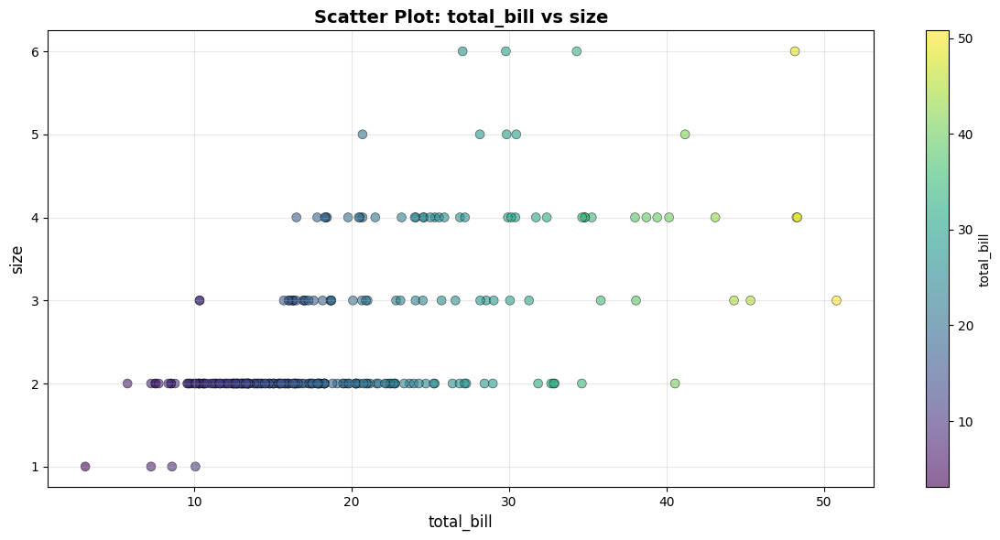

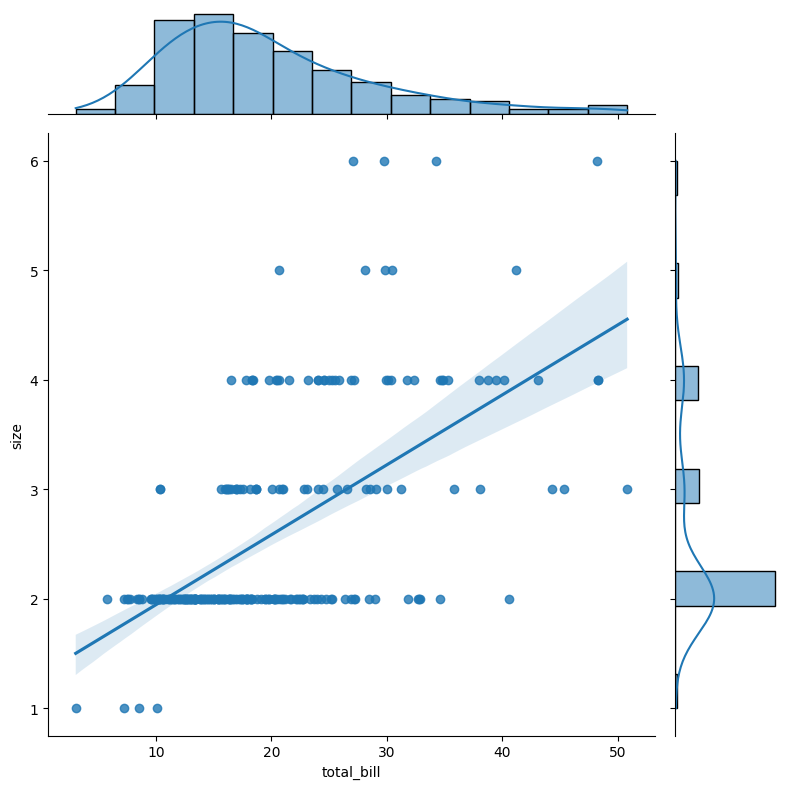

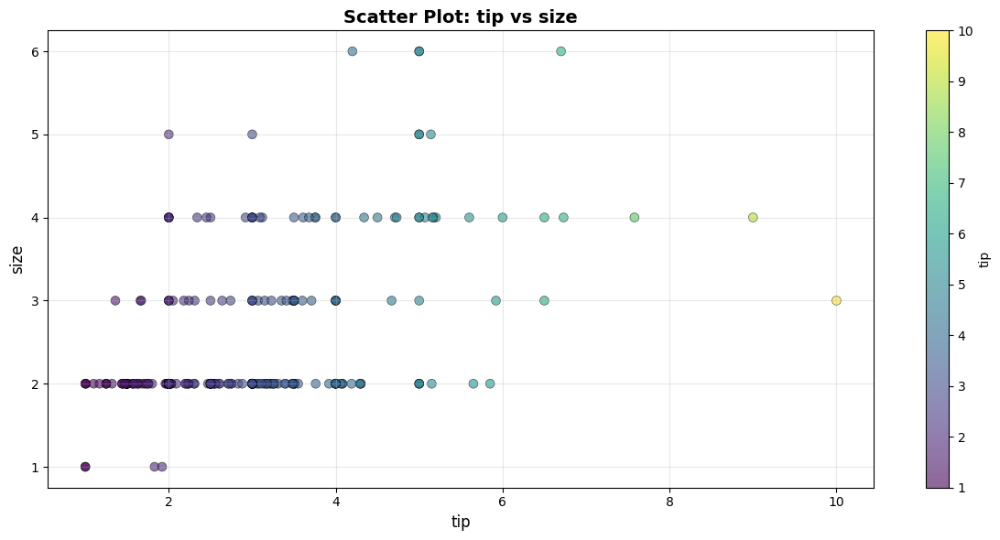

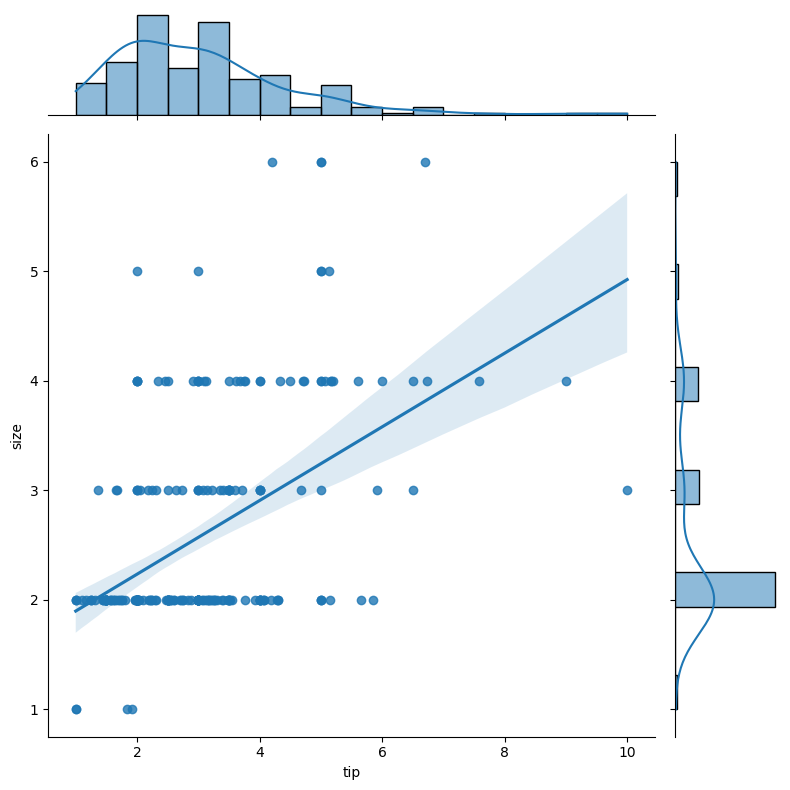


Generating Pair Plot...


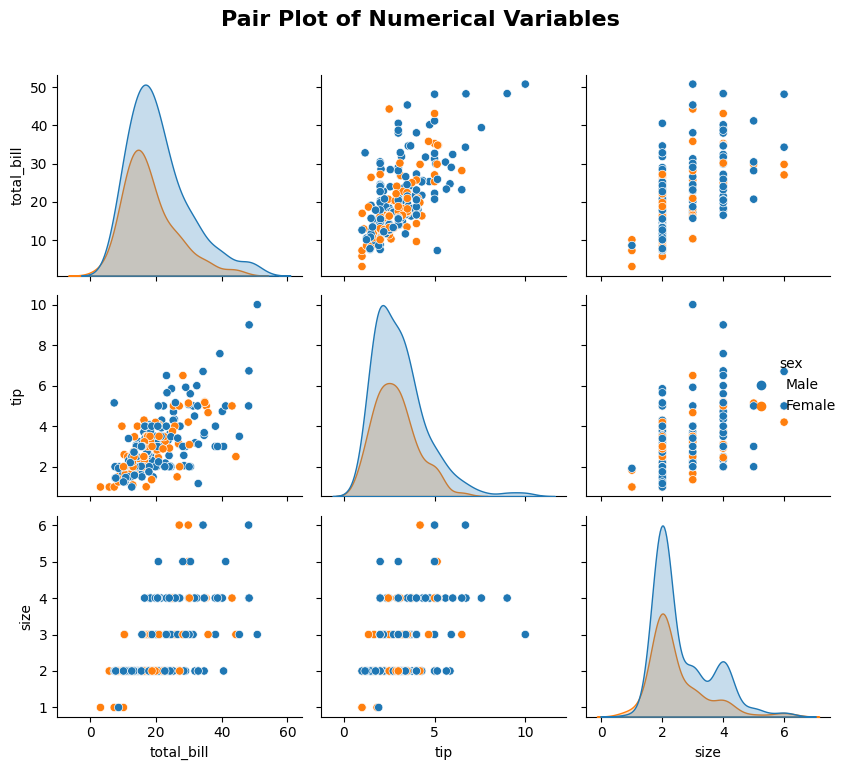


CATEGORICAL VARIABLES ANALYSIS

Categorical Columns: ['sex', 'smoker', 'day', 'time']

ANALYZING: sex

Unique Values: 2

Value Counts:
Category  Count  Percentage
    Male    157       64.34
  Female     87       35.66


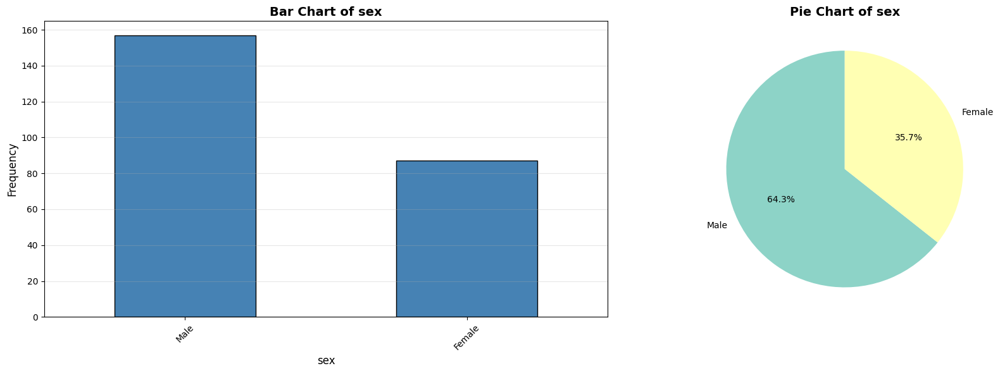


ANALYZING: smoker

Unique Values: 2

Value Counts:
Category  Count  Percentage
      No    151       61.89
     Yes     93       38.11


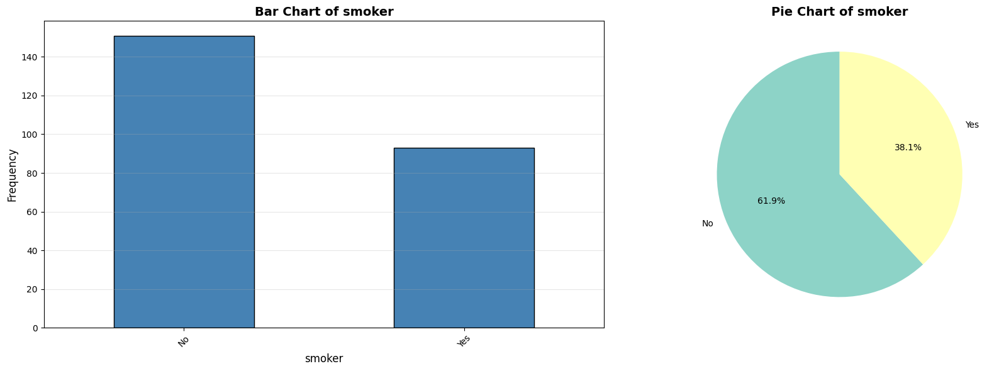


ANALYZING: day

Unique Values: 4

Value Counts:
Category  Count  Percentage
     Sat     87       35.66
     Sun     76       31.15
    Thur     62       25.41
     Fri     19        7.79


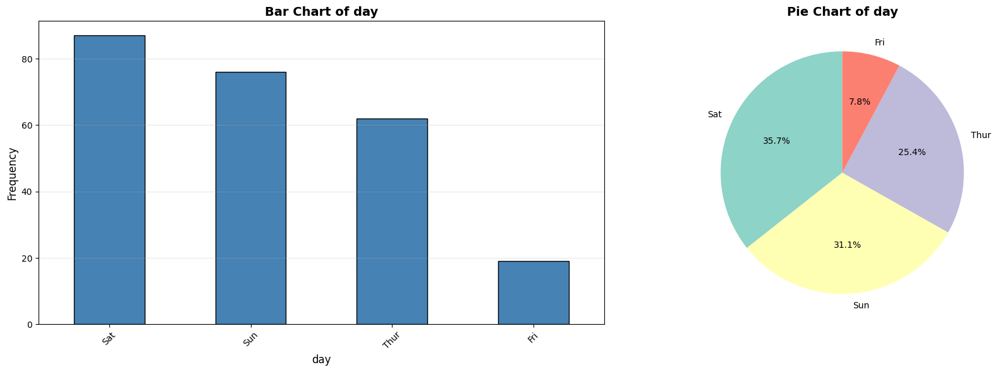


ANALYZING: time

Unique Values: 2

Value Counts:
Category  Count  Percentage
  Dinner    176       72.13
   Lunch     68       27.87


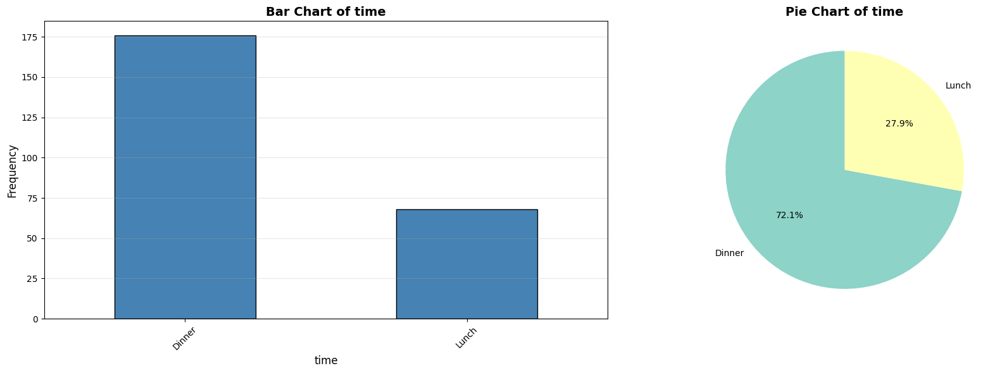


CATEGORICAL vs NUMERICAL ANALYSIS

sex vs total_bill


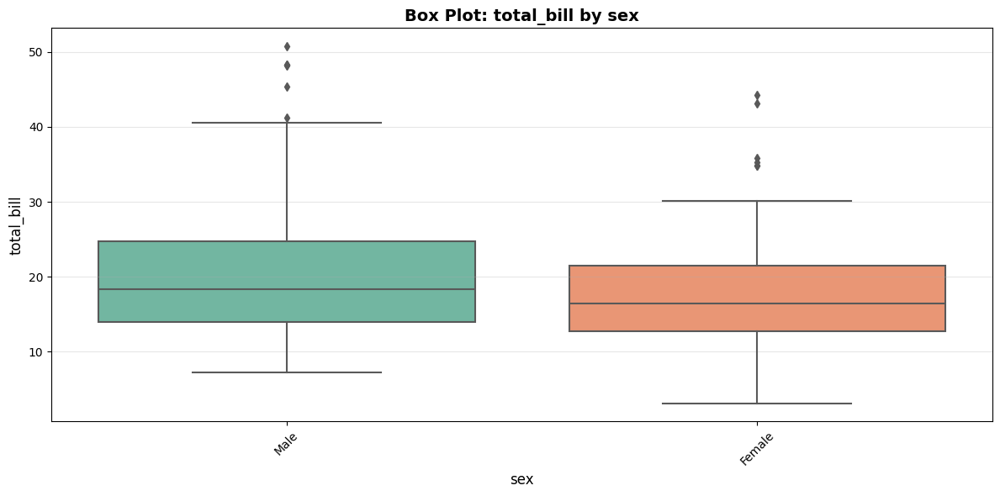

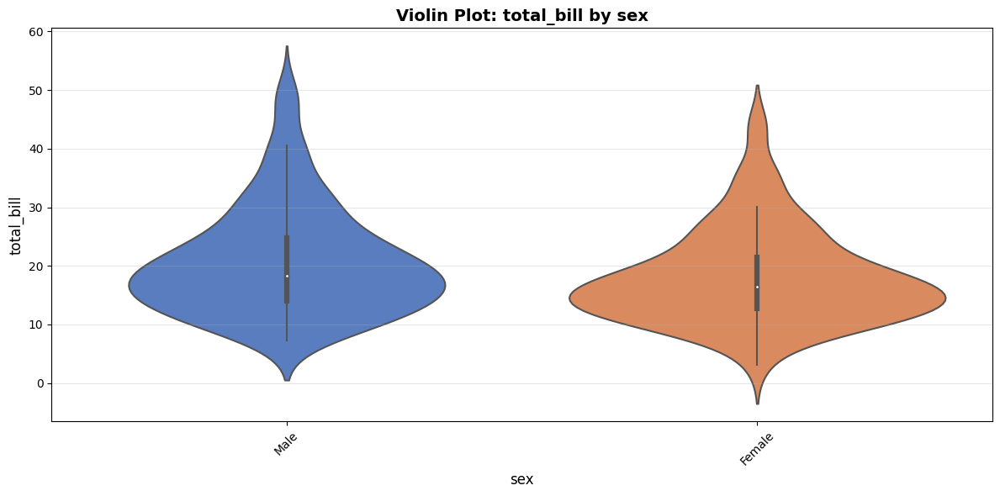


Group Statistics:
        count    mean  median    std   min    max
sex                                              
Male      157  20.744   18.35  9.246  7.25  50.81
Female     87  18.057   16.40  8.009  3.07  44.30

sex vs tip


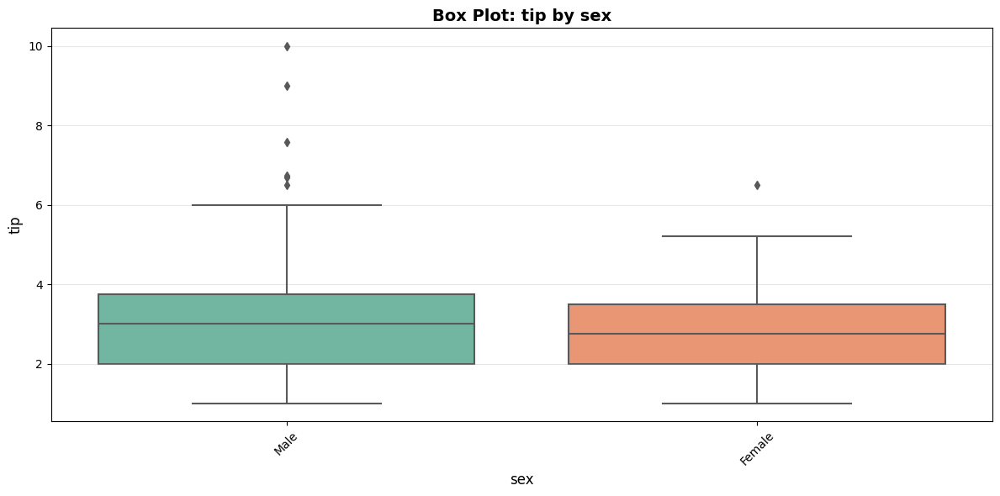

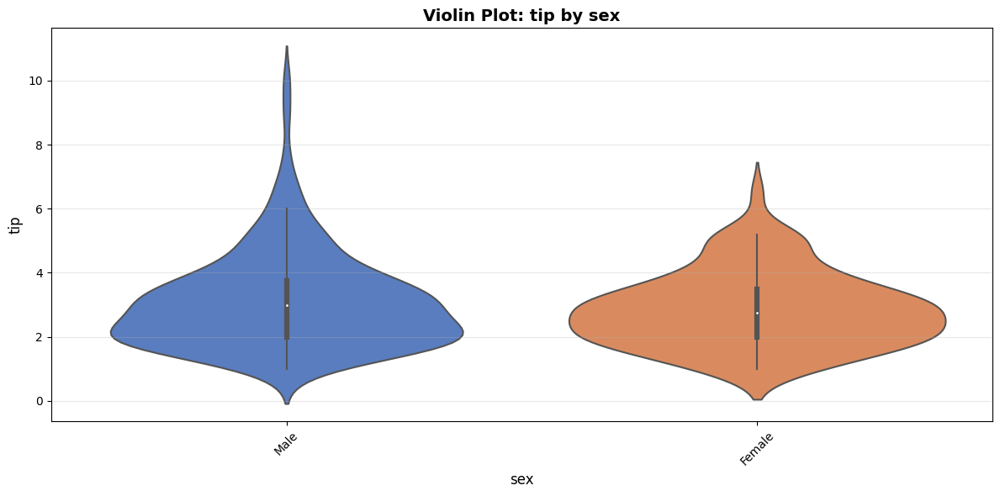


Group Statistics:
        count   mean  median    std  min   max
sex                                           
Male      157  3.090    3.00  1.489  1.0  10.0
Female     87  2.833    2.75  1.159  1.0   6.5

smoker vs total_bill


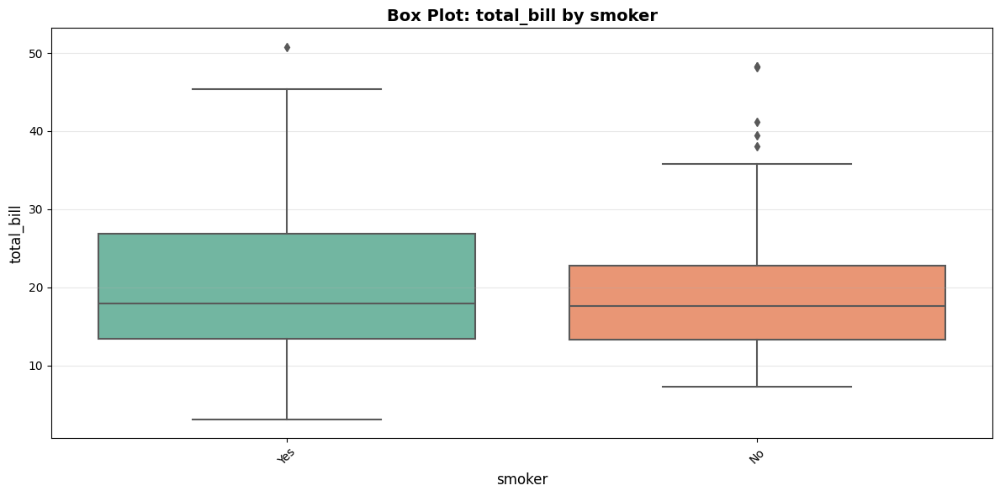

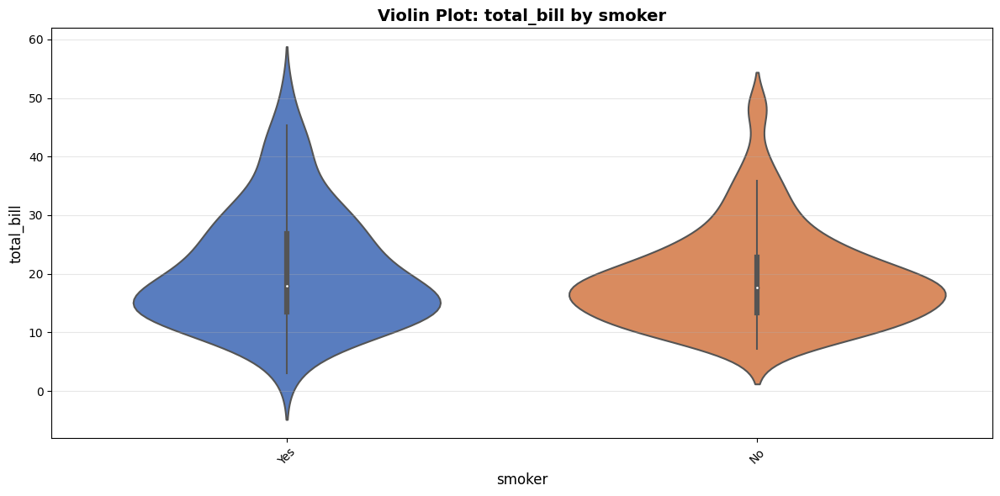


Group Statistics:
        count    mean  median    std   min    max
smoker                                           
Yes        93  20.756   17.92  9.832  3.07  50.81
No        151  19.188   17.59  8.256  7.25  48.33

smoker vs tip


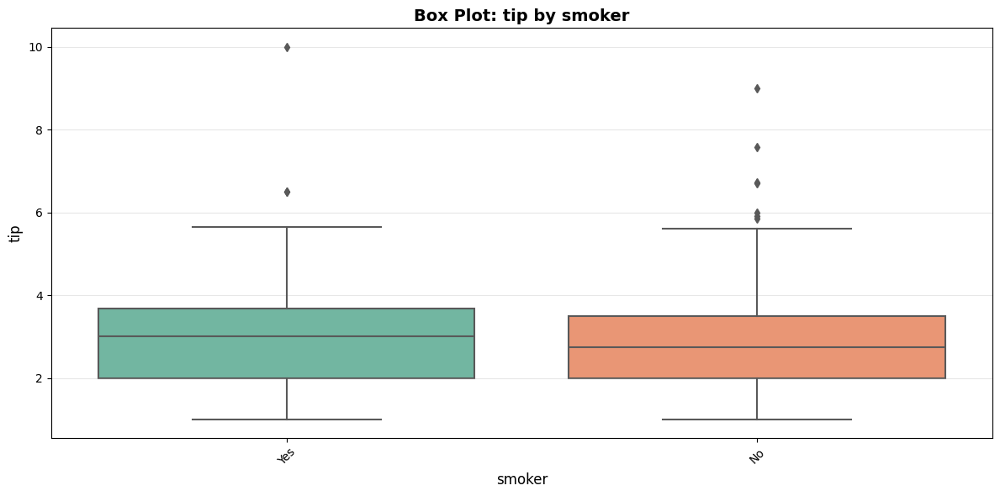

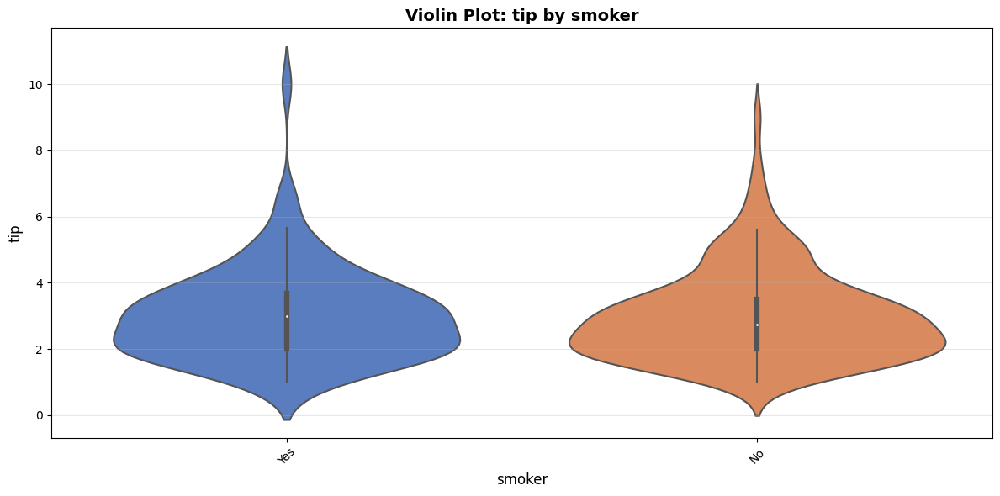


Group Statistics:
        count   mean  median    std  min   max
smoker                                        
Yes        93  3.009    3.00  1.401  1.0  10.0
No        151  2.992    2.74  1.377  1.0   9.0

ANALYSIS COMPLETE


EXAMPLE 2: Analysis with 95th Percentile Filtering
COMPREHENSIVE EXPLORATORY DATA ANALYSIS

📊 Filtering data to 95th percentile...
✓ Filtered 28 rows (11.48%) as outliers
✓ Remaining data: 216 rows

Dataset Shape: (216, 7)
Number of Rows: 216
Number of Columns: 7

Note: 'size' is numerical but has only 4 unique values. Consider treating as categorical.

DATA TYPES AND MISSING VALUES

Column Information:
<class 'pandas.core.frame.DataFrame'>
Index: 216 entries, 1 to 243
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   total_bill  216 non-null    float64 
 1   tip         216 non-null    float64 
 2   sex         216 non-null    category
 3   smoker      216 non-null    category
 4   day      

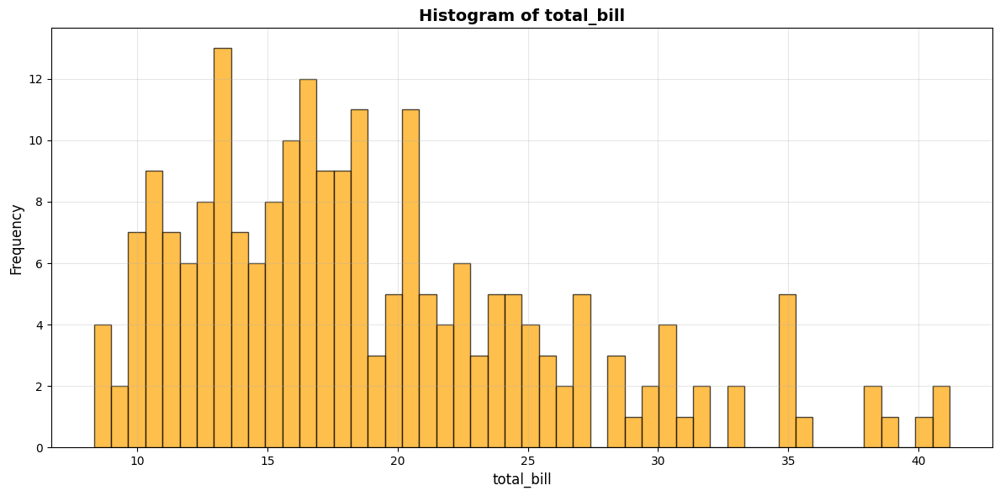

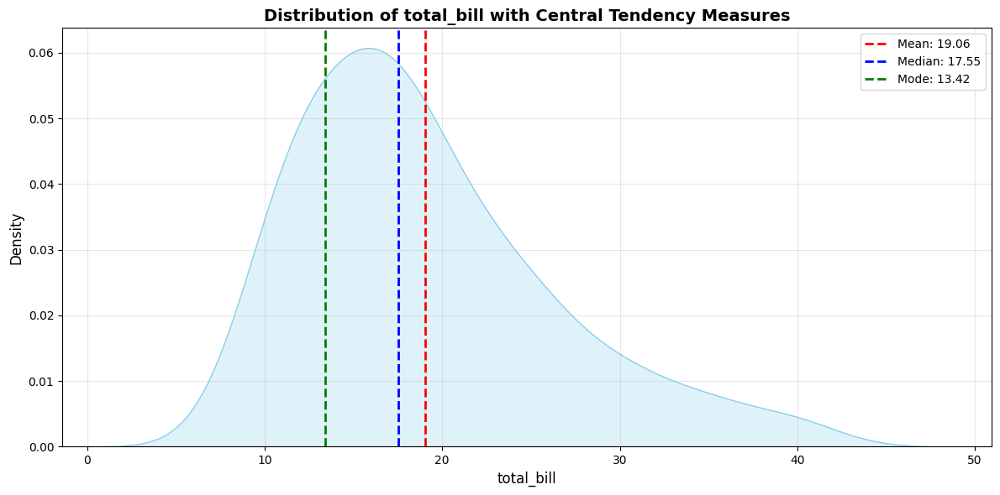

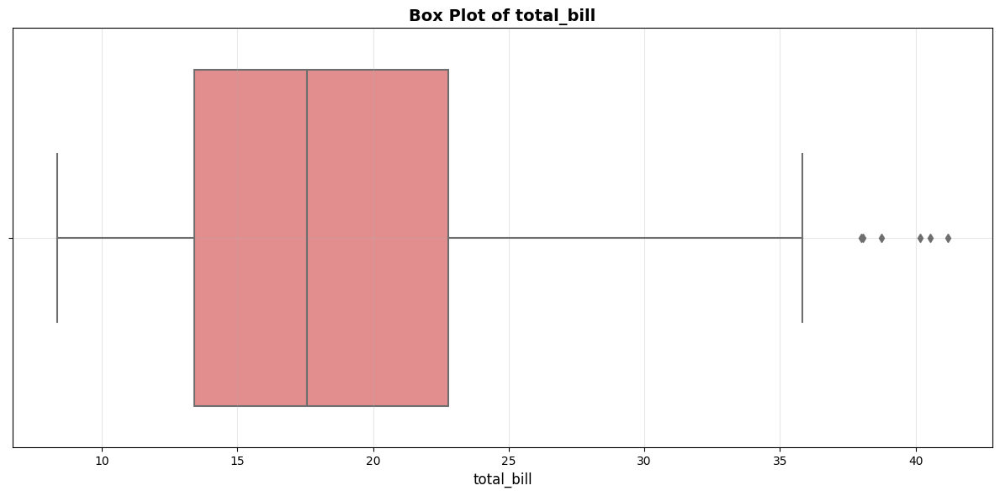

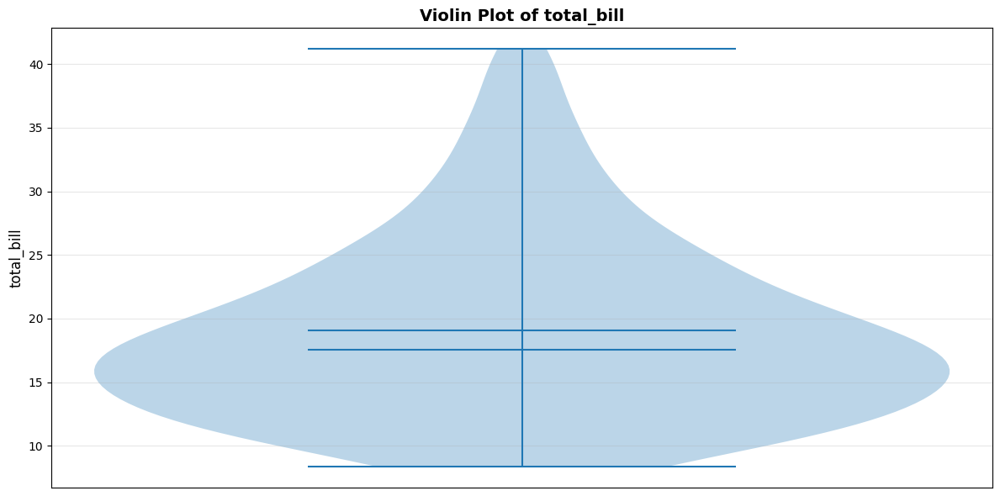


ANALYZING: tip
Mean: 2.872
Median: 2.855
Mode: 2.000
Std Dev: 1.039
Min: 1.250
Max: 5.850


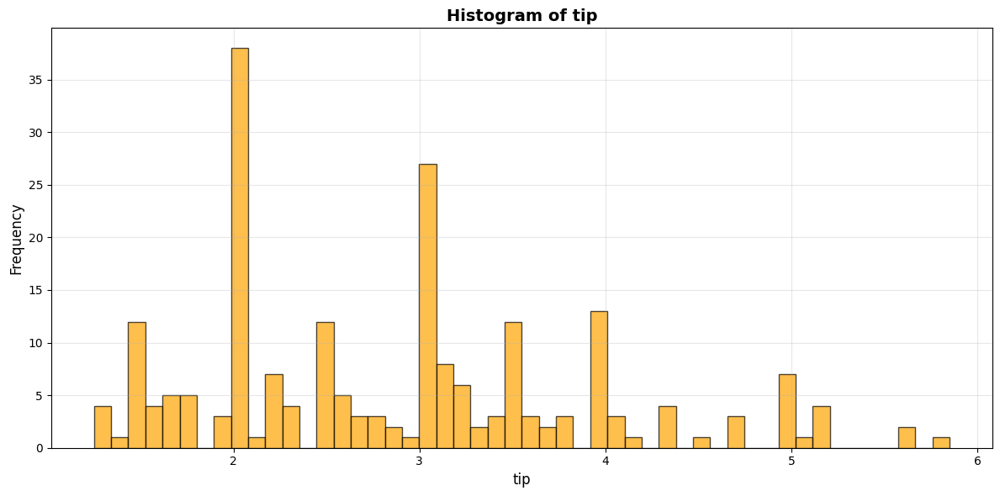

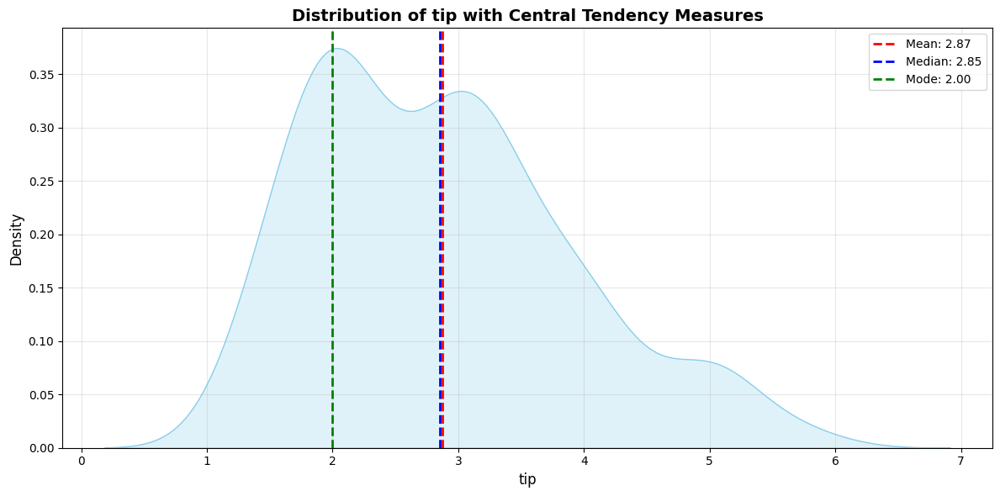

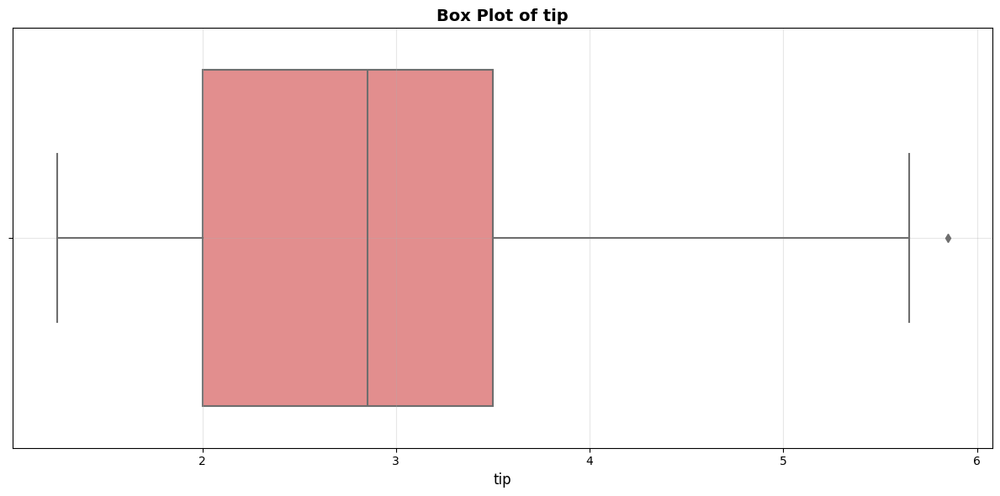

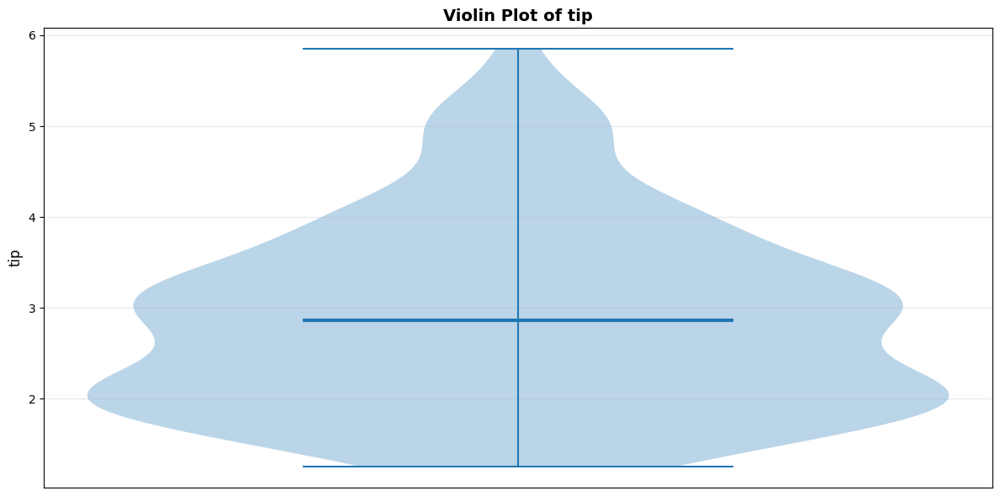


ANALYZING: size
Mean: 2.509
Median: 2.000
Mode: 2.000
Std Dev: 0.824
Min: 2.000
Max: 5.000


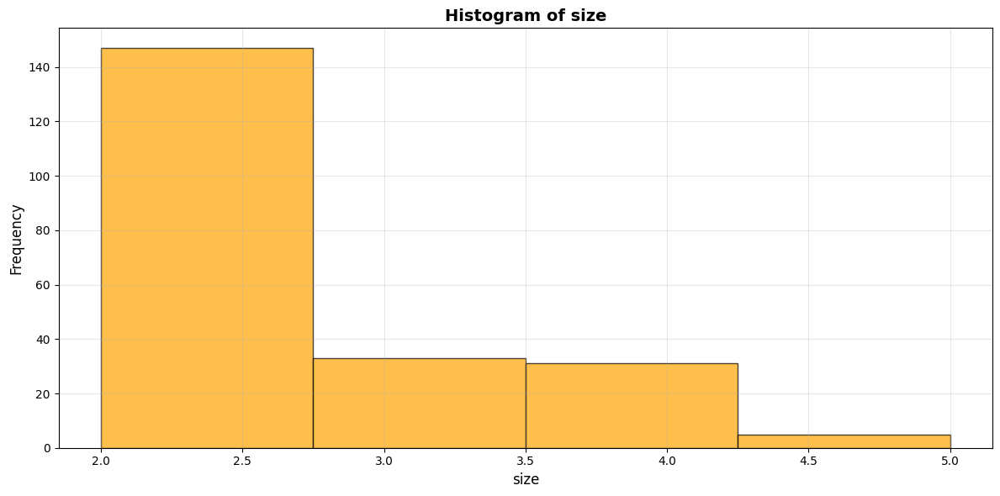

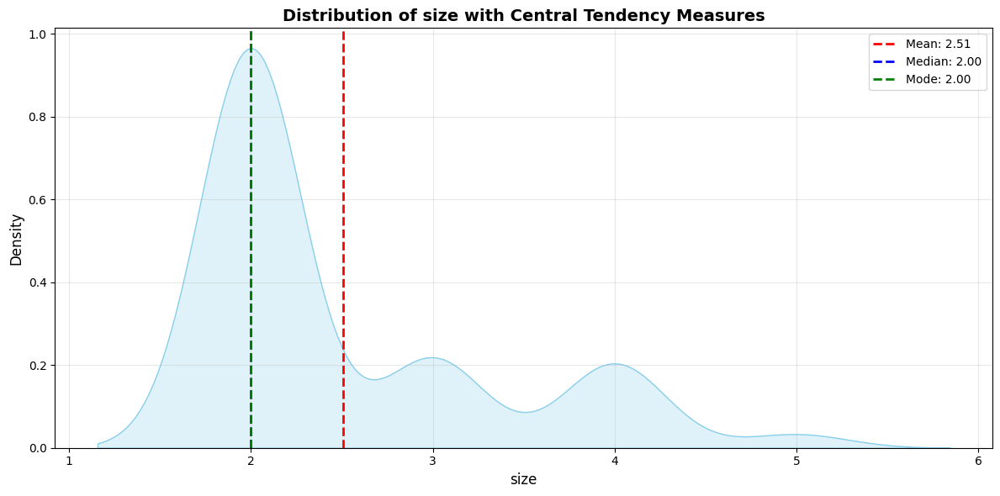

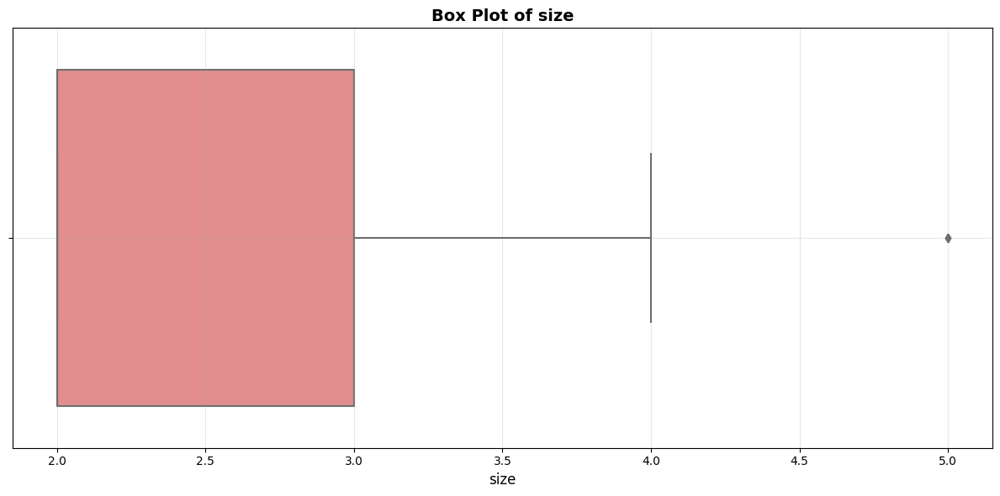

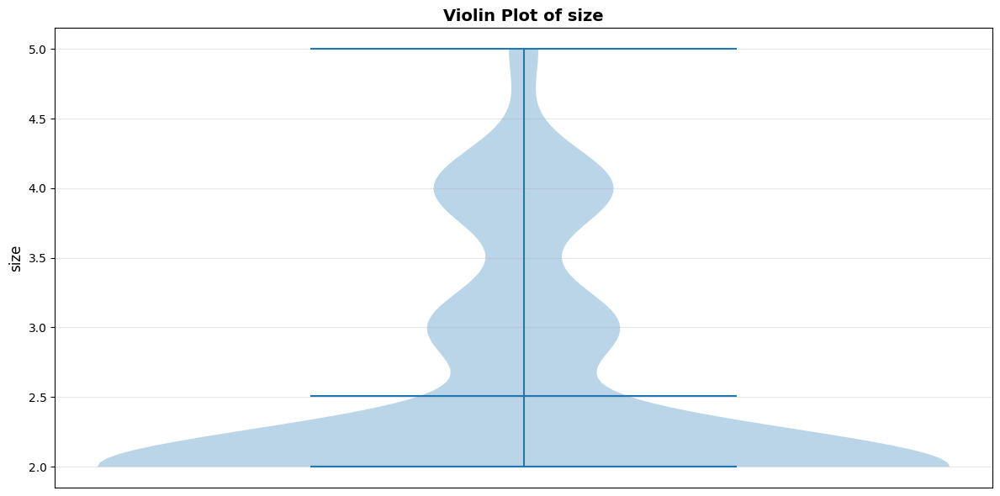


CORRELATION ANALYSIS

Correlation Matrix:
            total_bill    tip   size
total_bill       1.000  0.613  0.541
tip              0.613  1.000  0.377
size             0.541  0.377  1.000


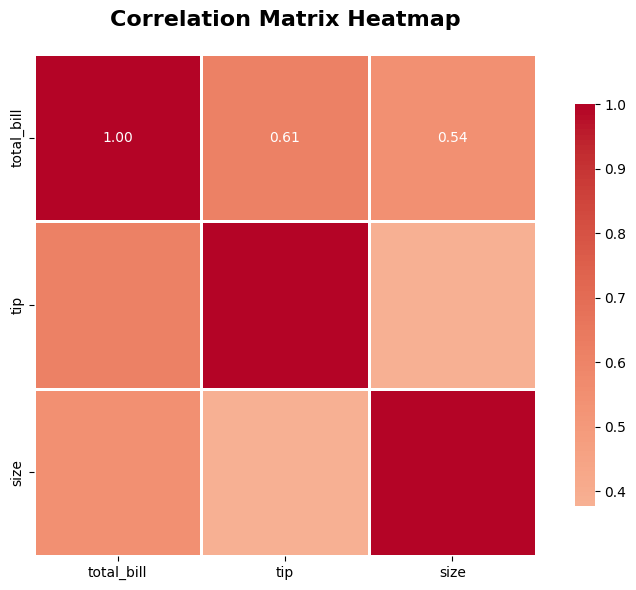


Strong Correlations (|r| > 0.5):
total_bill <-> tip: 0.613
total_bill <-> size: 0.541

PAIRWISE RELATIONSHIPS


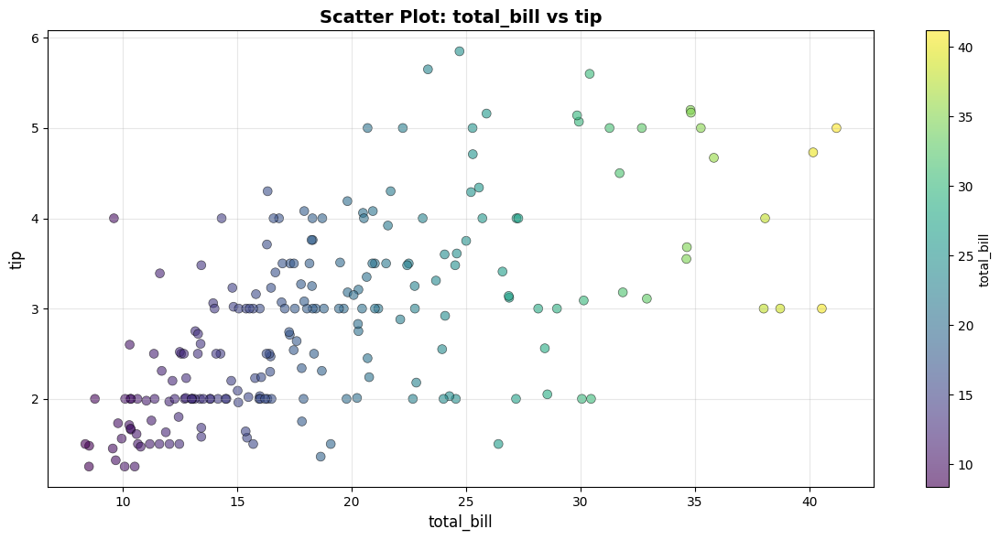

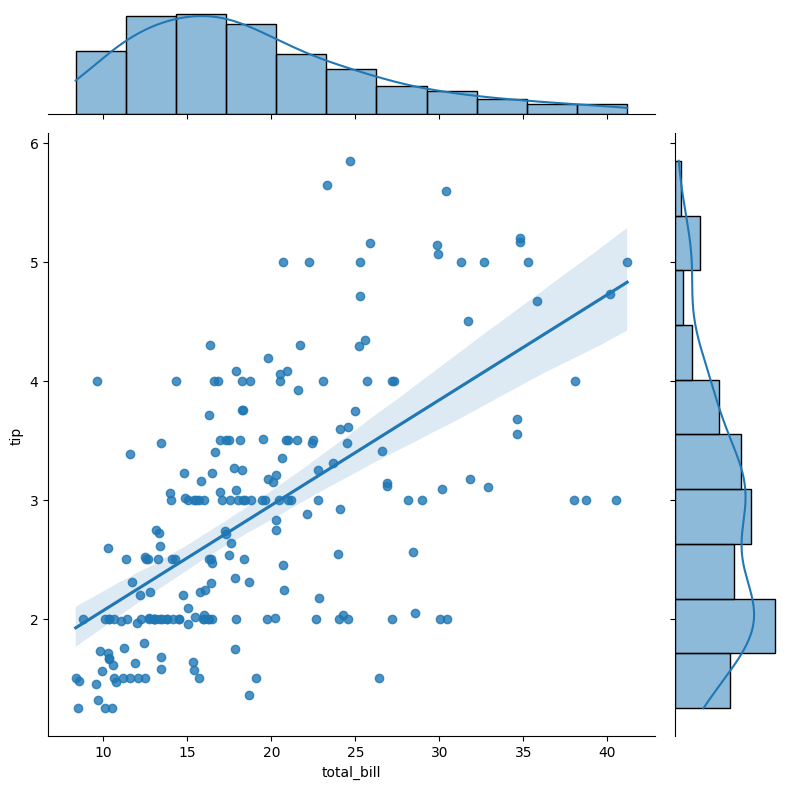

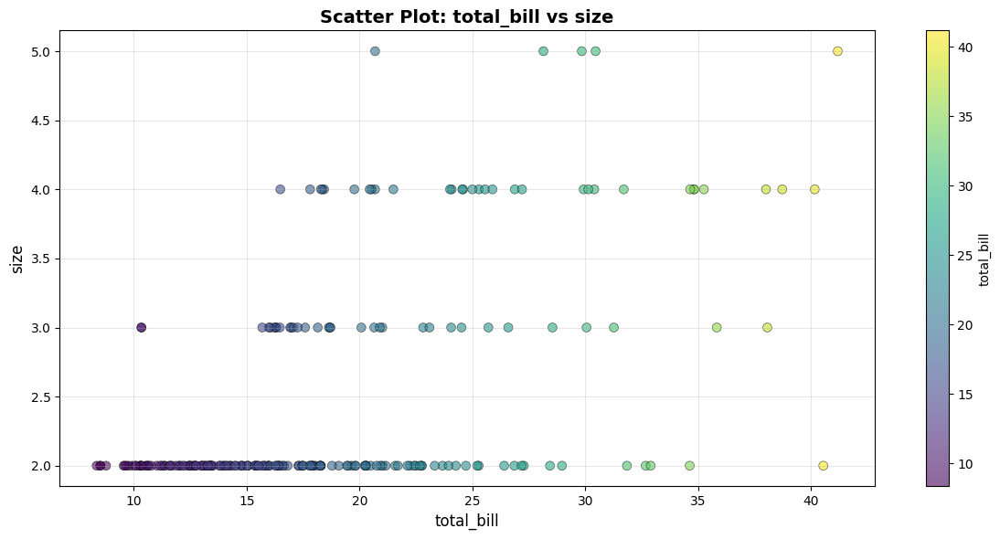

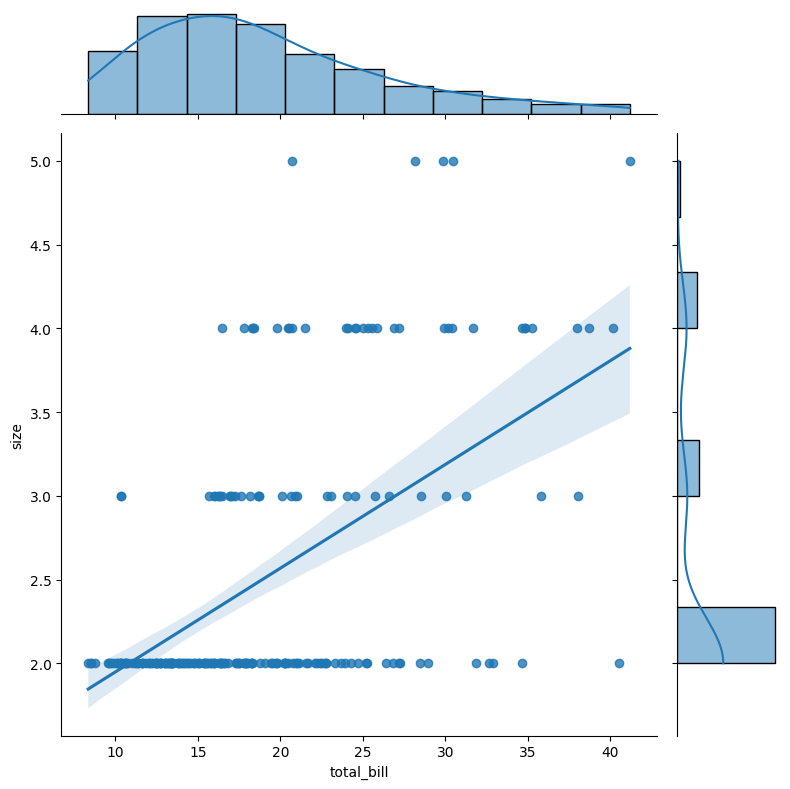

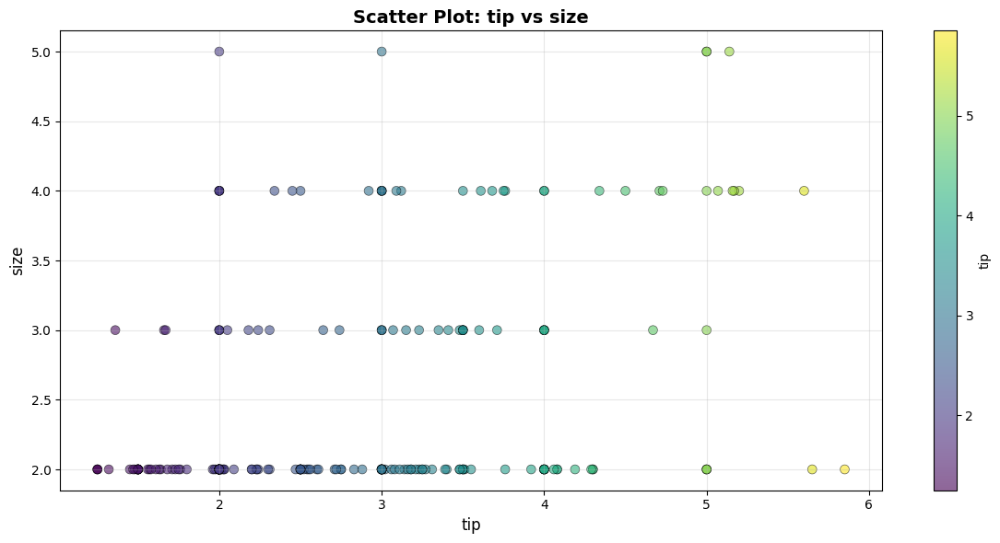

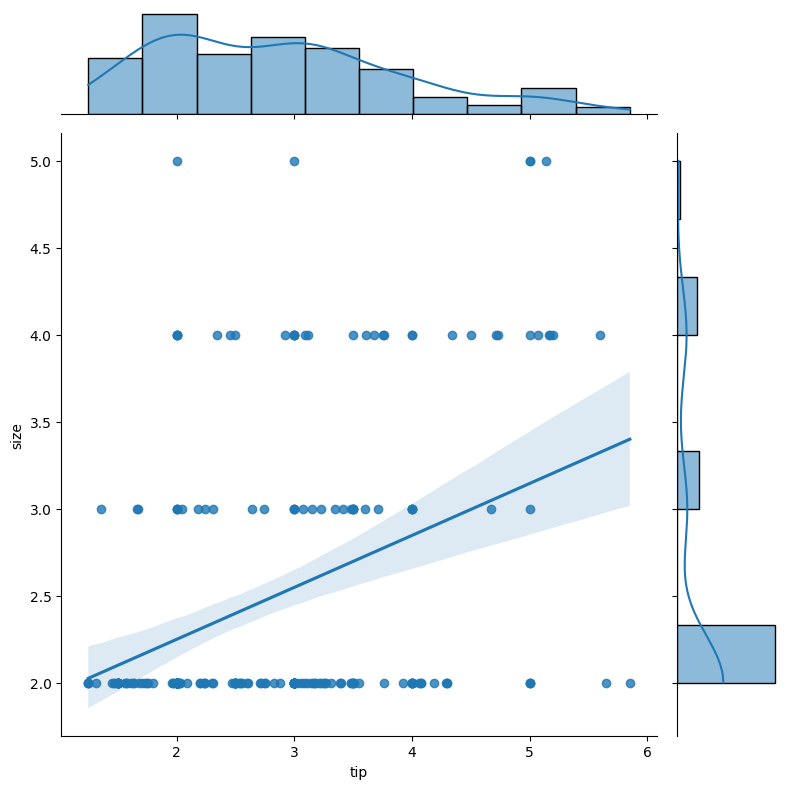


Generating Pair Plot...


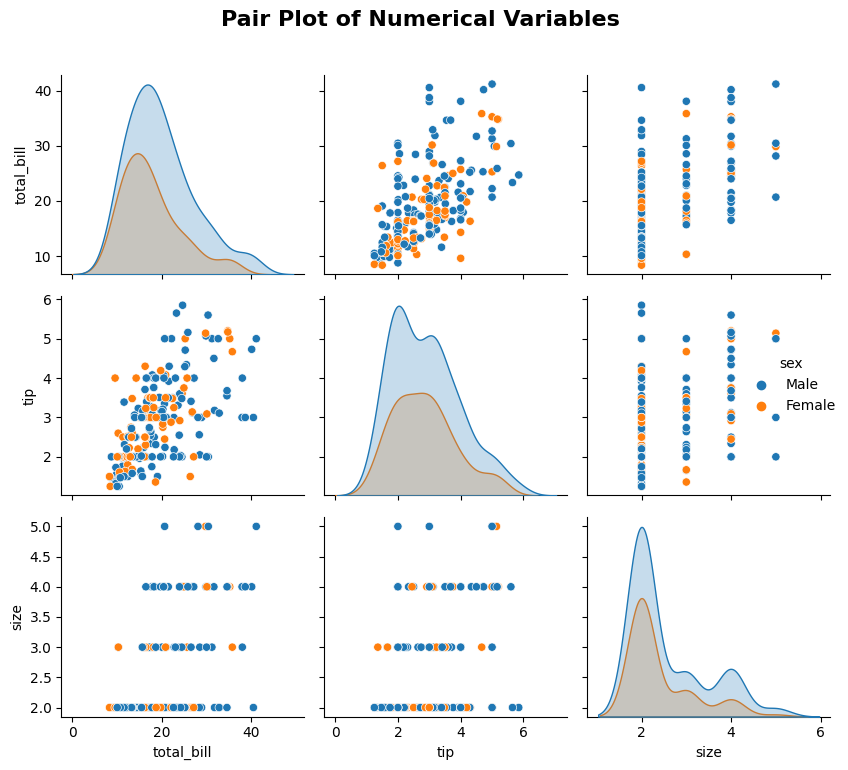


CATEGORICAL VARIABLES ANALYSIS

Categorical Columns: ['sex', 'smoker', 'day', 'time']

ANALYZING: sex

Unique Values: 2

Value Counts:
Category  Count  Percentage
    Male    140       64.81
  Female     76       35.19


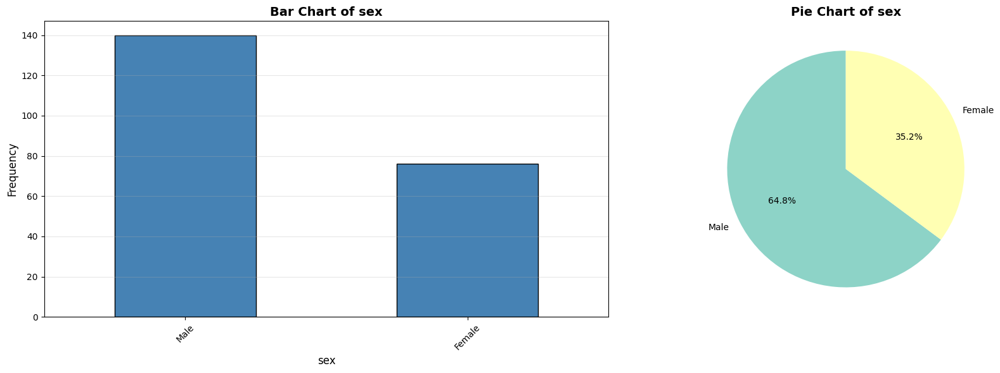


ANALYZING: smoker

Unique Values: 2

Value Counts:
Category  Count  Percentage
      No    137       63.43
     Yes     79       36.57


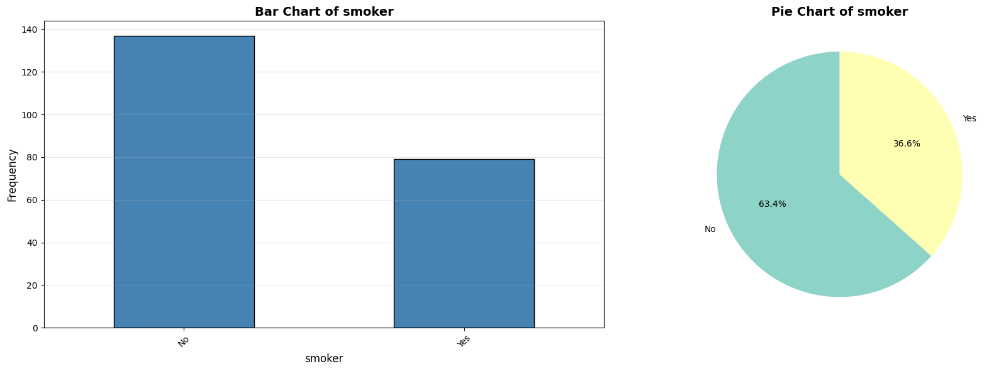


ANALYZING: day

Unique Values: 4

Value Counts:
Category  Count  Percentage
     Sat     74       34.26
     Sun     70       32.41
    Thur     55       25.46
     Fri     17        7.87


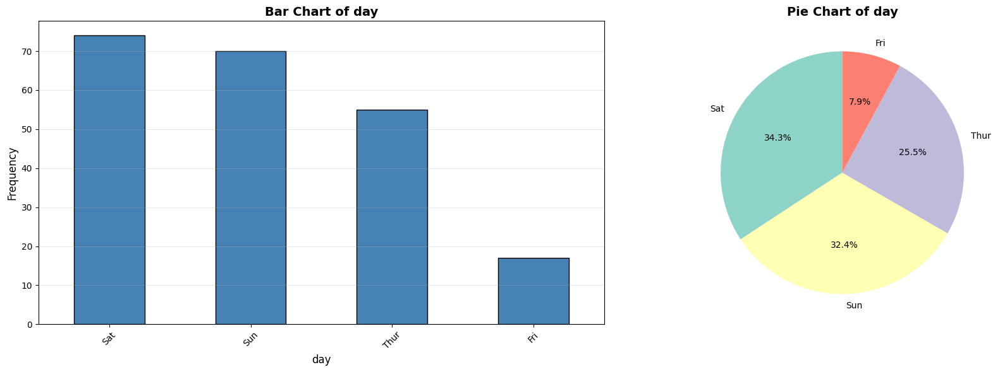


ANALYZING: time

Unique Values: 2

Value Counts:
Category  Count  Percentage
  Dinner    156       72.22
   Lunch     60       27.78


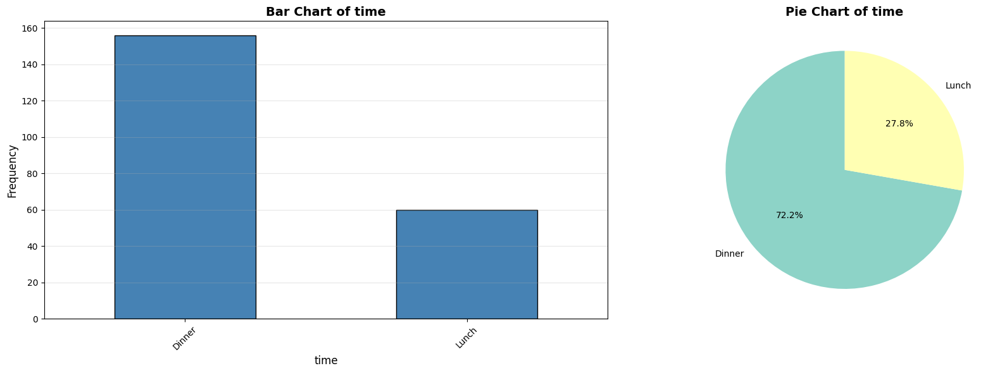


CATEGORICAL vs NUMERICAL ANALYSIS

sex vs total_bill


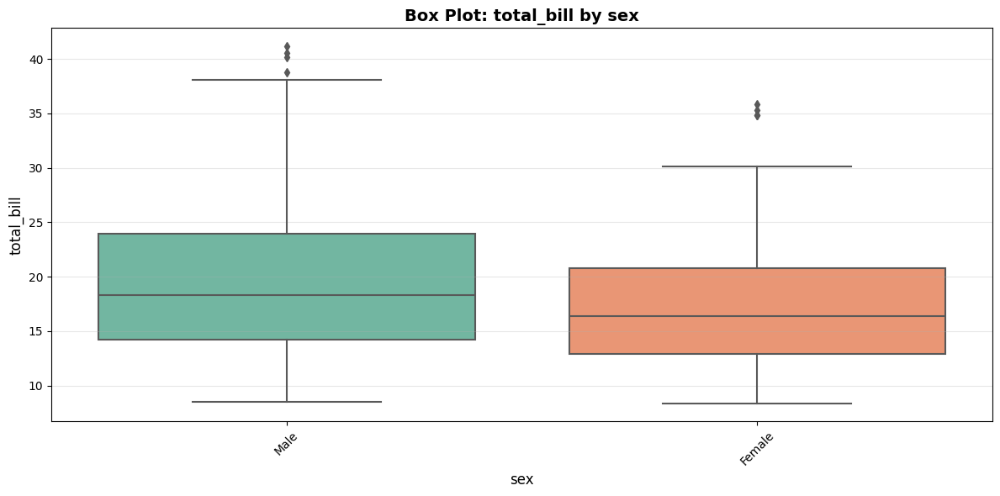

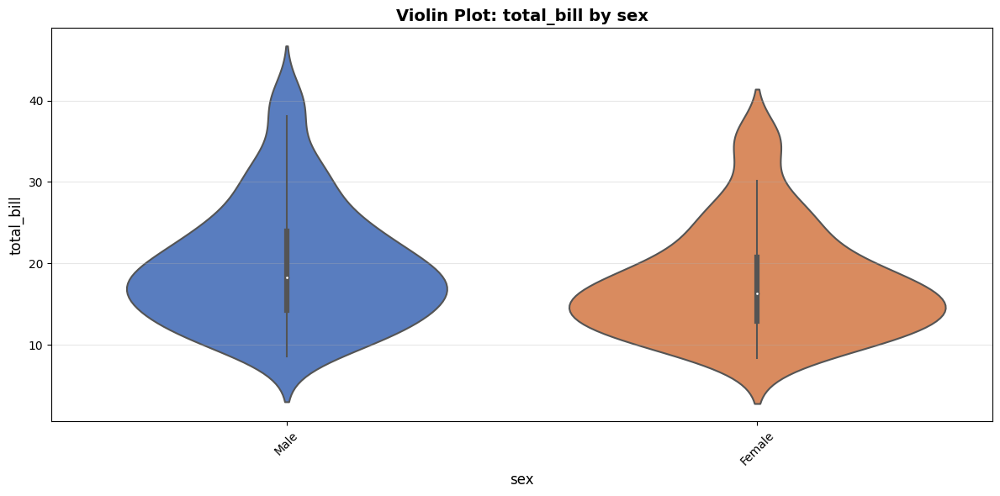


Group Statistics:
        count    mean  median    std   min    max
sex                                              
Male      140  19.811  18.285  7.410  8.52  41.19
Female     76  17.664  16.360  6.616  8.35  35.83

sex vs tip


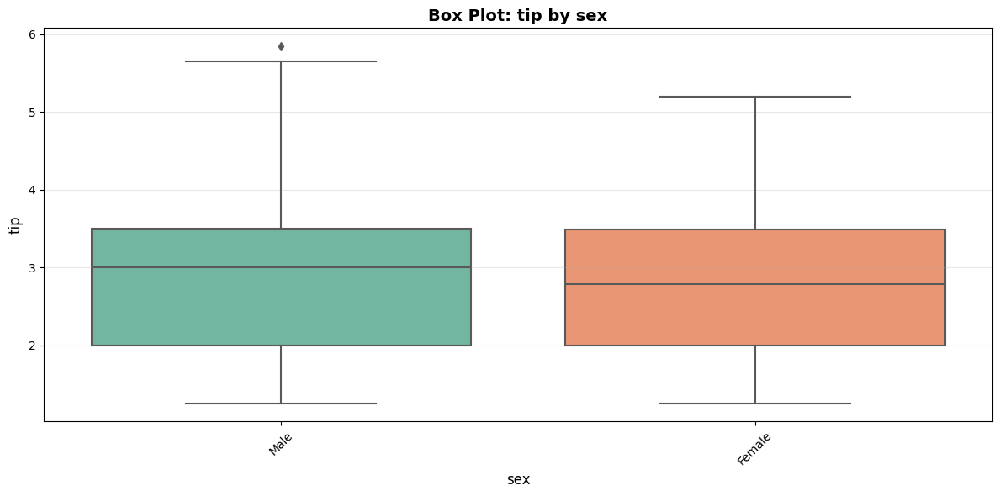

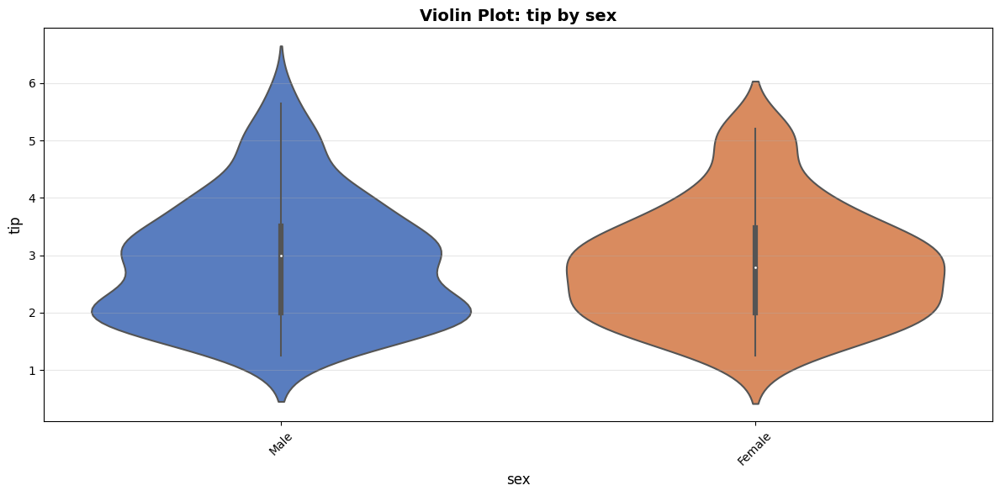


Group Statistics:
        count   mean  median    std   min   max
sex                                            
Male      140  2.886    3.00  1.069  1.25  5.85
Female     76  2.847    2.79  0.989  1.25  5.20

smoker vs total_bill


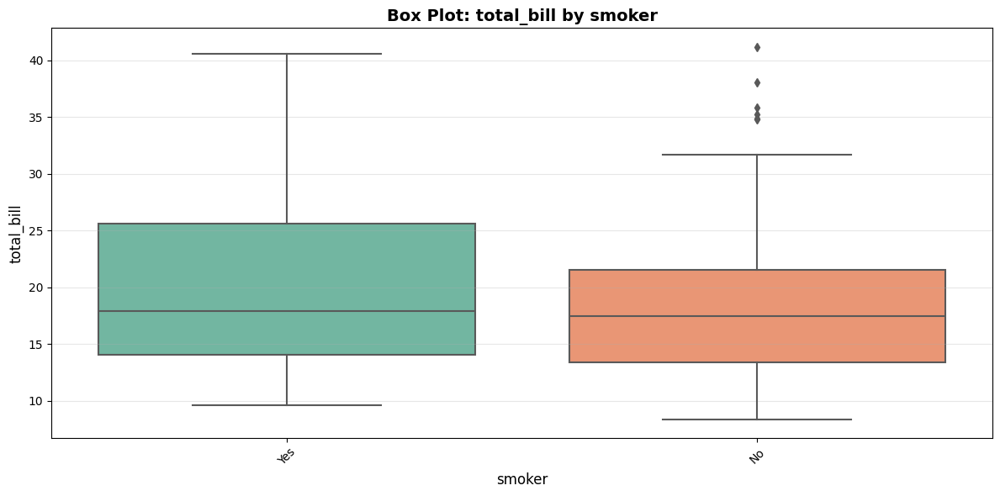

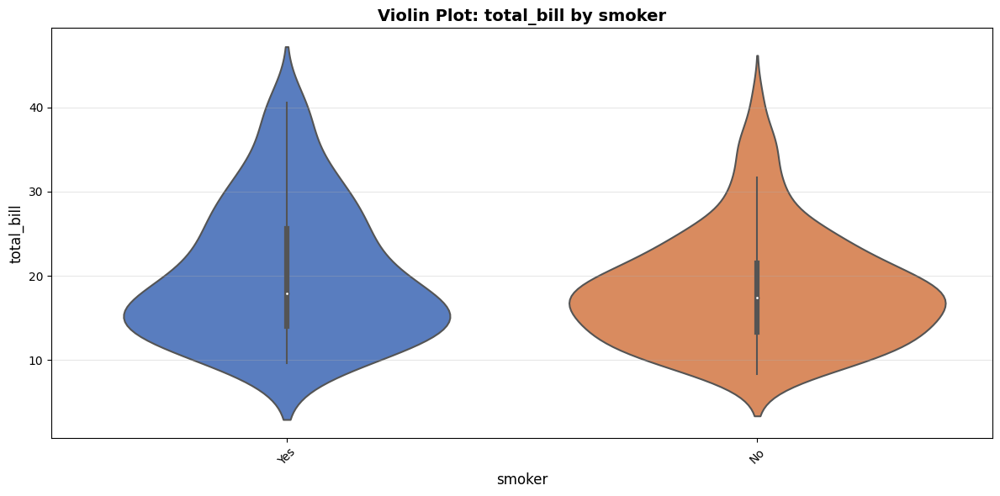


Group Statistics:
        count    mean  median    std   min    max
smoker                                           
Yes        79  20.313   17.92  7.961  9.60  40.55
No        137  18.331   17.46  6.643  8.35  41.19

smoker vs tip


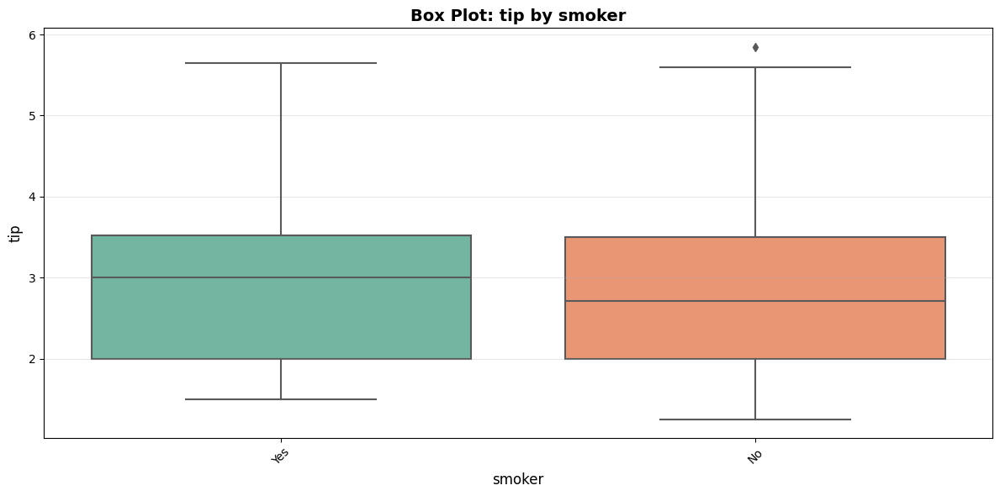

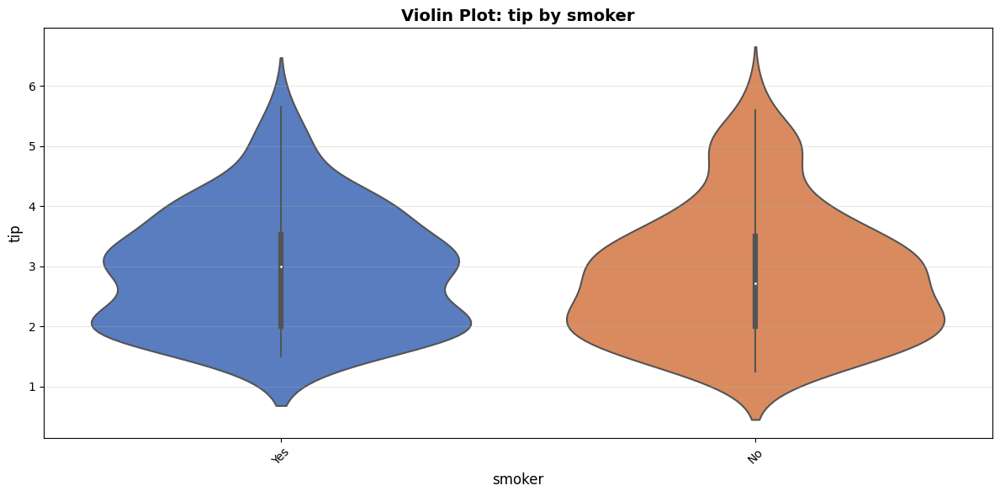


Group Statistics:
        count   mean  median    std   min   max
smoker                                         
Yes        79  2.937    3.00  0.982  1.50  5.65
No        137  2.835    2.71  1.073  1.25  5.85

ANALYSIS COMPLETE


EXAMPLE 3: Analysis with Column Dropping
COMPREHENSIVE EXPLORATORY DATA ANALYSIS

✓ Dropped columns: ['size']

Dataset Shape: (244, 6)
Number of Rows: 244
Number of Columns: 6

DATA TYPES AND MISSING VALUES

Column Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 244 entries, 0 to 243
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   total_bill  244 non-null    float64 
 1   tip         244 non-null    float64 
 2   sex         244 non-null    category
 3   smoker      244 non-null    category
 4   day         244 non-null    category
 5   time        244 non-null    category
dtypes: category(4), float64(2)
memory usage: 5.5 KB
None


Missing Values Summary:
Empty DataFrame


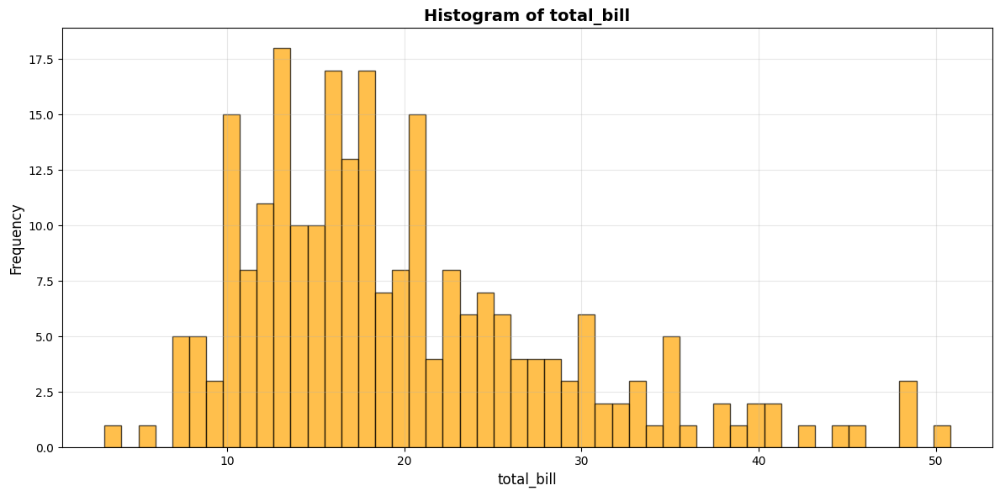

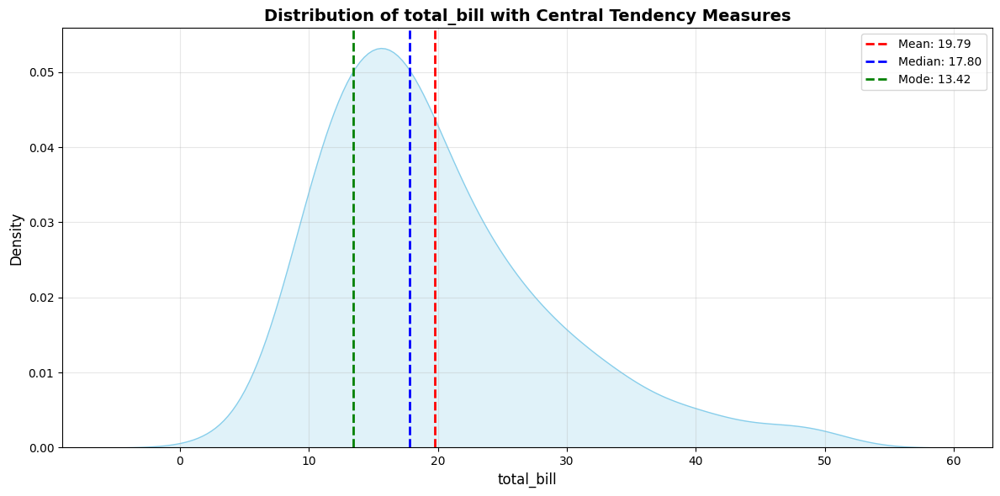

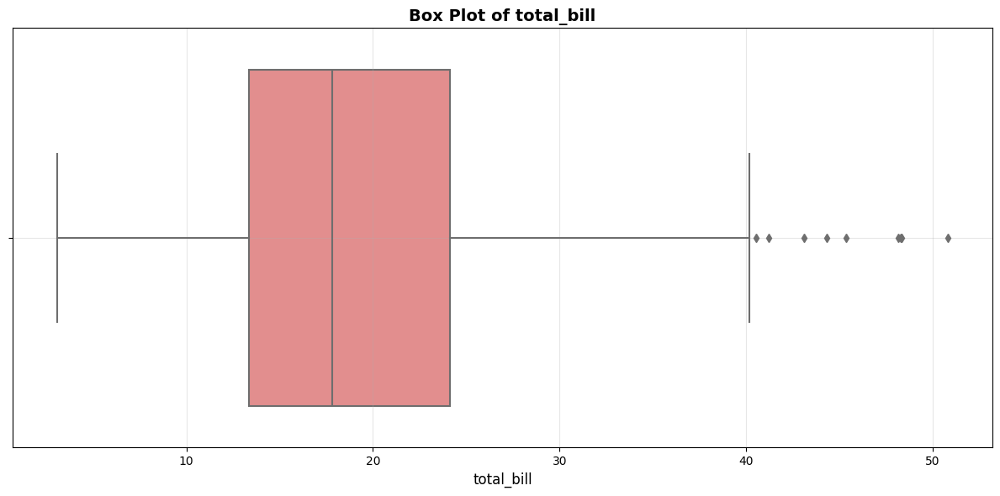

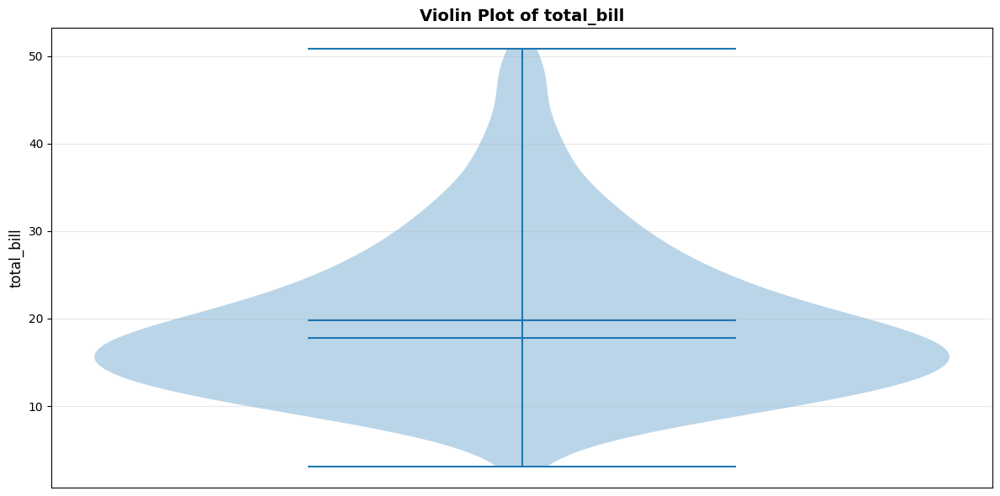


ANALYZING: tip
Mean: 2.998
Median: 2.900
Mode: 2.000
Std Dev: 1.384
Min: 1.000
Max: 10.000


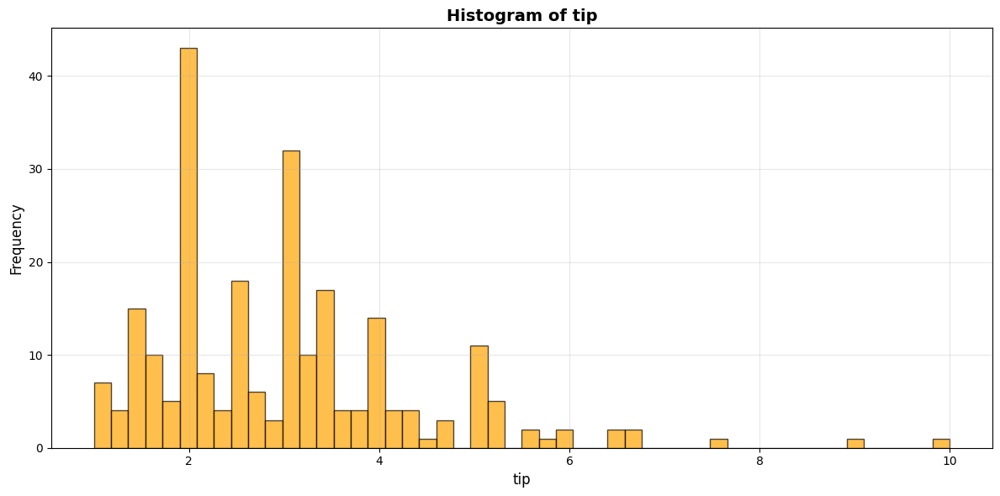

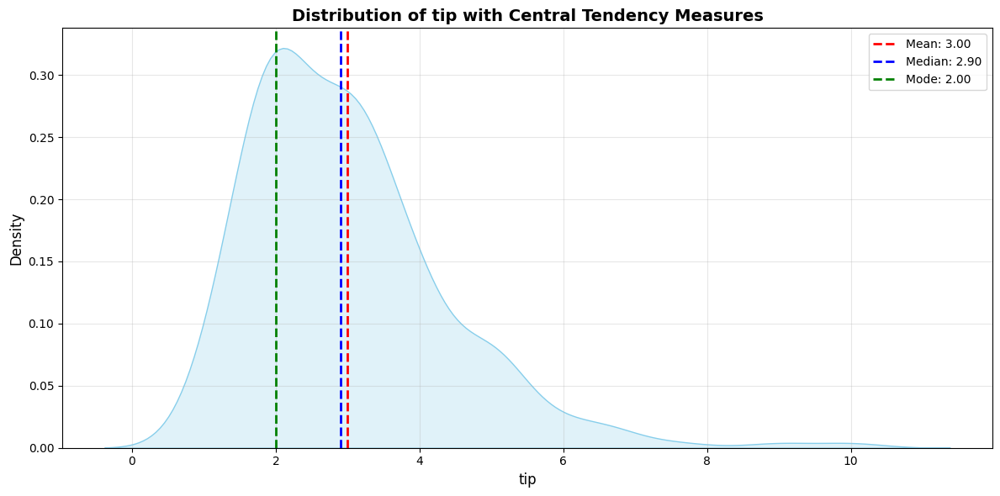

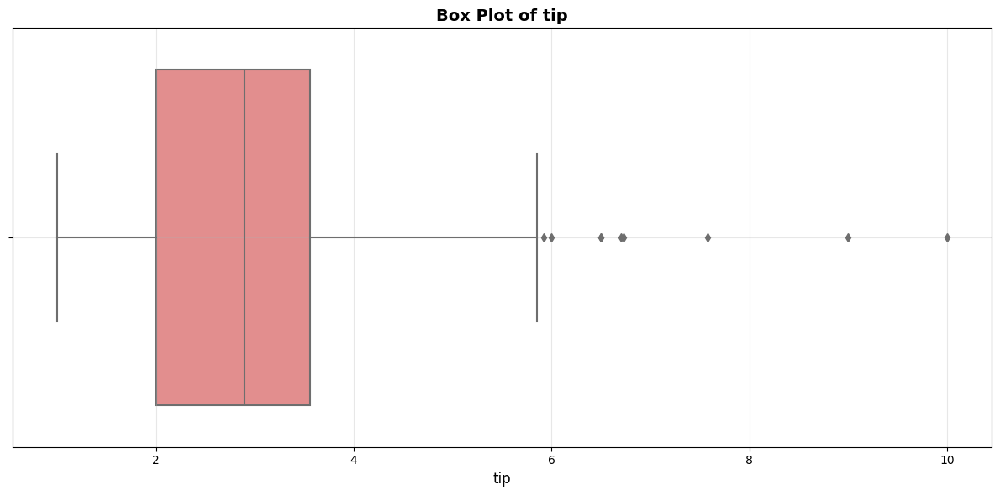

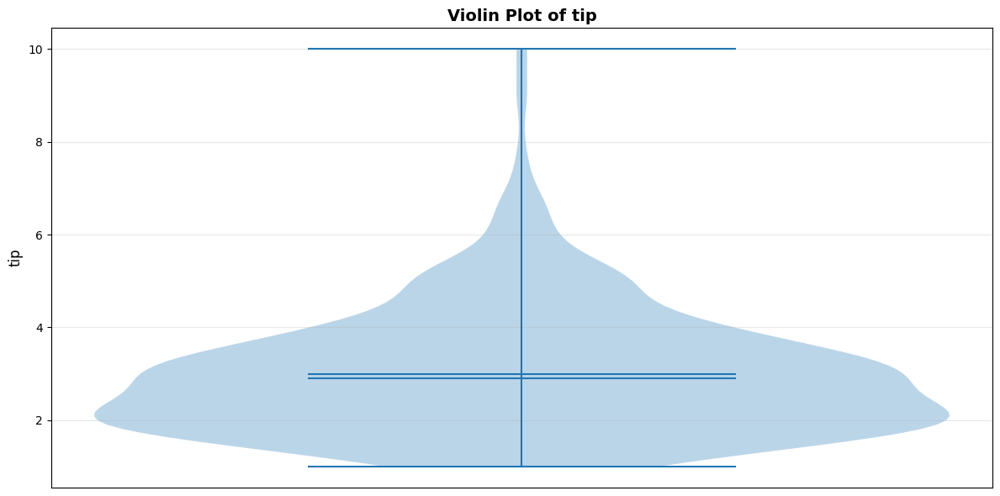


CORRELATION ANALYSIS

Correlation Matrix:
            total_bill    tip
total_bill       1.000  0.676
tip              0.676  1.000


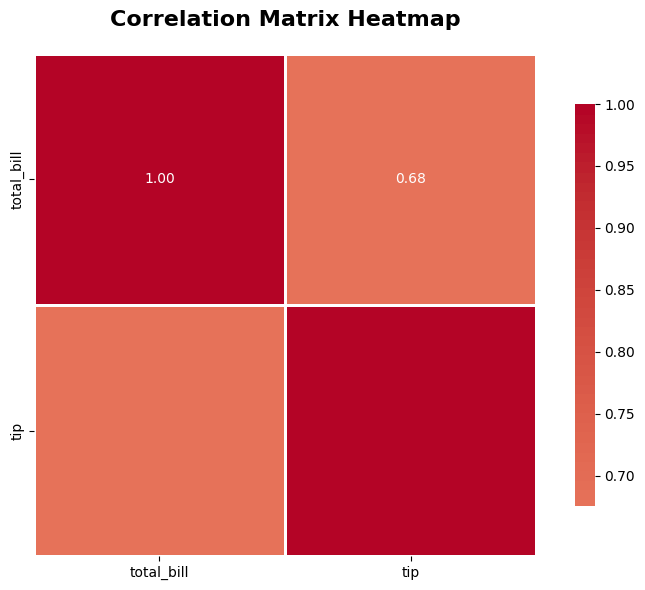


Strong Correlations (|r| > 0.5):
total_bill <-> tip: 0.676

PAIRWISE RELATIONSHIPS


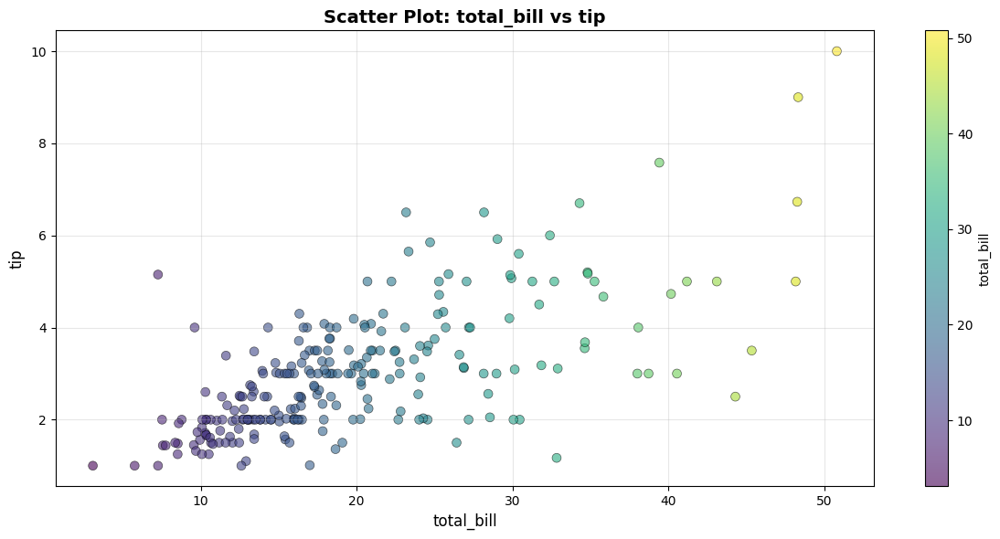

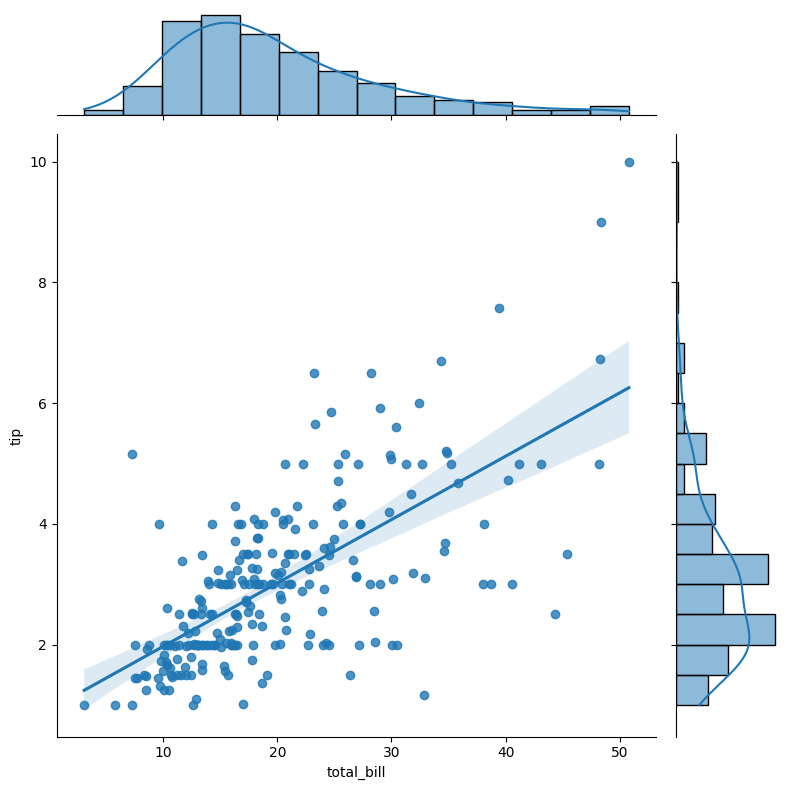


Generating Pair Plot...


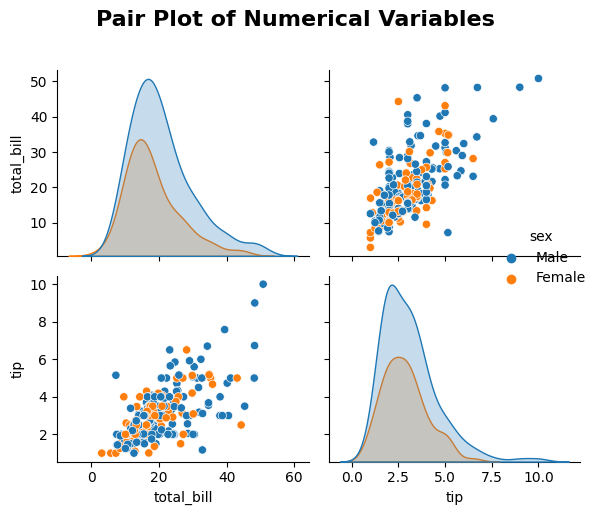


CATEGORICAL VARIABLES ANALYSIS

Categorical Columns: ['sex', 'smoker', 'day', 'time']

ANALYZING: sex

Unique Values: 2

Value Counts:
Category  Count  Percentage
    Male    157       64.34
  Female     87       35.66


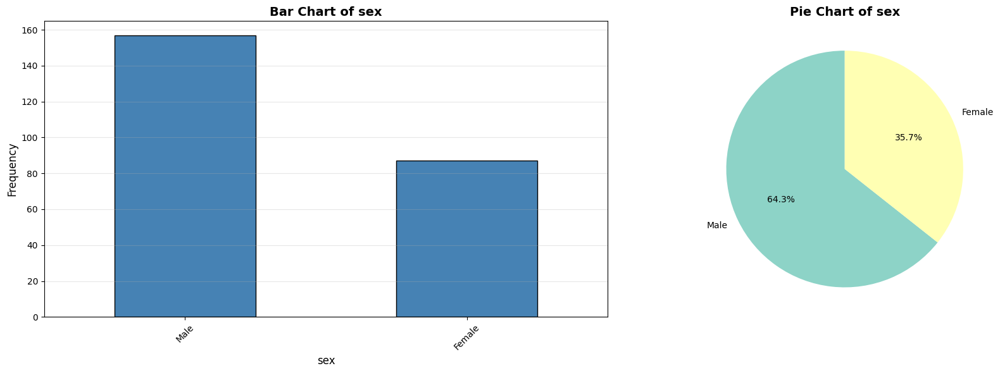


ANALYZING: smoker

Unique Values: 2

Value Counts:
Category  Count  Percentage
      No    151       61.89
     Yes     93       38.11


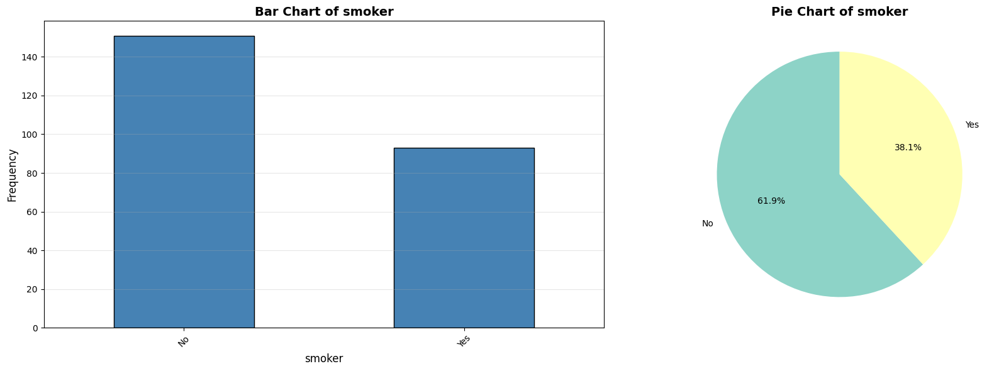


ANALYZING: day

Unique Values: 4

Value Counts:
Category  Count  Percentage
     Sat     87       35.66
     Sun     76       31.15
    Thur     62       25.41
     Fri     19        7.79


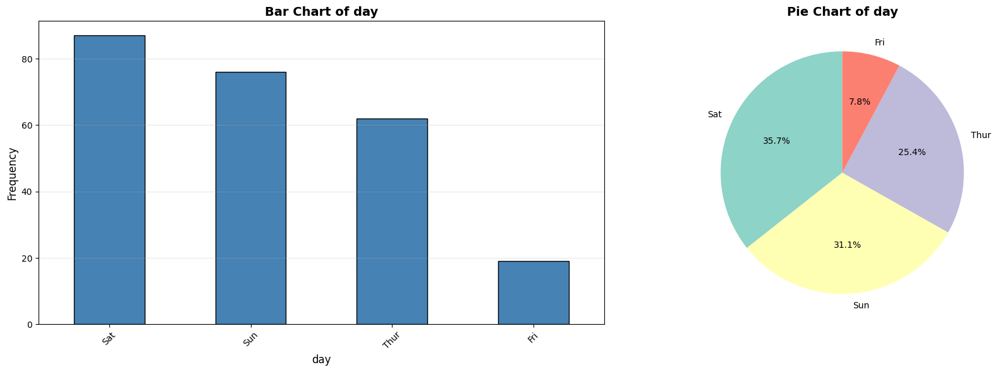


ANALYZING: time

Unique Values: 2

Value Counts:
Category  Count  Percentage
  Dinner    176       72.13
   Lunch     68       27.87


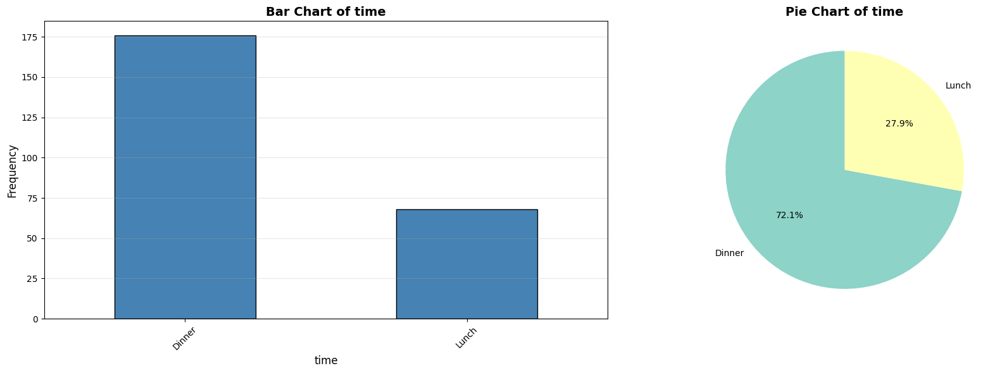


CATEGORICAL vs NUMERICAL ANALYSIS

sex vs total_bill


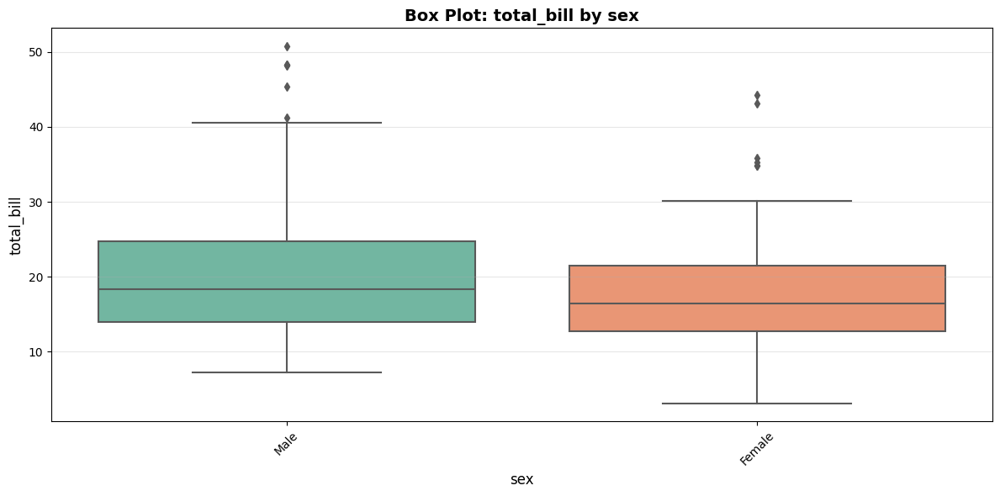

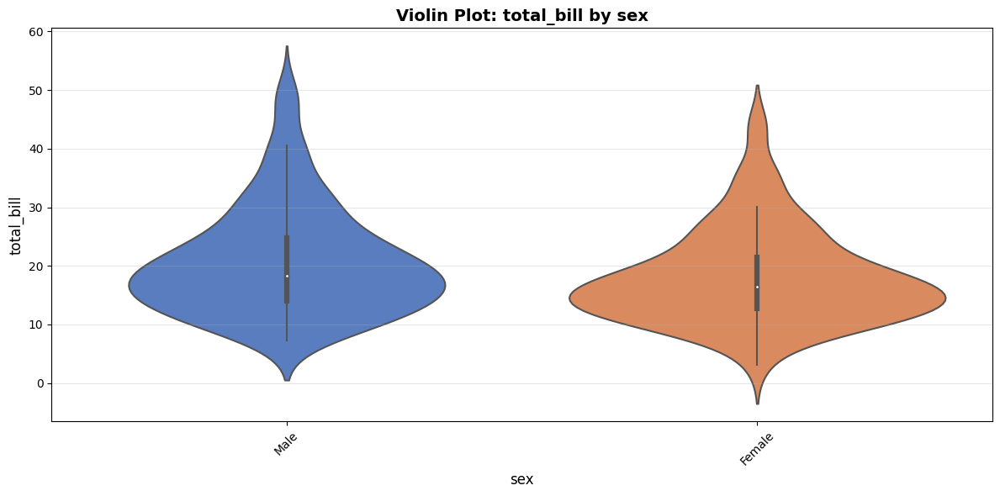


Group Statistics:
        count    mean  median    std   min    max
sex                                              
Male      157  20.744   18.35  9.246  7.25  50.81
Female     87  18.057   16.40  8.009  3.07  44.30

sex vs tip


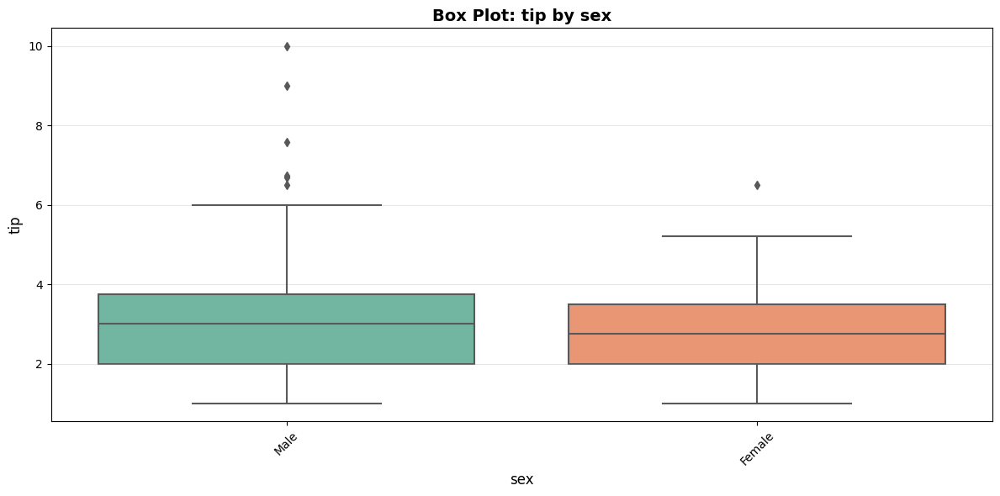

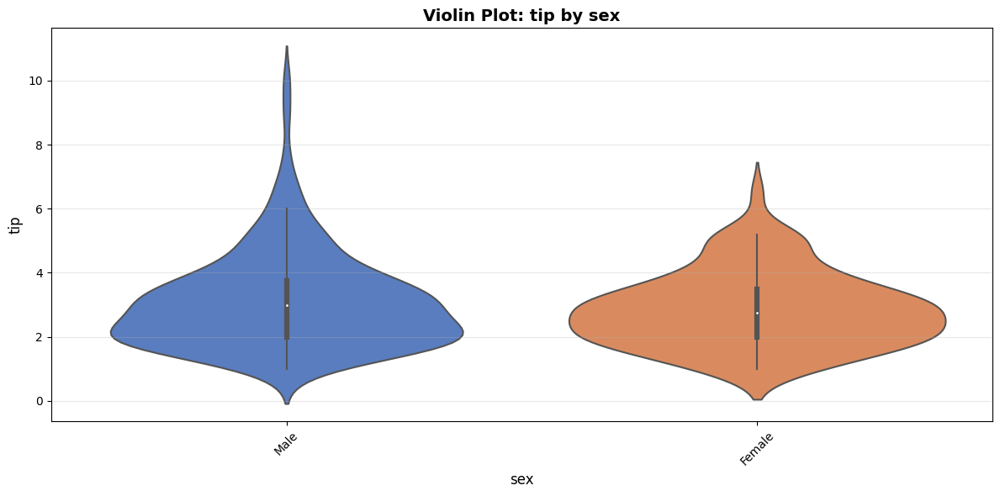


Group Statistics:
        count   mean  median    std  min   max
sex                                           
Male      157  3.090    3.00  1.489  1.0  10.0
Female     87  2.833    2.75  1.159  1.0   6.5

smoker vs total_bill


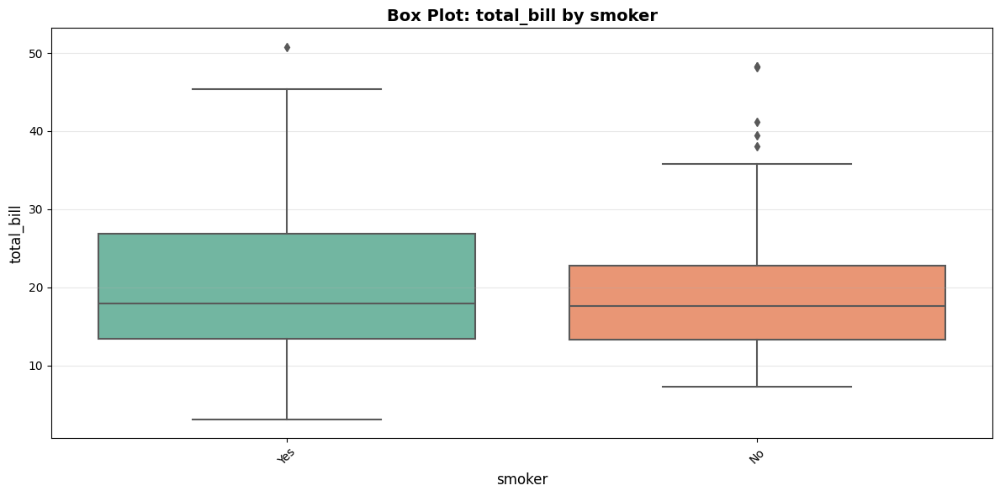

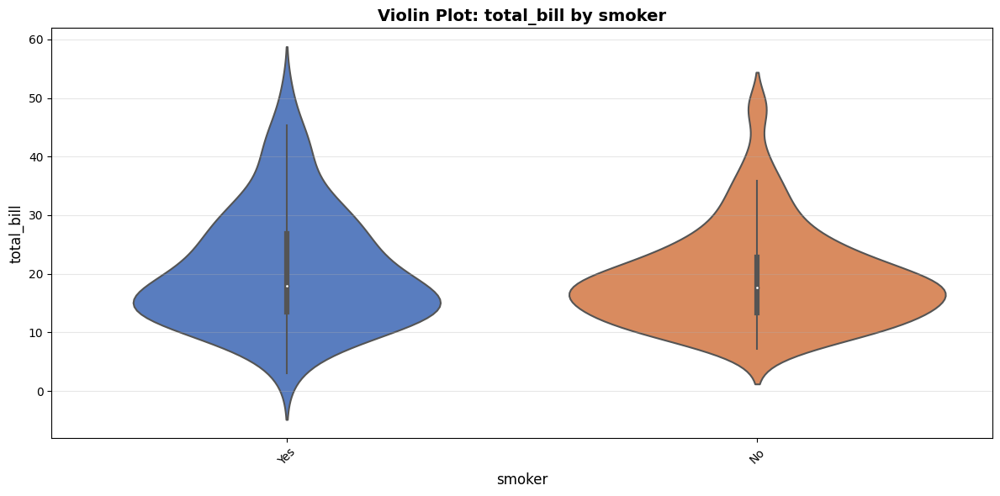


Group Statistics:
        count    mean  median    std   min    max
smoker                                           
Yes        93  20.756   17.92  9.832  3.07  50.81
No        151  19.188   17.59  8.256  7.25  48.33

smoker vs tip


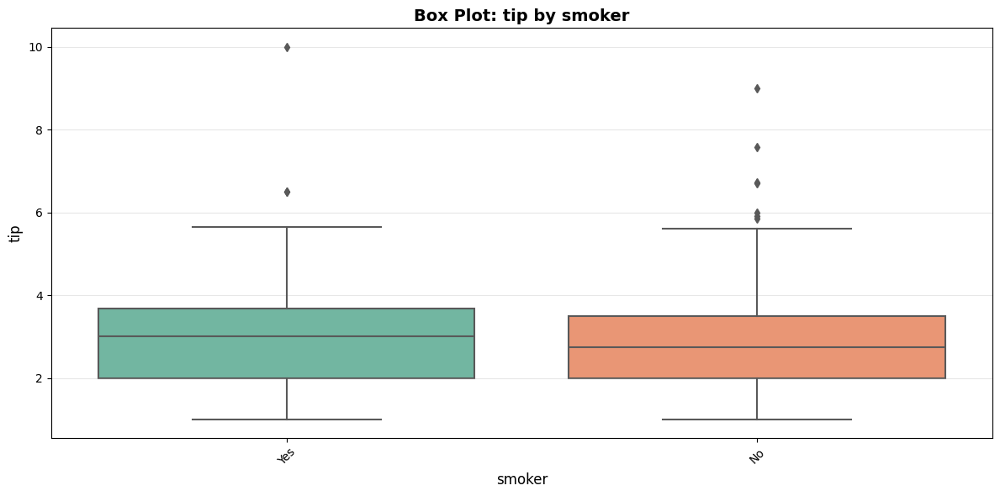

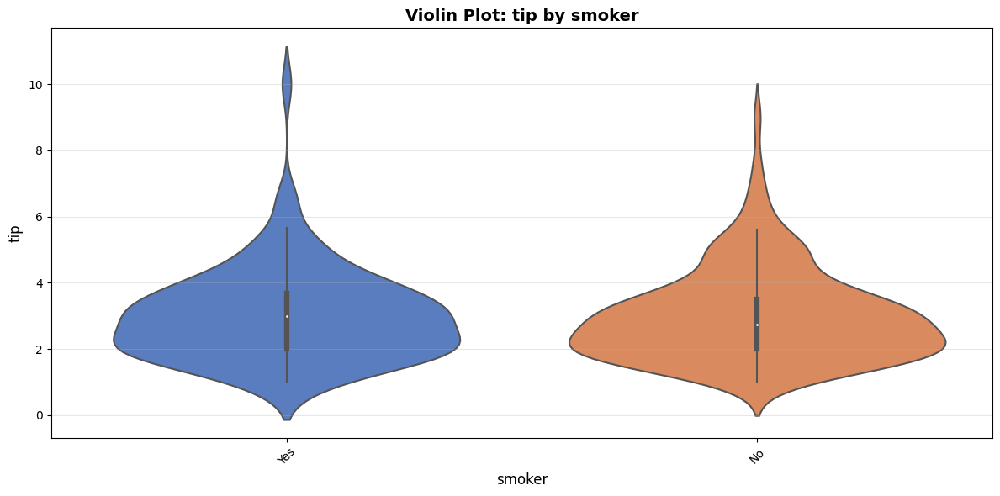


Group Statistics:
        count   mean  median    std  min   max
smoker                                        
Yes        93  3.009    3.00  1.401  1.0  10.0
No        151  2.992    2.74  1.377  1.0   9.0

ANALYSIS COMPLETE


EXAMPLE 4: Combined Percentile Filtering and Column Dropping
COMPREHENSIVE EXPLORATORY DATA ANALYSIS

✓ Dropped columns: ['size', 'smoker']

📊 Filtering data to 99th percentile...
✓ Filtered 8 rows (3.28%) as outliers
✓ Remaining data: 236 rows

Dataset Shape: (236, 5)
Number of Rows: 236
Number of Columns: 5

DATA TYPES AND MISSING VALUES

Column Information:
<class 'pandas.core.frame.DataFrame'>
Index: 236 entries, 0 to 243
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   total_bill  236 non-null    float64 
 1   tip         236 non-null    float64 
 2   sex         236 non-null    category
 3   day         236 non-null    category
 4   time        236 non-null    category
dtypes: category

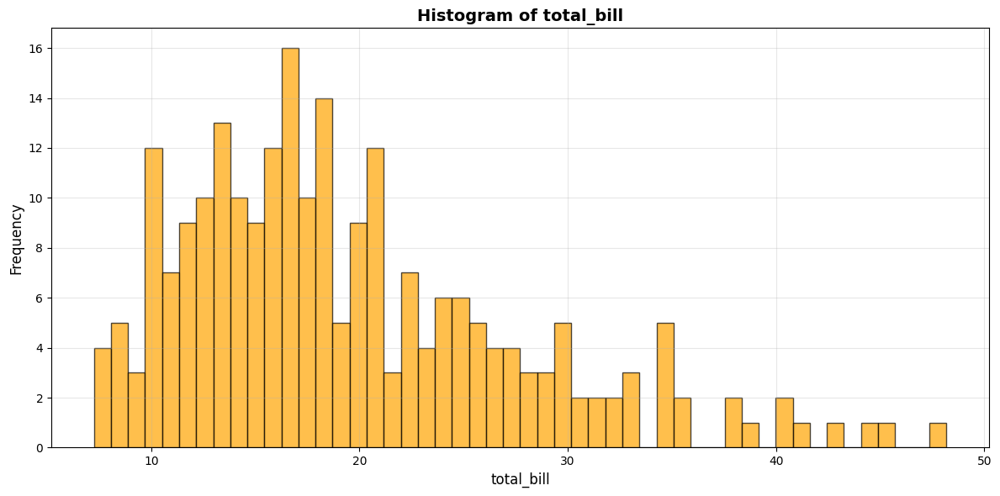

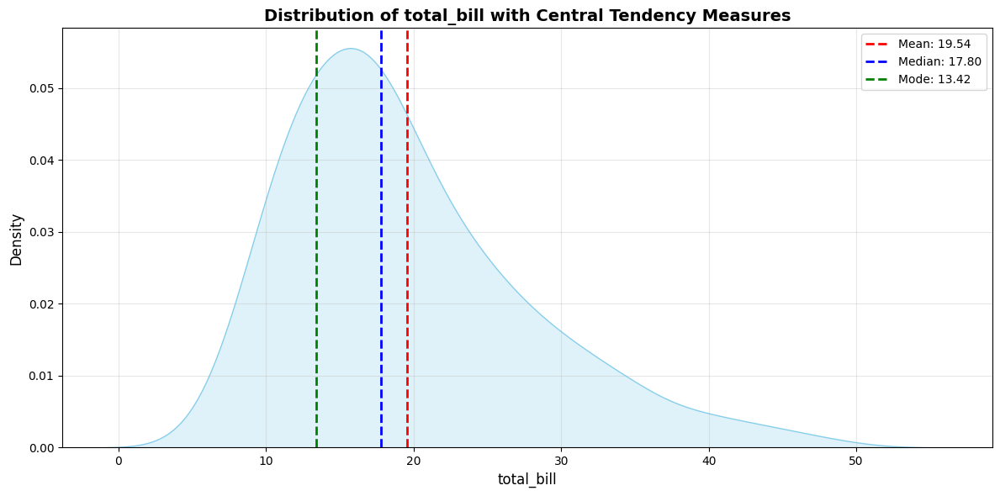

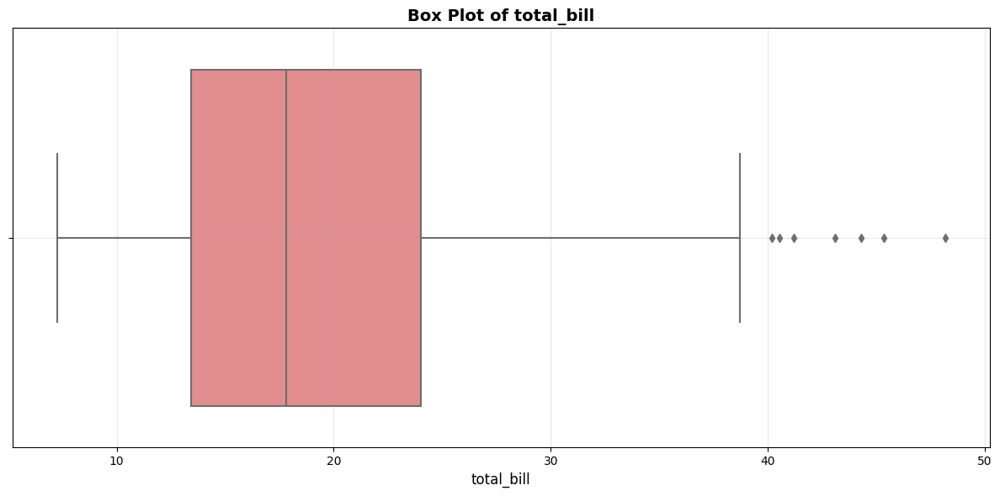

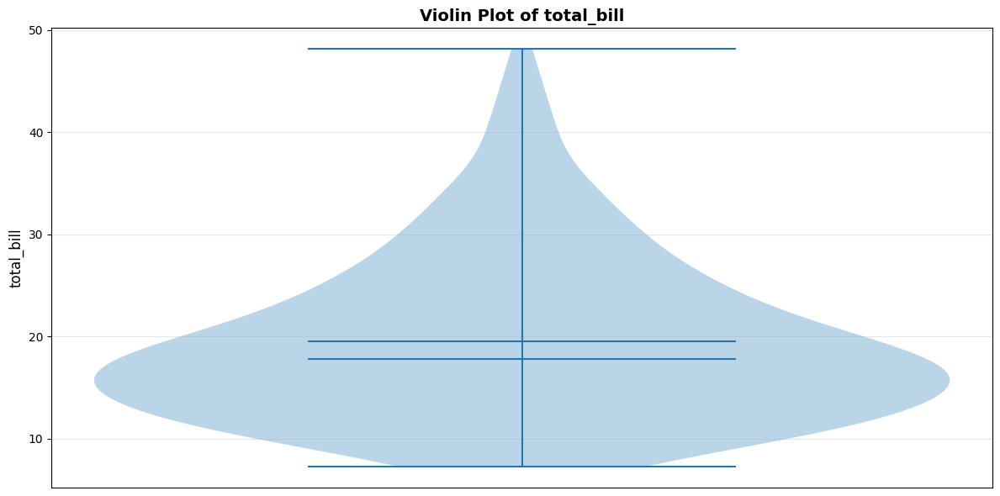


ANALYZING: tip
Mean: 2.942
Median: 2.900
Mode: 2.000
Std Dev: 1.182
Min: 1.010
Max: 6.700


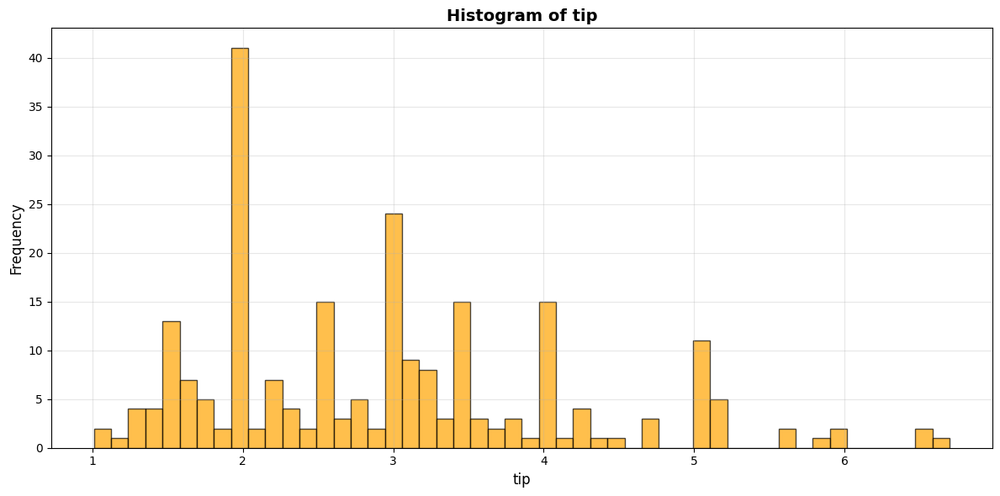

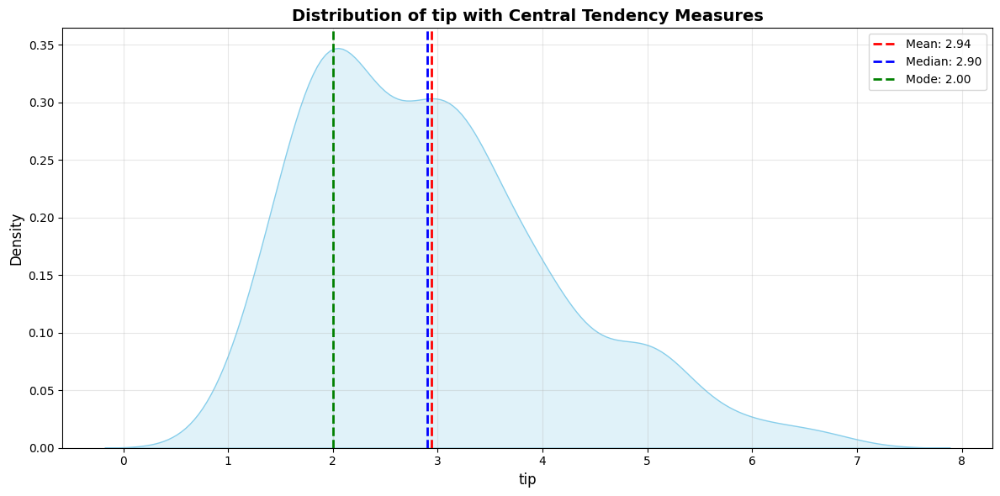

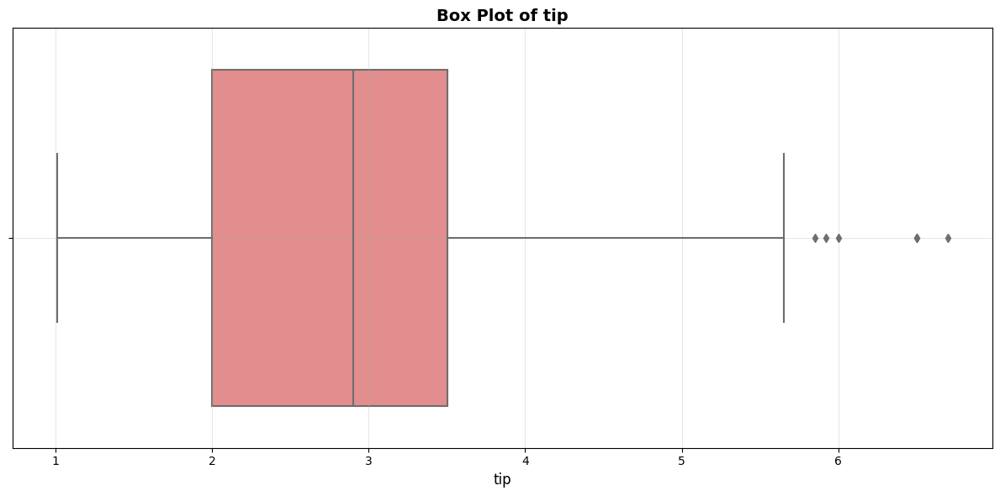

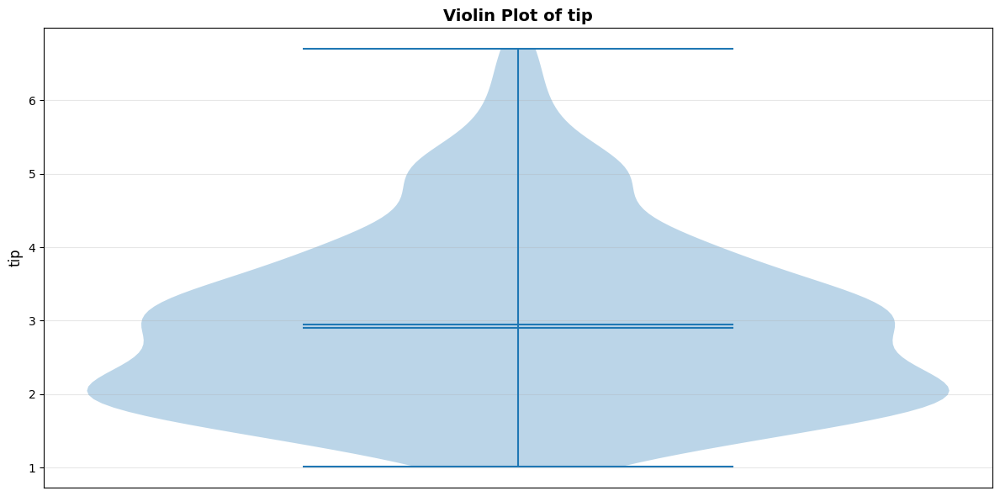


CORRELATION ANALYSIS

Correlation Matrix:
            total_bill    tip
total_bill       1.000  0.589
tip              0.589  1.000


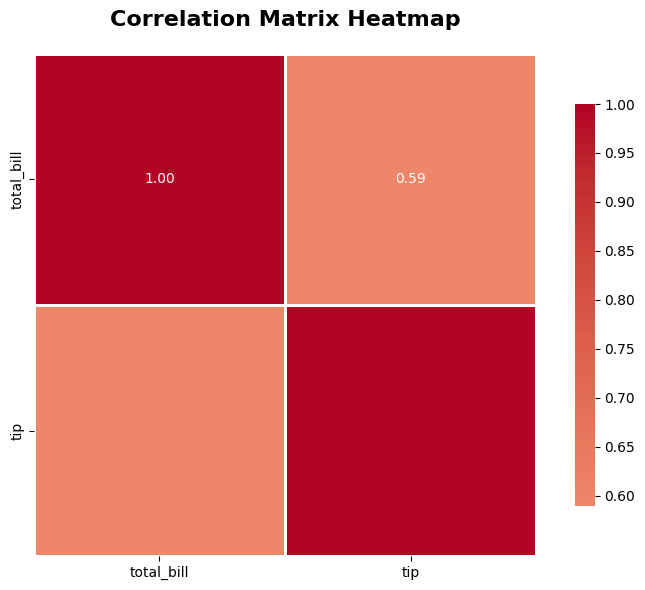


Strong Correlations (|r| > 0.5):
total_bill <-> tip: 0.589

PAIRWISE RELATIONSHIPS


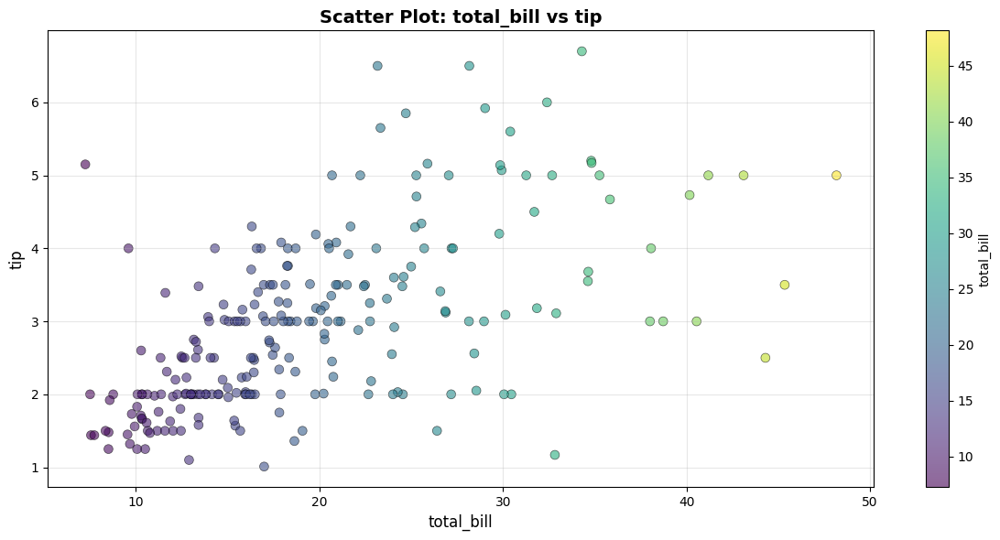

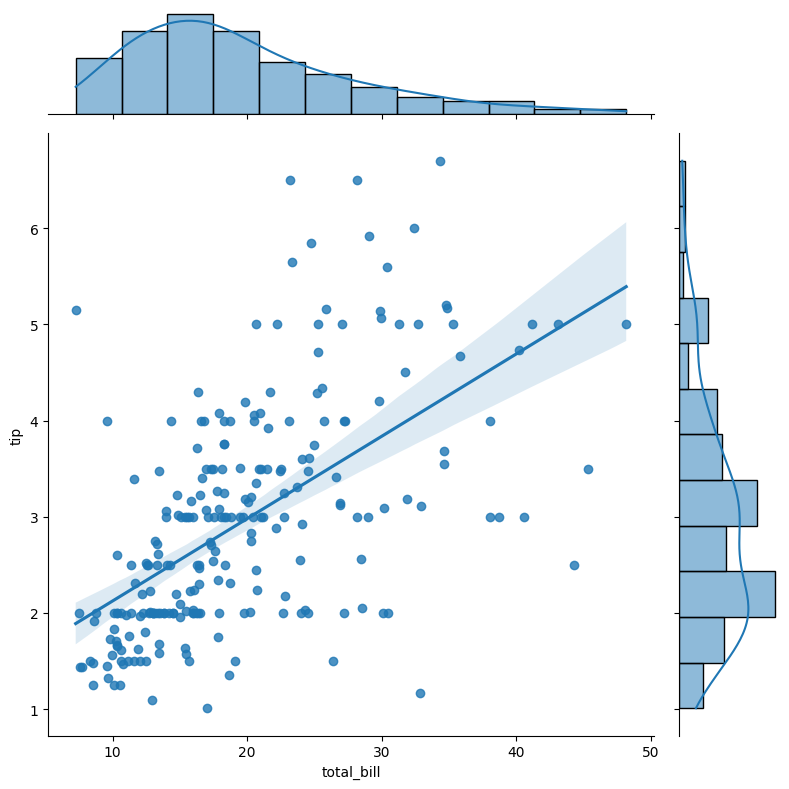


Generating Pair Plot...


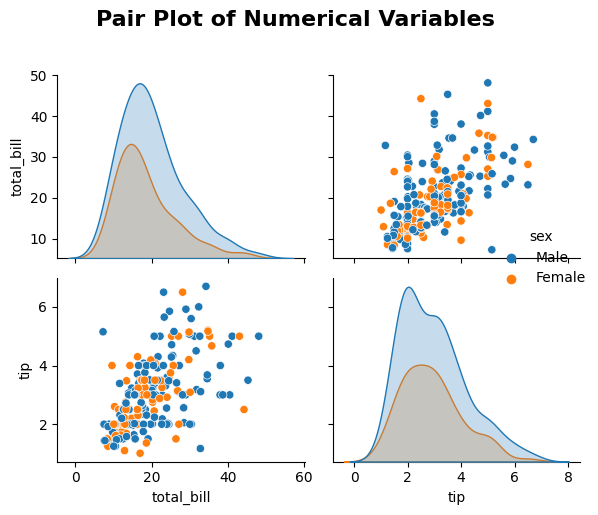


CATEGORICAL VARIABLES ANALYSIS

Categorical Columns: ['sex', 'day', 'time']

ANALYZING: sex

Unique Values: 2

Value Counts:
Category  Count  Percentage
    Male    152       64.41
  Female     84       35.59


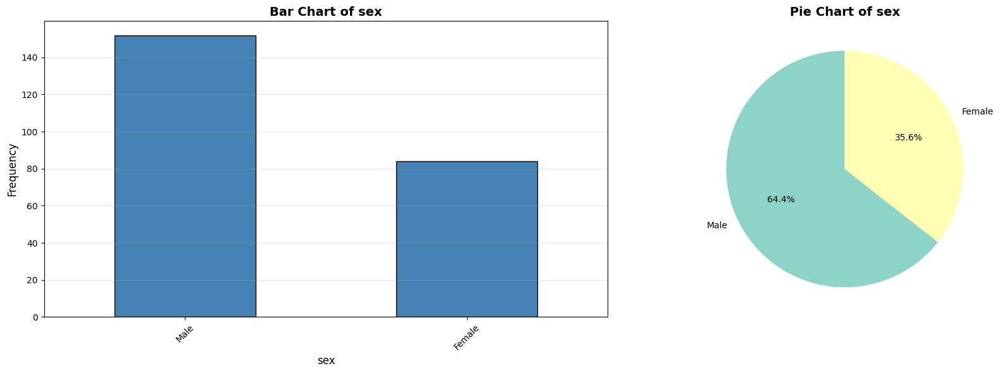


ANALYZING: day

Unique Values: 4

Value Counts:
Category  Count  Percentage
     Sat     80       33.90
     Sun     76       32.20
    Thur     62       26.27
     Fri     18        7.63


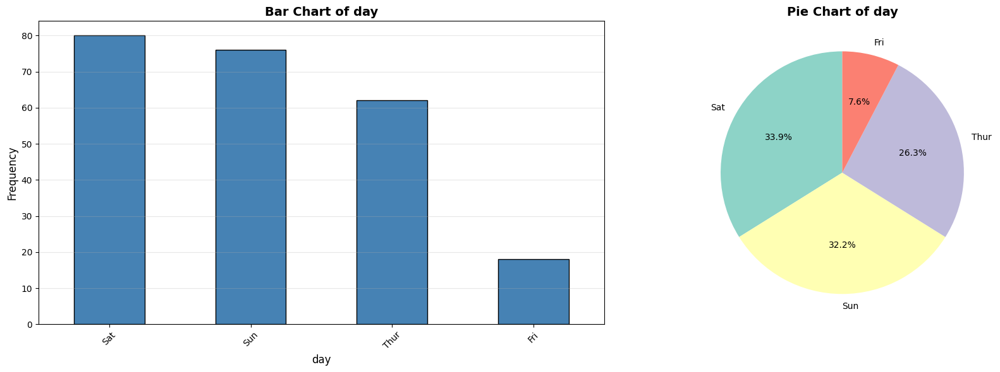


ANALYZING: time

Unique Values: 2

Value Counts:
Category  Count  Percentage
  Dinner    168       71.19
   Lunch     68       28.81


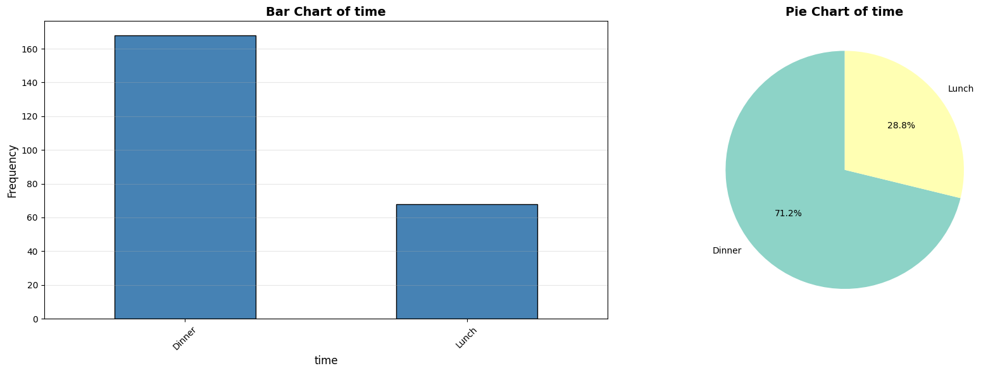


CATEGORICAL vs NUMERICAL ANALYSIS

sex vs total_bill


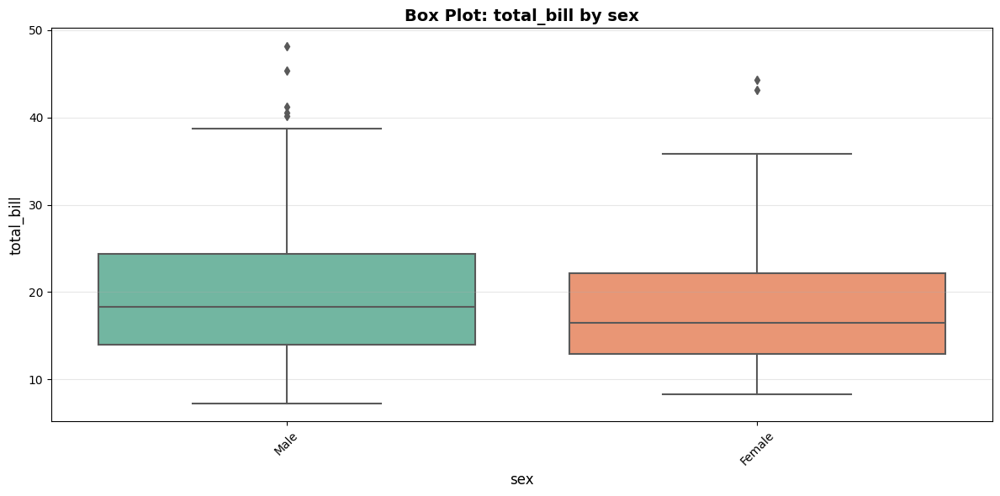

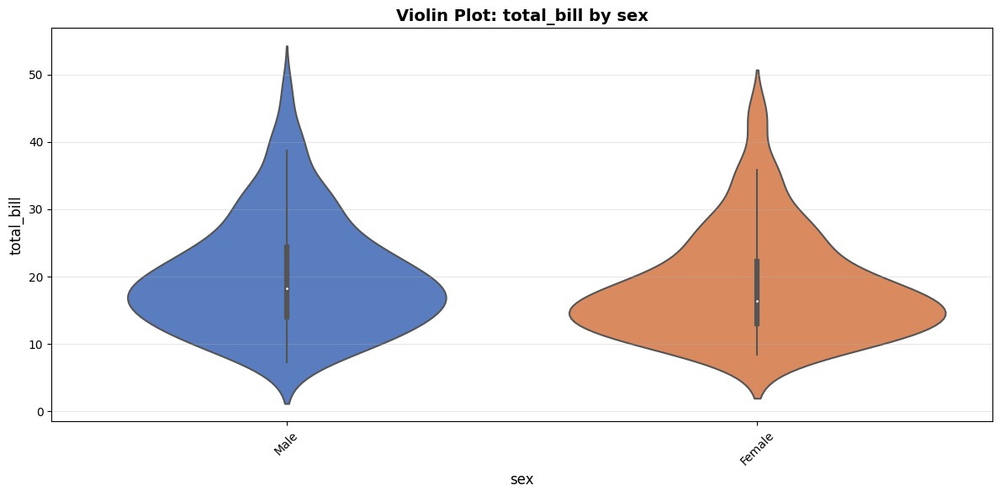


Group Statistics:
        count    mean  median    std   min    max
sex                                              
Male      152  20.114   18.29  8.315  7.25  48.17
Female     84  18.510   16.44  7.767  8.35  44.30

sex vs tip


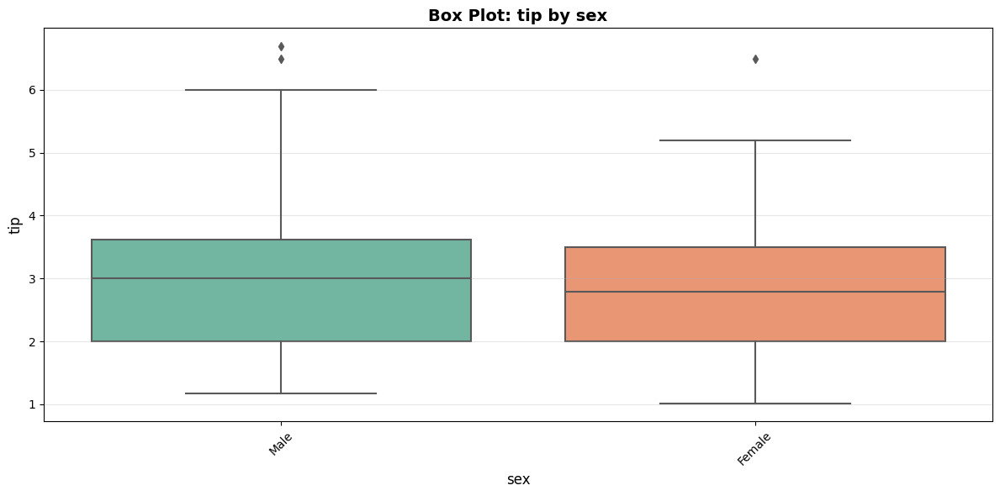

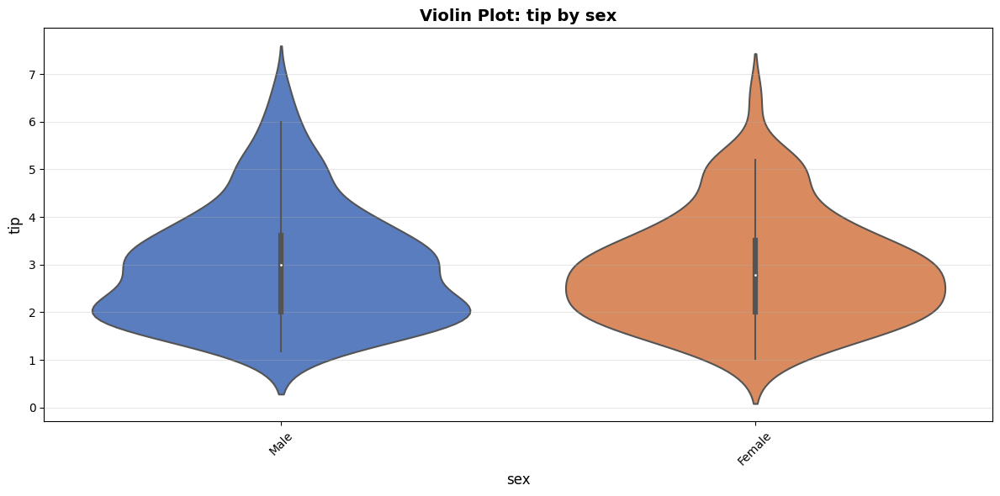


Group Statistics:
        count   mean  median    std   min  max
sex                                           
Male      152  2.966    3.00  1.216  1.17  6.7
Female     84  2.899    2.79  1.126  1.01  6.5

day vs total_bill


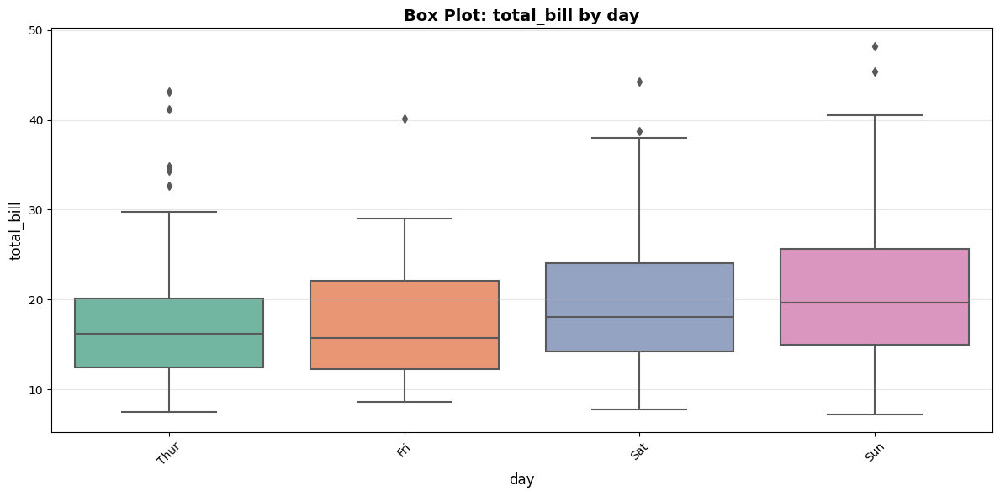

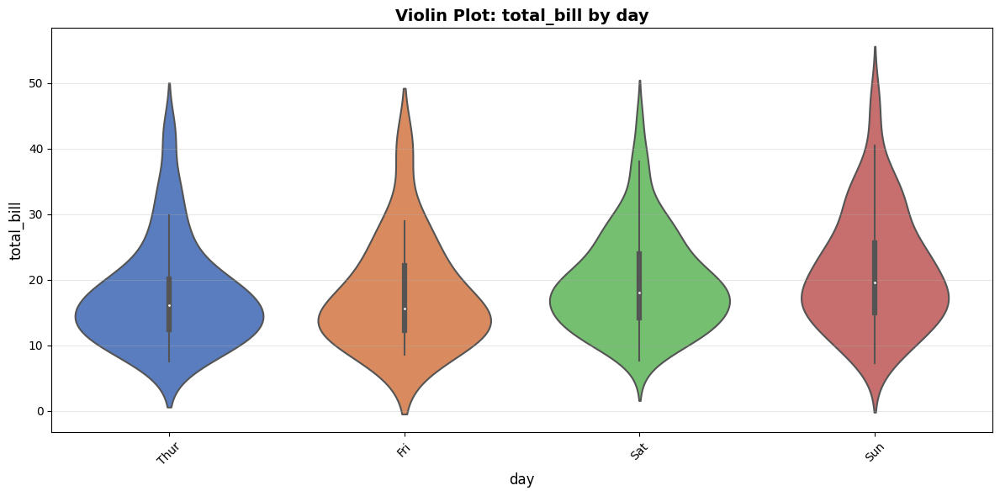


Group Statistics:
      count    mean  median    std   min    max
day                                            
Thur     62  17.683   16.20  7.886  7.51  43.11
Fri      18  17.785   15.68  8.057  8.58  40.17
Sat      80  19.608   18.08  7.379  7.74  44.30
Sun      76  21.410   19.63  8.832  7.25  48.17

day vs tip


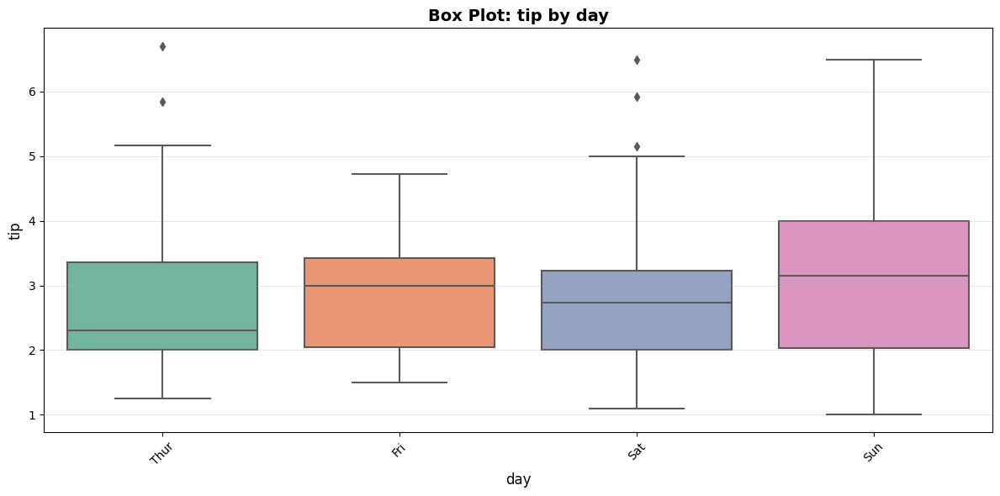

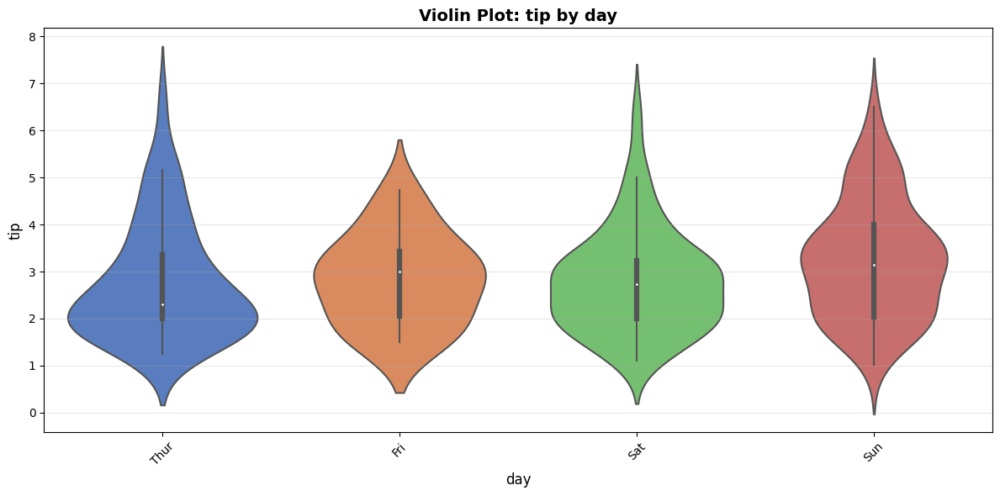


Group Statistics:
      count   mean  median    std   min   max
day                                          
Thur     62  2.771   2.305  1.240  1.25  6.70
Fri      18  2.831   3.000  0.956  1.50  4.73
Sat      80  2.801   2.735  1.089  1.10  6.50
Sun      76  3.255   3.150  1.235  1.01  6.50

ANALYSIS COMPLETE


Summary Statistics returned:
Shape: (236, 5)
Numerical columns: ['total_bill', 'tip']
Categorical columns: ['sex', 'day', 'time']


In [19]:
def comprehensive_eda(df, figsize=(12, 6), categorical_threshold=10, percentile=100, columns_to_drop=None):
    """
    Performs comprehensive Exploratory Data Analysis on a DataFrame.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        The dataframe to analyze
    figsize : tuple, default=(12, 6)
        Default figure size for plots
    categorical_threshold : int, default=10
        Maximum unique values for a column to be considered categorical
    percentile : float, default=100
        Percentile threshold for filtering outliers (e.g., 99 keeps data within 99th percentile)
        Value must be between 0 and 100. Use 100 to keep all data.
    columns_to_drop : list, default=None
        List of column names to exclude from analysis
    
    Returns:
    --------
    dict : Dictionary containing statistical summaries
    """
    
    print("="*80)
    print("COMPREHENSIVE EXPLORATORY DATA ANALYSIS")
    print("="*80)
    
    # Validate percentile parameter
    if not 0 < percentile <= 100:
        raise ValueError("Percentile must be between 0 and 100")
    
    # Create a copy to avoid modifying original dataframe
    df = df.copy()
    
    # Drop specified columns
    if columns_to_drop is not None:
        if not isinstance(columns_to_drop, list):
            columns_to_drop = [columns_to_drop]
        
        # Validate columns exist
        invalid_cols = [col for col in columns_to_drop if col not in df.columns]
        if invalid_cols:
            print(f"\n⚠️  Warning: Columns not found and will be ignored: {invalid_cols}")
        
        valid_cols_to_drop = [col for col in columns_to_drop if col in df.columns]
        if valid_cols_to_drop:
            df = df.drop(columns=valid_cols_to_drop)
            print(f"\n✓ Dropped columns: {valid_cols_to_drop}")
    
    # Filter outliers based on percentile
    original_shape = df.shape
    if percentile < 100:
        print(f"\n📊 Filtering data to {percentile}th percentile...")
        numerical_cols_for_filter = df.select_dtypes(include=[np.number]).columns.tolist()
        
        # Calculate percentile bounds for each numerical column
        for col in numerical_cols_for_filter:
            lower_bound = df[col].quantile((100 - percentile) / 200)
            upper_bound = df[col].quantile((100 + percentile) / 200)
            df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
        
        filtered_rows = original_shape[0] - df.shape[0]
        filtered_pct = (filtered_rows / original_shape[0] * 100)
        print(f"✓ Filtered {filtered_rows:,} rows ({filtered_pct:.2f}%) as outliers")
        print(f"✓ Remaining data: {df.shape[0]:,} rows")
    
    print(f"\nDataset Shape: {df.shape}")
    print(f"Number of Rows: {df.shape[0]}")
    print(f"Number of Columns: {df.shape[1]}")
    
    # Identify numerical and categorical columns
    numerical_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
    
    # Also check for numerical columns with few unique values (potential categorical)
    for col in numerical_cols.copy():
        if df[col].nunique() <= categorical_threshold:
            print(f"\nNote: '{col}' is numerical but has only {df[col].nunique()} unique values. Consider treating as categorical.")
    
    print(f"\n{'='*80}")
    print("DATA TYPES AND MISSING VALUES")
    print("="*80)
    print("\nColumn Information:")
    print(df.info())
    
    print("\n\nMissing Values Summary:")
    missing_df = pd.DataFrame({
        'Column': df.columns,
        'Missing_Count': df.isnull().sum(),
        'Missing_Percentage': (df.isnull().sum() / len(df) * 100).round(2)
    })
    print(missing_df[missing_df['Missing_Count'] > 0])
    
    # ===========================
    # NUMERICAL VARIABLES ANALYSIS
    # ===========================
    if len(numerical_cols) > 0:
        print(f"\n{'='*80}")
        print("NUMERICAL VARIABLES ANALYSIS")
        print("="*80)
        print(f"\nNumerical Columns: {numerical_cols}")
        
        # Descriptive Statistics
        print("\n" + "-"*80)
        print("DESCRIPTIVE STATISTICS")
        print("-"*80)
        print(df[numerical_cols].describe().round(3))
        
        # Additional statistics
        print("\n\nADDITIONAL STATISTICS:")
        stats_df = pd.DataFrame({
            'Variable': numerical_cols,
            'Mean': df[numerical_cols].mean().round(3),
            'Median': df[numerical_cols].median().round(3),
            'Std': df[numerical_cols].std().round(3),
            'Skewness': df[numerical_cols].skew().round(3),
            'Kurtosis': df[numerical_cols].kurtosis().round(3)
        })
        print(stats_df.to_string(index=False))
        
        # Analyze each numerical variable
        for col in numerical_cols:
            print(f"\n{'='*80}")
            print(f"ANALYZING: {col}")
            print("="*80)
            
            # Calculate statistics
            col_mean = df[col].mean()
            col_median = df[col].median()
            try:
                col_mode = mode(df[col].dropna())
            except:
                col_mode = df[col].mode()[0] if len(df[col].mode()) > 0 else np.nan
            
            print(f"Mean: {col_mean:.3f}")
            print(f"Median: {col_median:.3f}")
            print(f"Mode: {col_mode:.3f}")
            print(f"Std Dev: {df[col].std():.3f}")
            print(f"Min: {df[col].min():.3f}")
            print(f"Max: {df[col].max():.3f}")
            
            # 1. HISTOGRAM
            plt.figure(figsize=figsize)
            plt.hist(x=df[col].dropna(), bins=min(50, df[col].nunique()), 
                    color='orange', edgecolor='black', alpha=0.7)
            plt.xlabel(col, fontsize=12)
            plt.ylabel('Frequency', fontsize=12)
            plt.title(f'Histogram of {col}', fontsize=14, fontweight='bold')
            plt.grid(alpha=0.3)
            plt.tight_layout()
            plt.show()
            
            # 2. DISTRIBUTION PLOT WITH MEAN, MEDIAN, MODE
            plt.figure(figsize=figsize)
            sns.kdeplot(data=df[col].dropna(), fill=True, color='skyblue')
            plt.axvline(col_mean, color='r', linestyle='--', linewidth=2, label=f'Mean: {col_mean:.2f}')
            plt.axvline(col_median, color='b', linestyle='--', linewidth=2, label=f'Median: {col_median:.2f}')
            plt.axvline(col_mode, color='g', linestyle='--', linewidth=2, label=f'Mode: {col_mode:.2f}')
            plt.xlabel(col, fontsize=12)
            plt.ylabel('Density', fontsize=12)
            plt.title(f'Distribution of {col} with Central Tendency Measures', fontsize=14, fontweight='bold')
            plt.legend()
            plt.grid(alpha=0.3)
            plt.tight_layout()
            plt.show()
            
            # 3. BOX PLOT
            plt.figure(figsize=figsize)
            sns.boxplot(x=df[col], color='lightcoral')
            plt.xlabel(col, fontsize=12)
            plt.title(f'Box Plot of {col}', fontsize=14, fontweight='bold')
            plt.grid(alpha=0.3)
            plt.tight_layout()
            plt.show()
            
            # 4. VIOLIN PLOT
            plt.figure(figsize=figsize)
            parts = plt.violinplot([df[col].dropna()], positions=[0], showmeans=True, 
                                  showmedians=True, showextrema=True)
            plt.ylabel(col, fontsize=12)
            plt.title(f'Violin Plot of {col}', fontsize=14, fontweight='bold')
            plt.xticks([])
            plt.grid(alpha=0.3)
            plt.tight_layout()
            plt.show()
        
        # CORRELATION ANALYSIS
        if len(numerical_cols) > 1:
            print(f"\n{'='*80}")
            print("CORRELATION ANALYSIS")
            print("="*80)
            
            corr_matrix = df[numerical_cols].corr()
            print("\nCorrelation Matrix:")
            print(corr_matrix.round(3))
            
            # Correlation Heatmap
            plt.figure(figsize=(max(8, len(numerical_cols)), max(6, len(numerical_cols)*0.8)))
            sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0, 
                       fmt='.2f', square=True, linewidths=1, cbar_kws={"shrink": 0.8})
            plt.title('Correlation Matrix Heatmap', fontsize=16, fontweight='bold', pad=20)
            plt.tight_layout()
            plt.show()
            
            # Find strong correlations
            print("\nStrong Correlations (|r| > 0.5):")
            for i in range(len(corr_matrix.columns)):
                for j in range(i+1, len(corr_matrix.columns)):
                    if abs(corr_matrix.iloc[i, j]) > 0.5:
                        print(f"{corr_matrix.columns[i]} <-> {corr_matrix.columns[j]}: {corr_matrix.iloc[i, j]:.3f}")
            
            # PAIRWISE SCATTER PLOTS
            if len(numerical_cols) >= 2:
                print(f"\n{'='*80}")
                print("PAIRWISE RELATIONSHIPS")
                print("="*80)
                
                # Scatter plots for pairs
                num_pairs = min(3, len(numerical_cols))  # Show first 3 pairs
                for i in range(num_pairs-1):
                    for j in range(i+1, num_pairs):
                        col1, col2 = numerical_cols[i], numerical_cols[j]
                        
                        # Scatter plot
                        plt.figure(figsize=figsize)
                        plt.scatter(df[col1], df[col2], s=50, alpha=0.6, 
                                   c=df[col1], cmap='viridis', edgecolors='black', linewidth=0.5)
                        plt.xlabel(col1, fontsize=12)
                        plt.ylabel(col2, fontsize=12)
                        plt.title(f'Scatter Plot: {col1} vs {col2}', fontsize=14, fontweight='bold')
                        plt.colorbar(label=col1)
                        plt.grid(alpha=0.3)
                        plt.tight_layout()
                        plt.show()
                        
                        # Joint plot with regression
                        sns.jointplot(x=col1, y=col2, data=df, kind="reg", height=8)
                        plt.tight_layout()
                        plt.show()
                
                # Pair plot
                if len(numerical_cols) <= 5:  # Only if not too many columns
                    print("\nGenerating Pair Plot...")
                    if len(categorical_cols) > 0:
                        # Use first categorical variable for hue
                        hue_col = categorical_cols[0]
                        if df[hue_col].nunique() <= 5:
                            sns.pairplot(data=df, vars=numerical_cols, hue=hue_col, 
                                       diag_kind='kde', height=2.5)
                            plt.suptitle('Pair Plot of Numerical Variables', y=1.02, fontsize=16, fontweight='bold')
                            plt.tight_layout()
                            plt.show()
                        else:
                            sns.pairplot(data=df[numerical_cols], diag_kind='kde', height=2.5)
                            plt.suptitle('Pair Plot of Numerical Variables', y=1.02, fontsize=16, fontweight='bold')
                            plt.tight_layout()
                            plt.show()
                    else:
                        sns.pairplot(data=df[numerical_cols], diag_kind='kde', height=2.5)
                        plt.suptitle('Pair Plot of Numerical Variables', y=1.02, fontsize=16, fontweight='bold')
                        plt.tight_layout()
                        plt.show()
    
    # ===========================
    # CATEGORICAL VARIABLES ANALYSIS
    # ===========================
    if len(categorical_cols) > 0:
        print(f"\n{'='*80}")
        print("CATEGORICAL VARIABLES ANALYSIS")
        print("="*80)
        print(f"\nCategorical Columns: {categorical_cols}")
        
        for col in categorical_cols:
            print(f"\n{'='*80}")
            print(f"ANALYZING: {col}")
            print("="*80)
            
            # Value counts
            value_counts = df[col].value_counts()
            value_percentages = df[col].value_counts(normalize=True) * 100
            
            summary_df = pd.DataFrame({
                'Category': value_counts.index,
                'Count': value_counts.values,
                'Percentage': value_percentages.values.round(2)
            })
            
            print(f"\nUnique Values: {df[col].nunique()}")
            print(f"\nValue Counts:")
            print(summary_df.to_string(index=False))
            
            # Only plot if reasonable number of categories
            if df[col].nunique() <= 20:
                # Bar plot and Pie chart
                fig, axes = plt.subplots(1, 2, figsize=(figsize[0]*1.5, figsize[1]))
                
                # Bar plot
                value_counts.plot(kind='bar', ax=axes[0], color='steelblue', edgecolor='black')
                axes[0].set_xlabel(col, fontsize=12)
                axes[0].set_ylabel('Frequency', fontsize=12)
                axes[0].set_title(f'Bar Chart of {col}', fontsize=14, fontweight='bold')
                axes[0].grid(alpha=0.3, axis='y')
                axes[0].tick_params(axis='x', rotation=45)
                
                # Pie chart
                colors = plt.cm.Set3(range(len(value_counts)))
                axes[1].pie(value_counts, labels=value_counts.index, autopct='%1.1f%%',
                           colors=colors, startangle=90)
                axes[1].set_title(f'Pie Chart of {col}', fontsize=14, fontweight='bold')
                
                plt.tight_layout()
                plt.show()
            else:
                print(f"\nNote: Too many categories ({df[col].nunique()}) to plot effectively.")
        
        # Categorical vs Numerical Analysis
        if len(numerical_cols) > 0 and len(categorical_cols) > 0:
            print(f"\n{'='*80}")
            print("CATEGORICAL vs NUMERICAL ANALYSIS")
            print("="*80)
            
            for cat_col in categorical_cols[:2]:  # Analyze first 2 categorical variables
                if df[cat_col].nunique() <= 10:  # Only if not too many categories
                    for num_col in numerical_cols[:2]:  # With first 2 numerical variables
                        print(f"\n{cat_col} vs {num_col}")
                        
                        # Box plot
                        plt.figure(figsize=figsize)
                        sns.boxplot(data=df, x=cat_col, y=num_col, palette='Set2')
                        plt.xlabel(cat_col, fontsize=12)
                        plt.ylabel(num_col, fontsize=12)
                        plt.title(f'Box Plot: {num_col} by {cat_col}', fontsize=14, fontweight='bold')
                        plt.xticks(rotation=45)
                        plt.grid(alpha=0.3, axis='y')
                        plt.tight_layout()
                        plt.show()
                        
                        # Violin plot
                        if df[cat_col].nunique() <= 5:  # Only for few categories
                            plt.figure(figsize=figsize)
                            sns.violinplot(data=df, x=cat_col, y=num_col, palette='muted')
                            plt.xlabel(cat_col, fontsize=12)
                            plt.ylabel(num_col, fontsize=12)
                            plt.title(f'Violin Plot: {num_col} by {cat_col}', fontsize=14, fontweight='bold')
                            plt.xticks(rotation=45)
                            plt.grid(alpha=0.3, axis='y')
                            plt.tight_layout()
                            plt.show()
                        
                        # Group statistics
                        print("\nGroup Statistics:")
                        group_stats = df.groupby(cat_col)[num_col].agg(['count', 'mean', 'median', 'std', 'min', 'max'])
                        print(group_stats.round(3))
    
    print(f"\n{'='*80}")
    print("ANALYSIS COMPLETE")
    print("="*80)
    
    # Return summary statistics
    summary = {
        'shape': df.shape,
        'numerical_columns': numerical_cols,
        'categorical_columns': categorical_cols,
        'missing_values': df.isnull().sum().to_dict(),
        'numerical_stats': df[numerical_cols].describe().to_dict() if len(numerical_cols) > 0 else {},
        'correlation_matrix': df[numerical_cols].corr().to_dict() if len(numerical_cols) > 1 else {}
    }
    
    return summary


# Example usage
if __name__ == "__main__":
    # Example with tips dataset
    tips = sns.load_dataset('tips')
    
    print("Running EDA on Tips Dataset...")
    
    # Example 1: Basic usage (no filtering)
    print("\n" + "="*80)
    print("EXAMPLE 1: Basic Analysis")
    print("="*80)
    summary = comprehensive_eda(tips)
    
    # Example 2: With percentile filtering
    print("\n\n" + "="*80)
    print("EXAMPLE 2: Analysis with 95th Percentile Filtering")
    print("="*80)
    summary = comprehensive_eda(tips, percentile=95)
    
    # Example 3: Dropping columns
    print("\n\n" + "="*80)
    print("EXAMPLE 3: Analysis with Column Dropping")
    print("="*80)
    summary = comprehensive_eda(tips, columns_to_drop=['size'])
    
    # Example 4: Combined filtering and dropping
    print("\n\n" + "="*80)
    print("EXAMPLE 4: Combined Percentile Filtering and Column Dropping")
    print("="*80)
    summary = comprehensive_eda(tips, percentile=99, columns_to_drop=['size', 'smoker'])
    
    print("\n\nSummary Statistics returned:")
    print(f"Shape: {summary['shape']}")
    print(f"Numerical columns: {summary['numerical_columns']}")
    print(f"Categorical columns: {summary['categorical_columns']}")

In [20]:
consum_dades.head()

,POLISSA_SUBM,DATA,CONSUM
0,4XFL2NAR75V6CQIG,2021-01-01,231.0
1,4XFL2NAR75V6CQIG,2021-01-02,176.0
2,4XFL2NAR75V6CQIG,2021-01-03,222.0
3,4XFL2NAR75V6CQIG,2021-01-04,240.0
4,4XFL2NAR75V6CQIG,2021-01-05,224.0


In [21]:
consum_dades["POLISSA_SUBM"].unique()

array(['4XFL2NAR75V6CQIG', '6IK7MA7VMNEXSX4X', 'ESMNMUDLAMOYLGGR',
       'QIP3NNLIZ6SRLGEO', 'MUHJGPBALQP6MN6V', 'UV5ZDXQTMOFLY3VR',
       '6C3M54YW4J6HKY26', 'CWRMU5F7BP6LRJEQ', 'LNWMIE6QC7VVW5LO',
       '5E3Z2LEFUIJAPAFY'], dtype=object)

Running EDA on Consum Dataset...

EXAMPLE 1: Basic Analysis
COMPREHENSIVE EXPLORATORY DATA ANALYSIS

Dataset Shape: (14439, 3)
Number of Rows: 14439
Number of Columns: 3

DATA TYPES AND MISSING VALUES

Column Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14439 entries, 0 to 14438
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   POLISSA_SUBM  14439 non-null  object 
 1   DATA          14439 non-null  object 
 2   CONSUM        14439 non-null  float64
dtypes: float64(1), object(2)
memory usage: 338.5+ KB
None


Missing Values Summary:
Empty DataFrame
Columns: [Column, Missing_Count, Missing_Percentage]
Index: []

NUMERICAL VARIABLES ANALYSIS

Numerical Columns: ['CONSUM']

--------------------------------------------------------------------------------
DESCRIPTIVE STATISTICS
--------------------------------------------------------------------------------
            CONSUM
count    14439.000
mean  

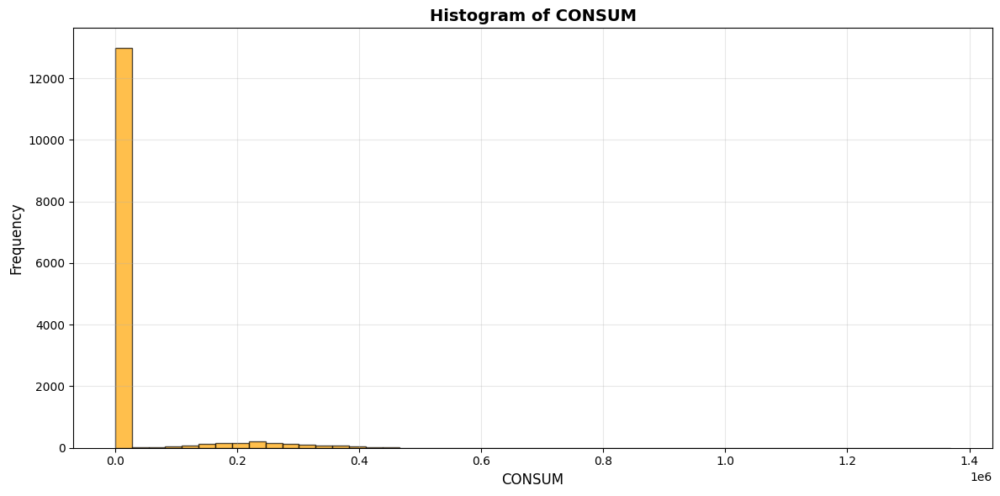

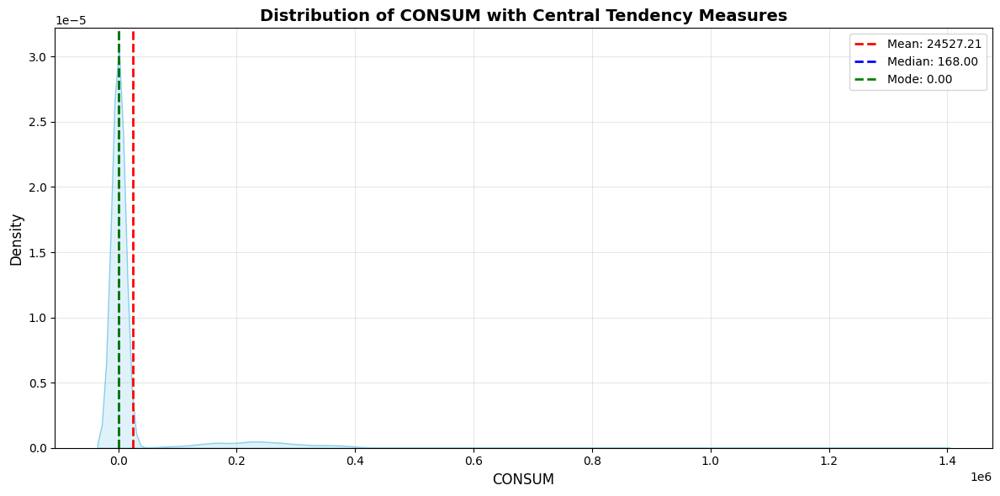

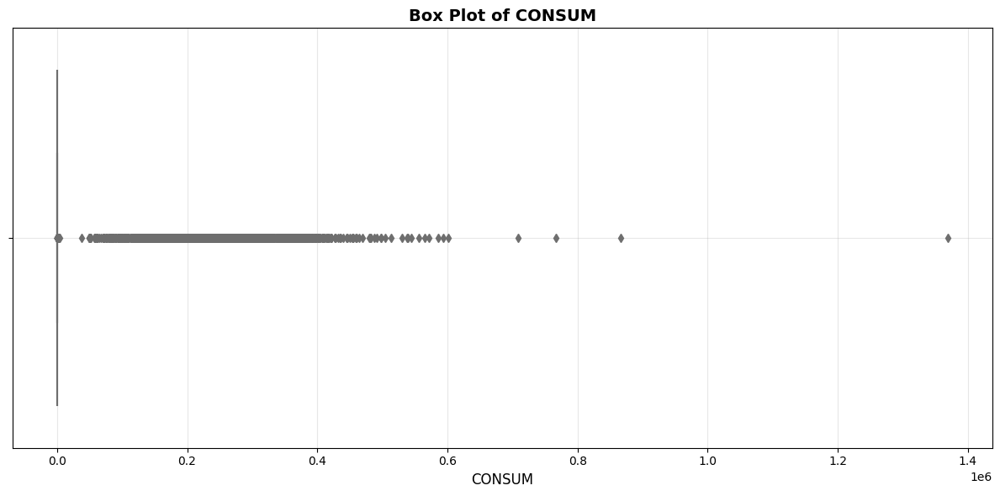

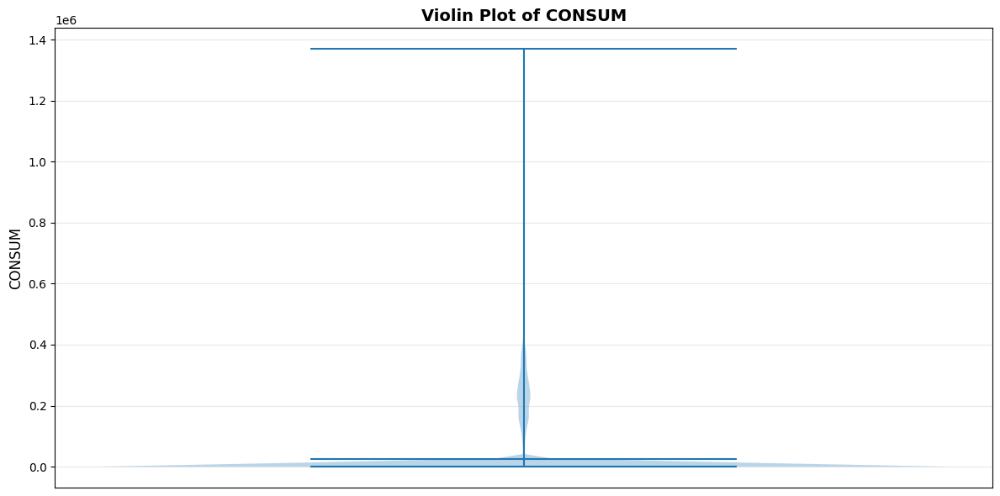


CATEGORICAL VARIABLES ANALYSIS

Categorical Columns: ['POLISSA_SUBM', 'DATA']

ANALYZING: POLISSA_SUBM

Unique Values: 10

Value Counts:
        Category  Count  Percentage
4XFL2NAR75V6CQIG   1454       10.07
6IK7MA7VMNEXSX4X   1454       10.07
UV5ZDXQTMOFLY3VR   1454       10.07
CWRMU5F7BP6LRJEQ   1454       10.07
5E3Z2LEFUIJAPAFY   1454       10.07
ESMNMUDLAMOYLGGR   1453       10.06
MUHJGPBALQP6MN6V   1453       10.06
6C3M54YW4J6HKY26   1453       10.06
QIP3NNLIZ6SRLGEO   1413        9.79
LNWMIE6QC7VVW5LO   1397        9.68


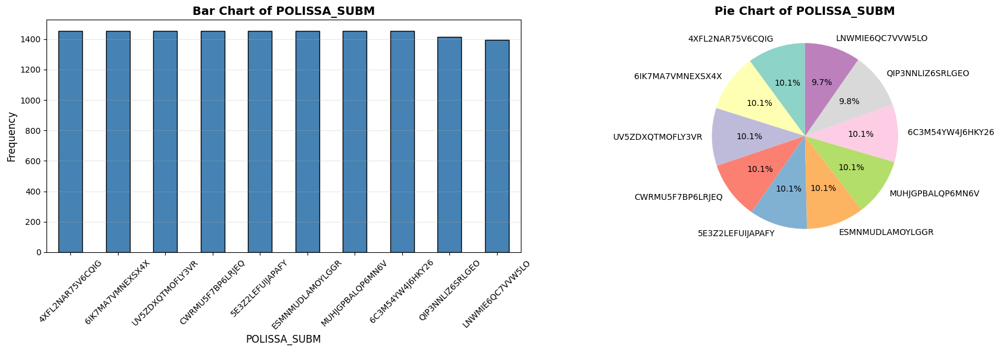


ANALYZING: DATA

Unique Values: 1456

Value Counts:
  Category  Count  Percentage
2021-01-01     10        0.07
2023-06-10     10        0.07
2023-08-13     10        0.07
2023-08-12     10        0.07
2023-08-11     10        0.07
2023-08-10     10        0.07
2023-08-09     10        0.07
2023-08-08     10        0.07
2023-08-07     10        0.07
2023-08-06     10        0.07
2023-08-05     10        0.07
2023-08-04     10        0.07
2023-08-03     10        0.07
2023-08-02     10        0.07
2023-08-01     10        0.07
2023-07-31     10        0.07
2023-07-30     10        0.07
2023-07-29     10        0.07
2023-07-28     10        0.07
2023-07-27     10        0.07
2023-07-26     10        0.07
2023-08-14     10        0.07
2023-08-15     10        0.07
2023-08-16     10        0.07
2023-08-27     10        0.07
2023-09-04     10        0.07
2023-09-03     10        0.07
2023-09-02     10        0.07
2023-09-01     10        0.07
2023-08-31     10        0.07
2023-08-30     10

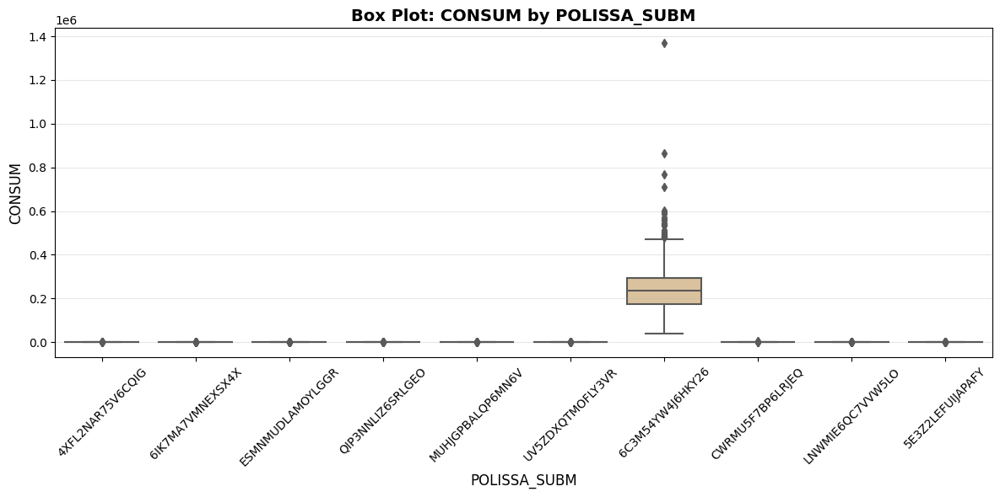


Group Statistics:
                  count        mean    median        std      min        max
POLISSA_SUBM                                                                
4XFL2NAR75V6CQIG   1454     187.246     182.0     90.274      0.0     1070.0
5E3Z2LEFUIJAPAFY   1454     148.790     140.0     93.445      0.0      848.0
6C3M54YW4J6HKY26   1453  242223.765  234440.0  97765.936  37190.0  1369300.0
6IK7MA7VMNEXSX4X   1454     197.426     184.0     73.123     21.0     1215.0
CWRMU5F7BP6LRJEQ   1454     292.479     297.0    211.299      0.0     4092.0
ESMNMUDLAMOYLGGR   1453      26.854      25.0     58.612      0.0     1365.0
LNWMIE6QC7VVW5LO   1397      40.676      15.0     54.334      0.0      561.0
MUHJGPBALQP6MN6V   1453     337.759     322.0    161.452      0.0     1756.0
QIP3NNLIZ6SRLGEO   1413      87.200      58.0    106.347      0.0     1241.0
UV5ZDXQTMOFLY3VR   1454     197.048     176.0     92.934      0.0     1074.0

ANALYSIS COMPLETE


EXAMPLE 2: Analysis with 95th Percen

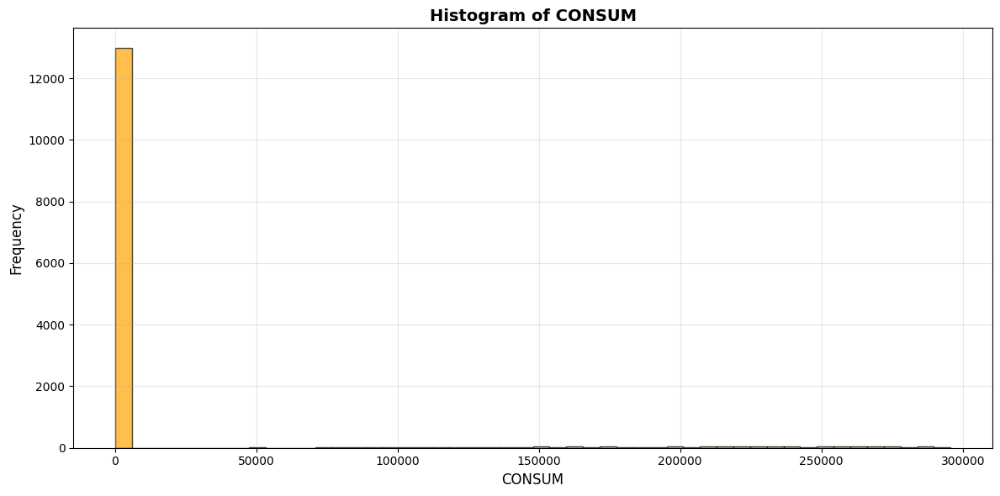

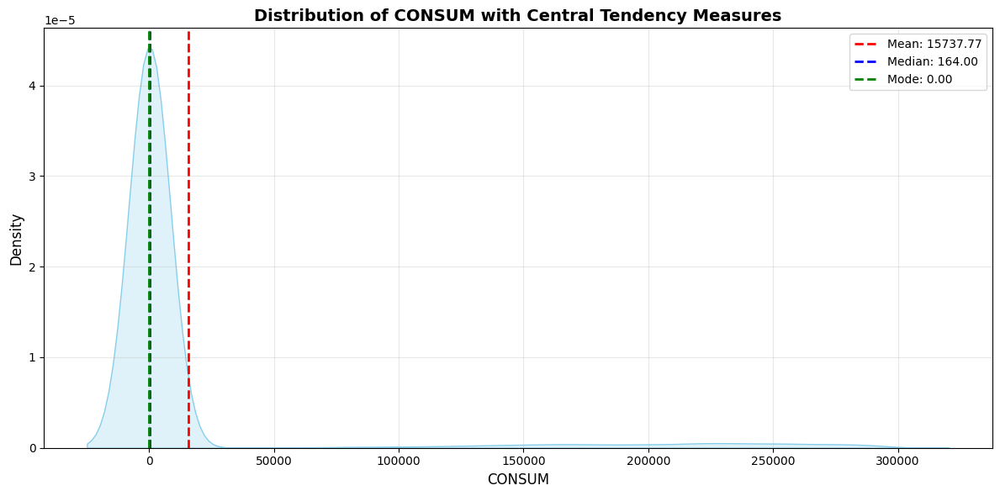

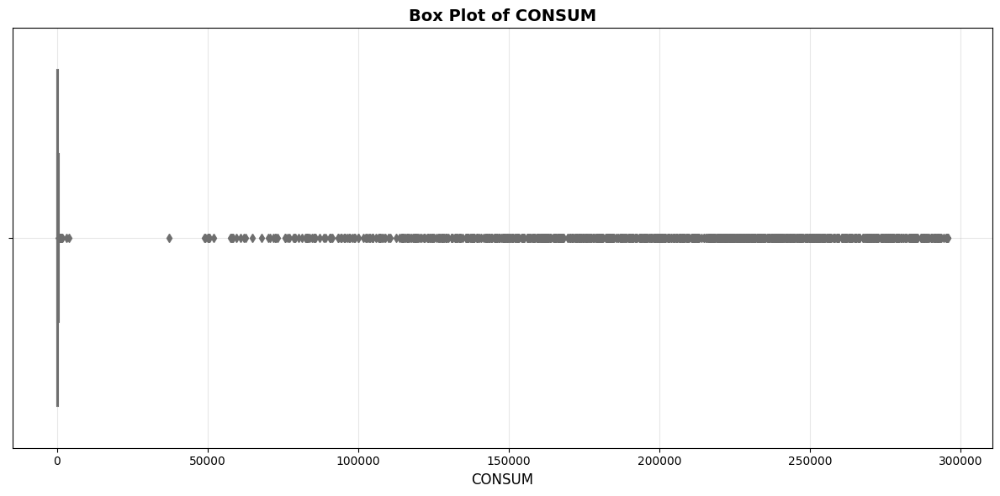

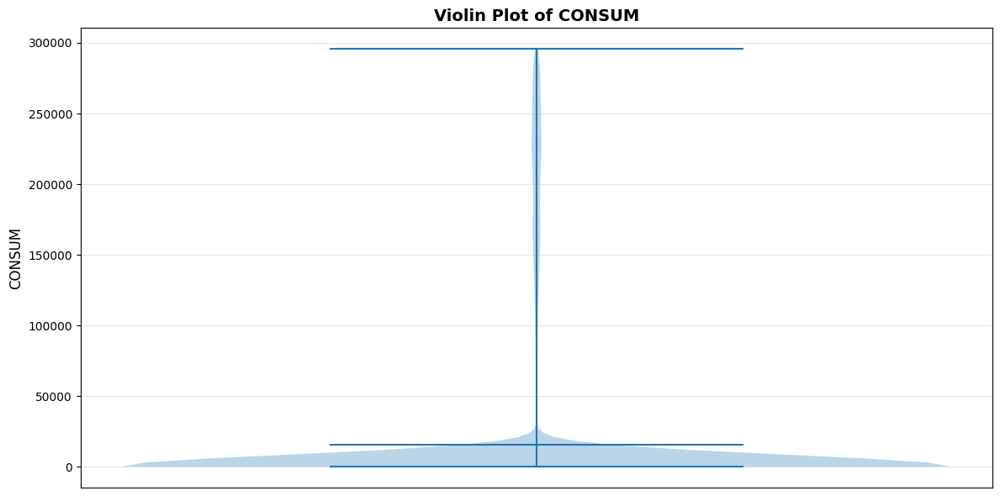


CATEGORICAL VARIABLES ANALYSIS

Categorical Columns: ['POLISSA_SUBM', 'DATA']

ANALYZING: POLISSA_SUBM

Unique Values: 10

Value Counts:
        Category  Count  Percentage
4XFL2NAR75V6CQIG   1454       10.33
6IK7MA7VMNEXSX4X   1454       10.33
UV5ZDXQTMOFLY3VR   1454       10.33
CWRMU5F7BP6LRJEQ   1454       10.33
5E3Z2LEFUIJAPAFY   1454       10.33
ESMNMUDLAMOYLGGR   1453       10.32
MUHJGPBALQP6MN6V   1453       10.32
QIP3NNLIZ6SRLGEO   1413       10.04
LNWMIE6QC7VVW5LO   1397        9.92
6C3M54YW4J6HKY26   1092        7.76


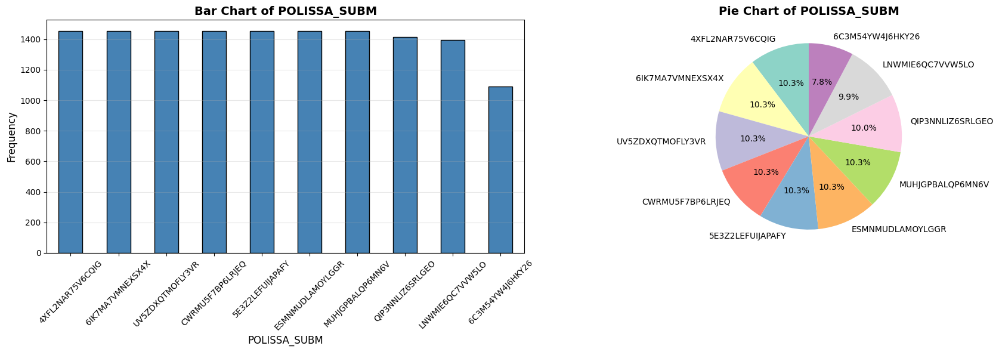


ANALYZING: DATA

Unique Values: 1456

Value Counts:
  Category  Count  Percentage
2021-01-01     10        0.07
2023-03-09     10        0.07
2023-03-15     10        0.07
2023-03-14     10        0.07
2023-03-13     10        0.07
2023-03-12     10        0.07
2023-03-11     10        0.07
2023-03-10     10        0.07
2023-03-08     10        0.07
2023-03-17     10        0.07
2023-03-07     10        0.07
2023-03-06     10        0.07
2023-03-05     10        0.07
2023-03-04     10        0.07
2023-03-03     10        0.07
2023-03-02     10        0.07
2023-03-16     10        0.07
2023-03-20     10        0.07
2023-04-06     10        0.07
2023-03-29     10        0.07
2023-04-04     10        0.07
2023-04-03     10        0.07
2023-04-02     10        0.07
2023-04-01     10        0.07
2023-03-31     10        0.07
2023-03-30     10        0.07
2023-03-28     10        0.07
2023-03-21     10        0.07
2023-03-27     10        0.07
2023-03-26     10        0.07
2023-03-25     10

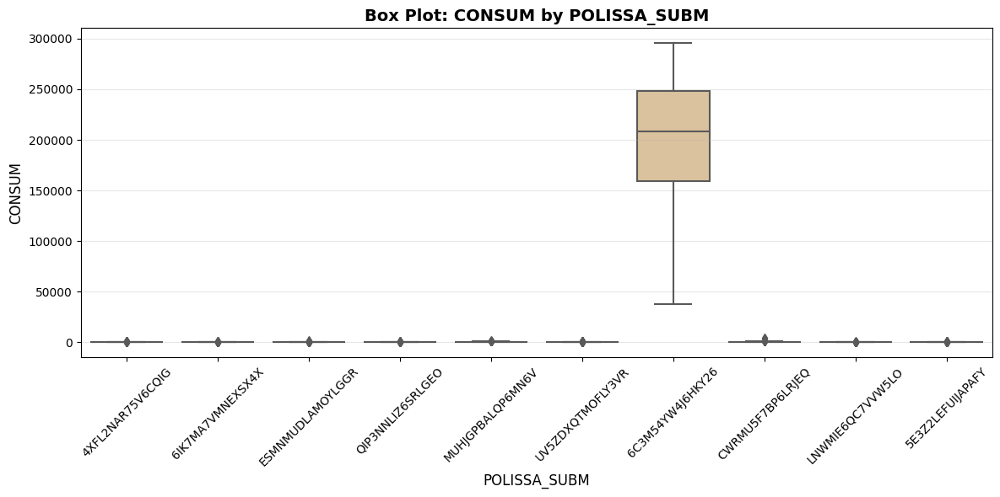


Group Statistics:
                  count        mean    median        std      min       max
POLISSA_SUBM                                                               
4XFL2NAR75V6CQIG   1454     187.246     182.0     90.274      0.0    1070.0
5E3Z2LEFUIJAPAFY   1454     148.790     140.0     93.445      0.0     848.0
6C3M54YW4J6HKY26   1092  200878.288  208580.0  58391.161  37190.0  295720.0
6IK7MA7VMNEXSX4X   1454     197.426     184.0     73.123     21.0    1215.0
CWRMU5F7BP6LRJEQ   1454     292.479     297.0    211.299      0.0    4092.0
ESMNMUDLAMOYLGGR   1453      26.854      25.0     58.612      0.0    1365.0
LNWMIE6QC7VVW5LO   1397      40.676      15.0     54.334      0.0     561.0
MUHJGPBALQP6MN6V   1453     337.759     322.0    161.452      0.0    1756.0
QIP3NNLIZ6SRLGEO   1413      87.200      58.0    106.347      0.0    1241.0
UV5ZDXQTMOFLY3VR   1454     197.048     176.0     92.934      0.0    1074.0

ANALYSIS COMPLETE


EXAMPLE 3: Analysis with Column Dropping
COMPREH

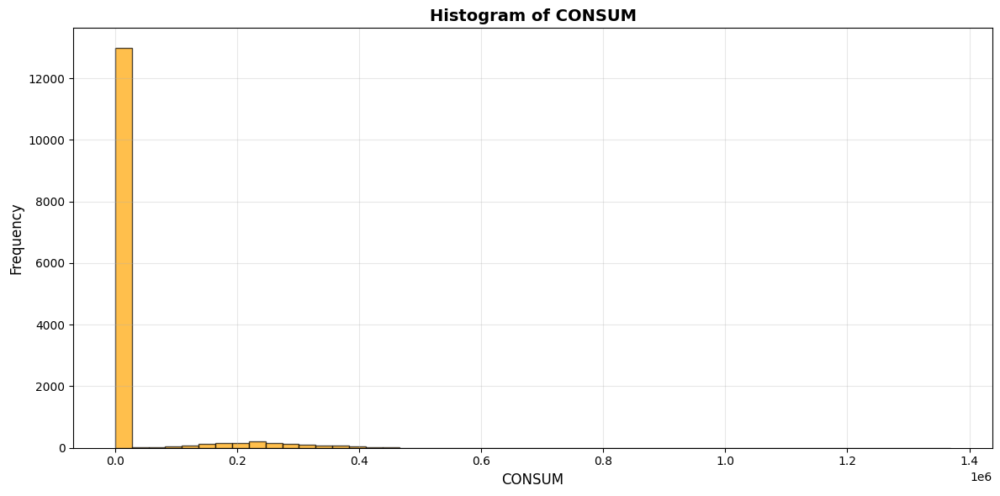

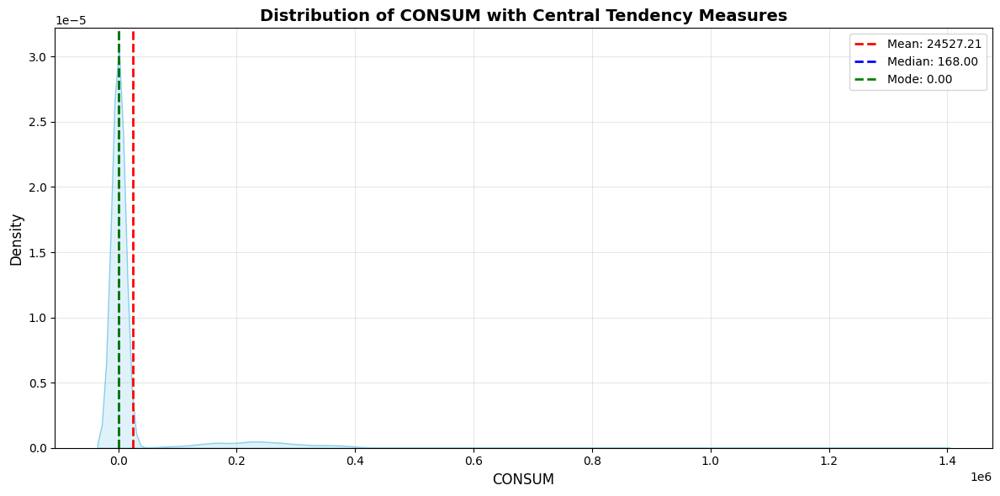

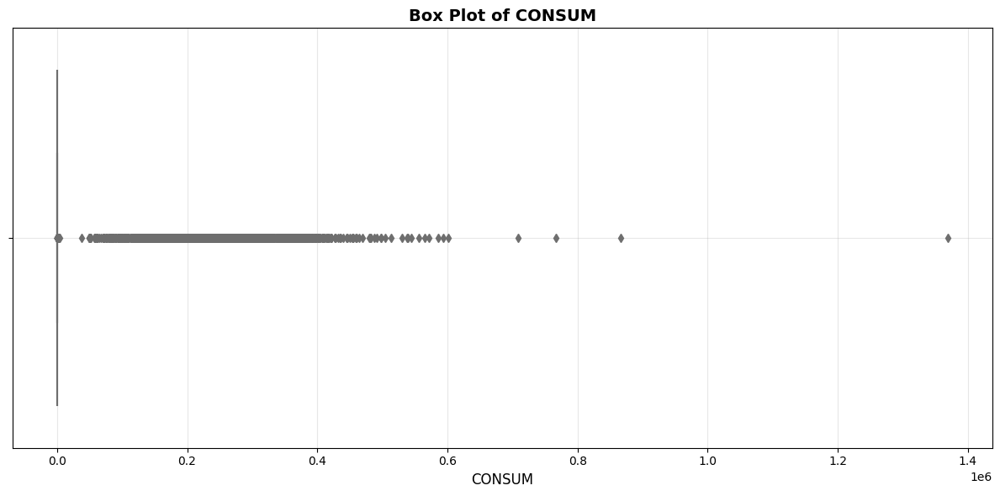

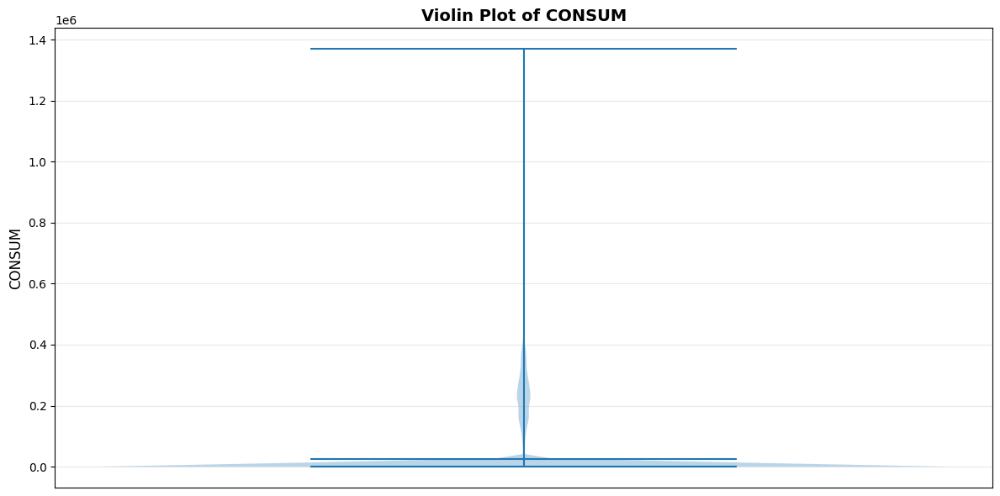


CATEGORICAL VARIABLES ANALYSIS

Categorical Columns: ['POLISSA_SUBM', 'DATA']

ANALYZING: POLISSA_SUBM

Unique Values: 10

Value Counts:
        Category  Count  Percentage
4XFL2NAR75V6CQIG   1454       10.07
6IK7MA7VMNEXSX4X   1454       10.07
UV5ZDXQTMOFLY3VR   1454       10.07
CWRMU5F7BP6LRJEQ   1454       10.07
5E3Z2LEFUIJAPAFY   1454       10.07
ESMNMUDLAMOYLGGR   1453       10.06
MUHJGPBALQP6MN6V   1453       10.06
6C3M54YW4J6HKY26   1453       10.06
QIP3NNLIZ6SRLGEO   1413        9.79
LNWMIE6QC7VVW5LO   1397        9.68


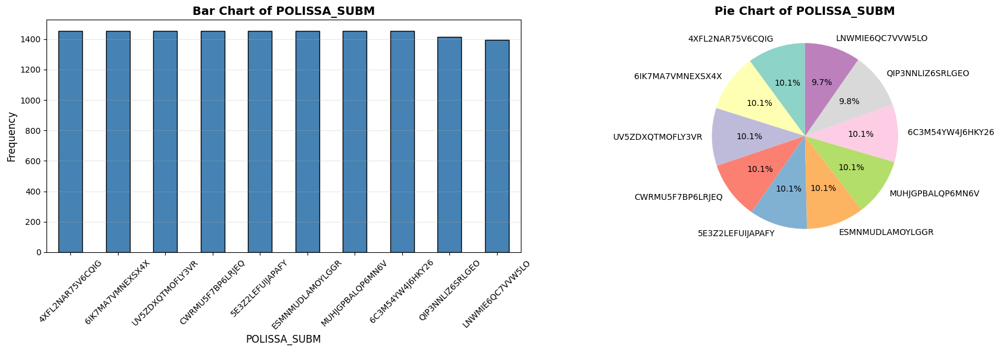


ANALYZING: DATA

Unique Values: 1456

Value Counts:
  Category  Count  Percentage
2021-01-01     10        0.07
2023-06-10     10        0.07
2023-08-13     10        0.07
2023-08-12     10        0.07
2023-08-11     10        0.07
2023-08-10     10        0.07
2023-08-09     10        0.07
2023-08-08     10        0.07
2023-08-07     10        0.07
2023-08-06     10        0.07
2023-08-05     10        0.07
2023-08-04     10        0.07
2023-08-03     10        0.07
2023-08-02     10        0.07
2023-08-01     10        0.07
2023-07-31     10        0.07
2023-07-30     10        0.07
2023-07-29     10        0.07
2023-07-28     10        0.07
2023-07-27     10        0.07
2023-07-26     10        0.07
2023-08-14     10        0.07
2023-08-15     10        0.07
2023-08-16     10        0.07
2023-08-27     10        0.07
2023-09-04     10        0.07
2023-09-03     10        0.07
2023-09-02     10        0.07
2023-09-01     10        0.07
2023-08-31     10        0.07
2023-08-30     10

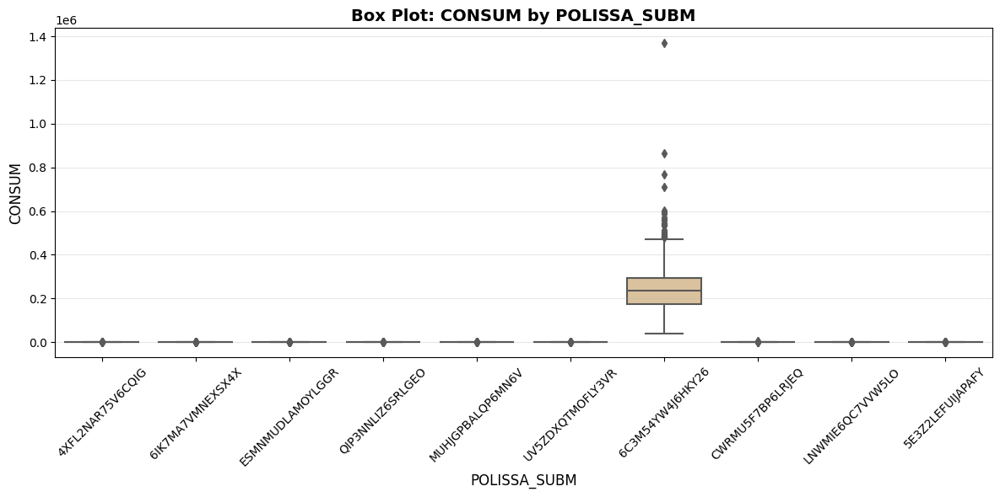


Group Statistics:
                  count        mean    median        std      min        max
POLISSA_SUBM                                                                
4XFL2NAR75V6CQIG   1454     187.246     182.0     90.274      0.0     1070.0
5E3Z2LEFUIJAPAFY   1454     148.790     140.0     93.445      0.0      848.0
6C3M54YW4J6HKY26   1453  242223.765  234440.0  97765.936  37190.0  1369300.0
6IK7MA7VMNEXSX4X   1454     197.426     184.0     73.123     21.0     1215.0
CWRMU5F7BP6LRJEQ   1454     292.479     297.0    211.299      0.0     4092.0
ESMNMUDLAMOYLGGR   1453      26.854      25.0     58.612      0.0     1365.0
LNWMIE6QC7VVW5LO   1397      40.676      15.0     54.334      0.0      561.0
MUHJGPBALQP6MN6V   1453     337.759     322.0    161.452      0.0     1756.0
QIP3NNLIZ6SRLGEO   1413      87.200      58.0    106.347      0.0     1241.0
UV5ZDXQTMOFLY3VR   1454     197.048     176.0     92.934      0.0     1074.0

ANALYSIS COMPLETE


EXAMPLE 4: Combined Percentile Filte

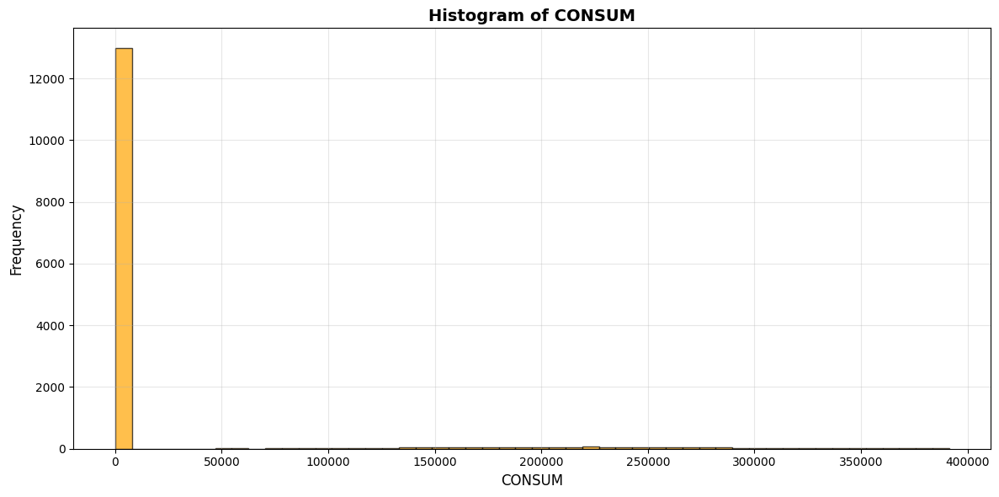

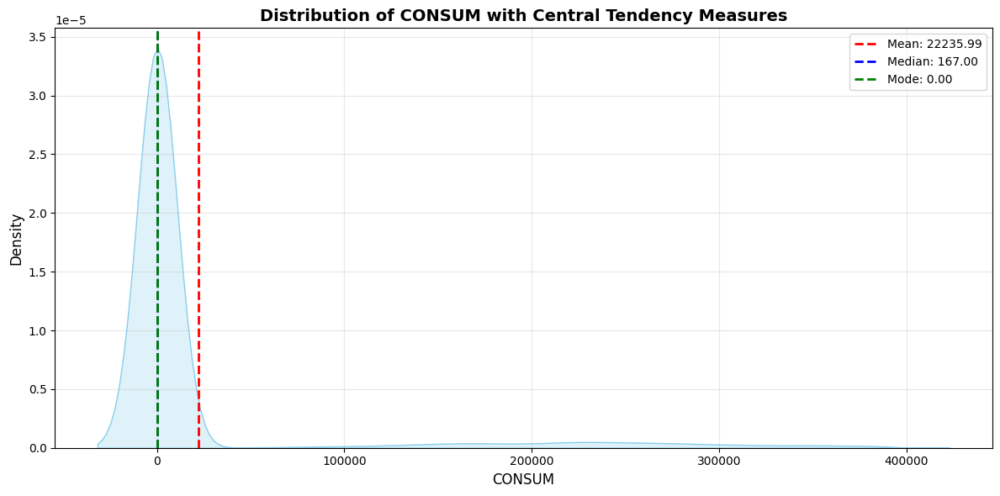

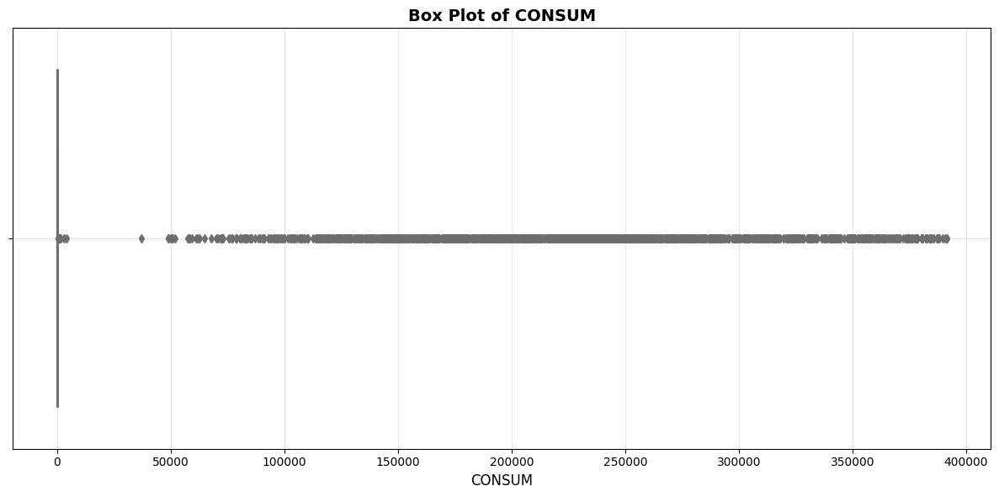

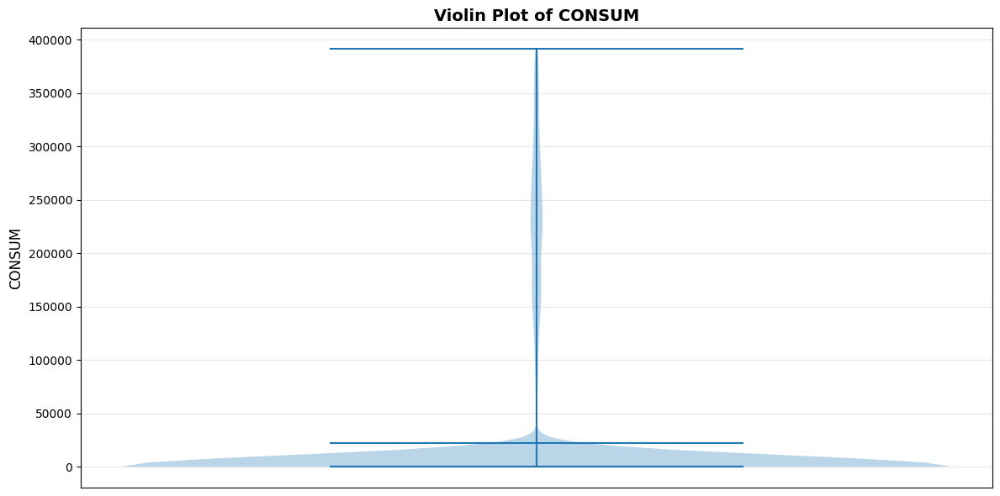


CATEGORICAL VARIABLES ANALYSIS

Categorical Columns: ['POLISSA_SUBM', 'DATA']

ANALYZING: POLISSA_SUBM

Unique Values: 10

Value Counts:
        Category  Count  Percentage
4XFL2NAR75V6CQIG   1454       10.12
6IK7MA7VMNEXSX4X   1454       10.12
UV5ZDXQTMOFLY3VR   1454       10.12
CWRMU5F7BP6LRJEQ   1454       10.12
5E3Z2LEFUIJAPAFY   1454       10.12
ESMNMUDLAMOYLGGR   1453       10.11
MUHJGPBALQP6MN6V   1453       10.11
QIP3NNLIZ6SRLGEO   1413        9.84
LNWMIE6QC7VVW5LO   1397        9.72
6C3M54YW4J6HKY26   1380        9.61


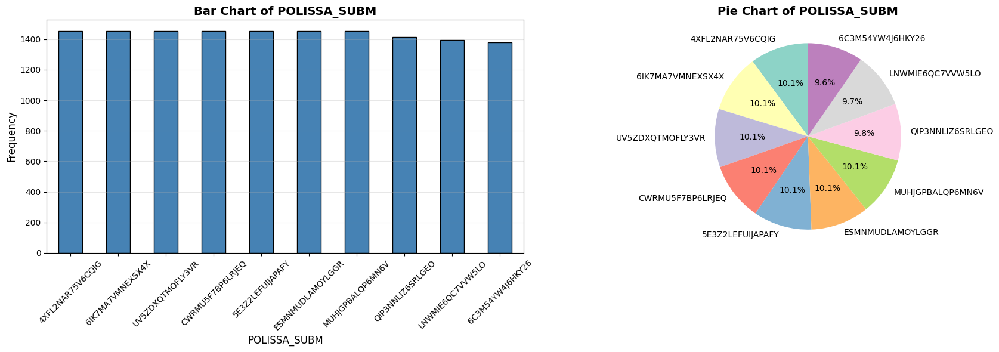


ANALYZING: DATA

Unique Values: 1456

Value Counts:
  Category  Count  Percentage
2021-01-01     10        0.07
2023-07-06     10        0.07
2023-07-14     10        0.07
2023-07-13     10        0.07
2023-07-12     10        0.07
2023-07-11     10        0.07
2023-07-10     10        0.07
2023-07-09     10        0.07
2023-07-08     10        0.07
2023-07-07     10        0.07
2023-07-05     10        0.07
2023-06-24     10        0.07
2023-07-04     10        0.07
2023-07-03     10        0.07
2023-07-01     10        0.07
2023-06-30     10        0.07
2023-06-29     10        0.07
2023-06-28     10        0.07
2023-06-27     10        0.07
2023-06-26     10        0.07
2023-07-15     10        0.07
2023-07-16     10        0.07
2023-07-17     10        0.07
2023-07-18     10        0.07
2023-08-31     10        0.07
2023-08-30     10        0.07
2023-08-29     10        0.07
2023-08-28     10        0.07
2023-08-27     10        0.07
2023-08-26     10        0.07
2023-08-23     10

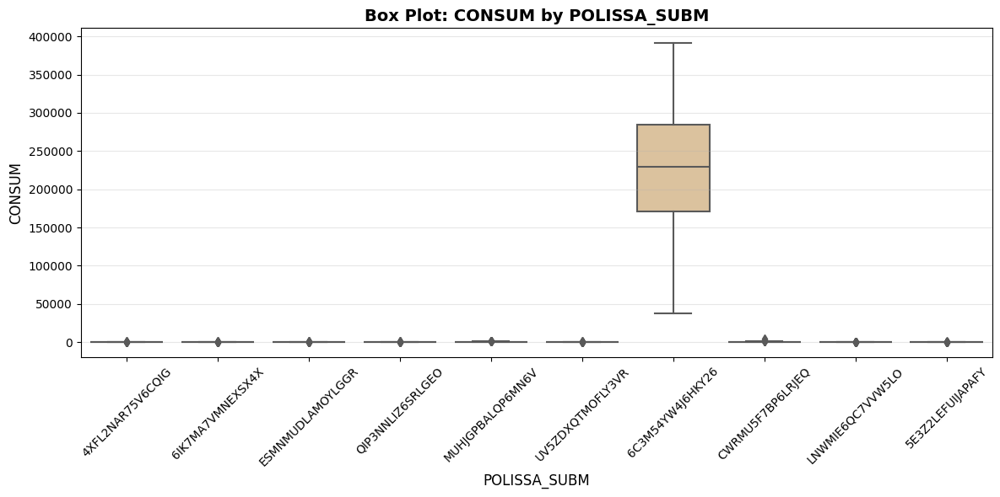


Group Statistics:
                  count        mean    median        std      min       max
POLISSA_SUBM                                                               
4XFL2NAR75V6CQIG   1454     187.246     182.0     90.274      0.0    1070.0
5E3Z2LEFUIJAPAFY   1454     148.790     140.0     93.445      0.0     848.0
6C3M54YW4J6HKY26   1380  229887.652  229135.0  77753.301  37190.0  391410.0
6IK7MA7VMNEXSX4X   1454     197.426     184.0     73.123     21.0    1215.0
CWRMU5F7BP6LRJEQ   1454     292.479     297.0    211.299      0.0    4092.0
ESMNMUDLAMOYLGGR   1453      26.854      25.0     58.612      0.0    1365.0
LNWMIE6QC7VVW5LO   1397      40.676      15.0     54.334      0.0     561.0
MUHJGPBALQP6MN6V   1453     337.759     322.0    161.452      0.0    1756.0
QIP3NNLIZ6SRLGEO   1413      87.200      58.0    106.347      0.0    1241.0
UV5ZDXQTMOFLY3VR   1454     197.048     176.0     92.934      0.0    1074.0

ANALYSIS COMPLETE


Summary Statistics returned:
Shape: (14366, 3)
N

In [22]:
consum_dades = pd.read_parquet("Mostra Set de dades 4_Incidències en comptadors intel·ligents_Consum.parquet")
perimetre_dades = pd.read_parquet("Mostra Set de dades 4_Incidències en comptadors intel·ligents_Perímetre.parquet")

print("Running EDA on Consum Dataset...")

# Example 1: Basic usage (no filtering)
print("\n" + "="*80)
print("EXAMPLE 1: Basic Analysis")
print("="*80)
summary = comprehensive_eda(consum_dades)

# Example 2: With percentile filtering
print("\n\n" + "="*80)
print("EXAMPLE 2: Analysis with 95th Percentile Filtering")
print("="*80)
summary = comprehensive_eda(consum_dades, percentile=95)

# Example 3: Dropping columns
print("\n\n" + "="*80)
print("EXAMPLE 3: Analysis with Column Dropping")
print("="*80)
summary = comprehensive_eda(consum_dades, columns_to_drop=[])

# Example 4: Combined filtering and dropping
print("\n\n" + "="*80)
print("EXAMPLE 4: Combined Percentile Filtering and Column Dropping")
print("="*80)
summary = comprehensive_eda(consum_dades, percentile=99, columns_to_drop=[])

print("\n\nSummary Statistics returned:")
print(f"Shape: {summary['shape']}")
print(f"Numerical columns: {summary['numerical_columns']}")
print(f"Categorical columns: {summary['categorical_columns']}")

EXAMPLE 1: Basic Time Series Analysis
TIME SERIES ANALYSIS

FILTERING SUMMARY
Original rows: 731
Final rows: 731
Total removed: 0 (0.00%)

ANALYZING: sales

--------------------------------------------------------------------------------
BASIC STATISTICS
--------------------------------------------------------------------------------
Count          : 731.0000
Mean           : 124.9313
Median         : 124.9321
Std            : 14.1251
Min            : 91.9427
Max            : 157.4414
Range          : 65.4986
Cv             : 11.3063
Skewness       : -0.0191
Kurtosis       : -1.1755

Time Range: 2023-01-01 00:00:00 to 2024-12-31 00:00:00
Duration: 730 days


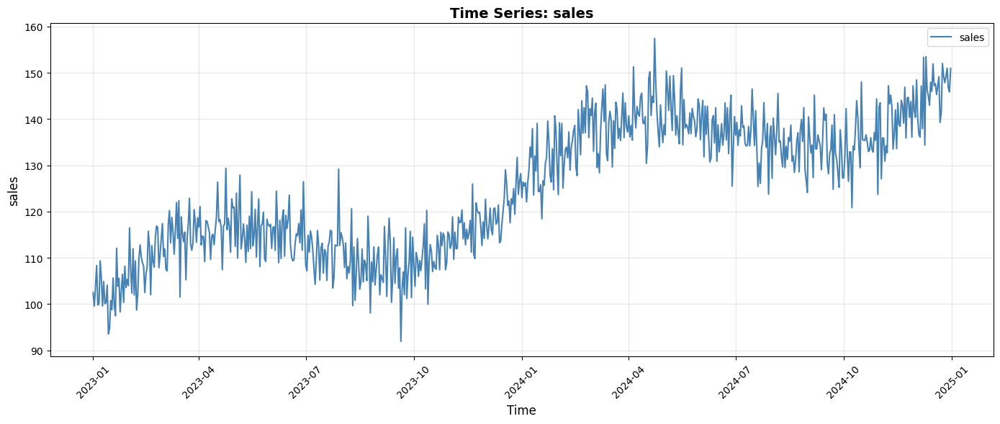


ROLLING STATISTICS (Window: 30)


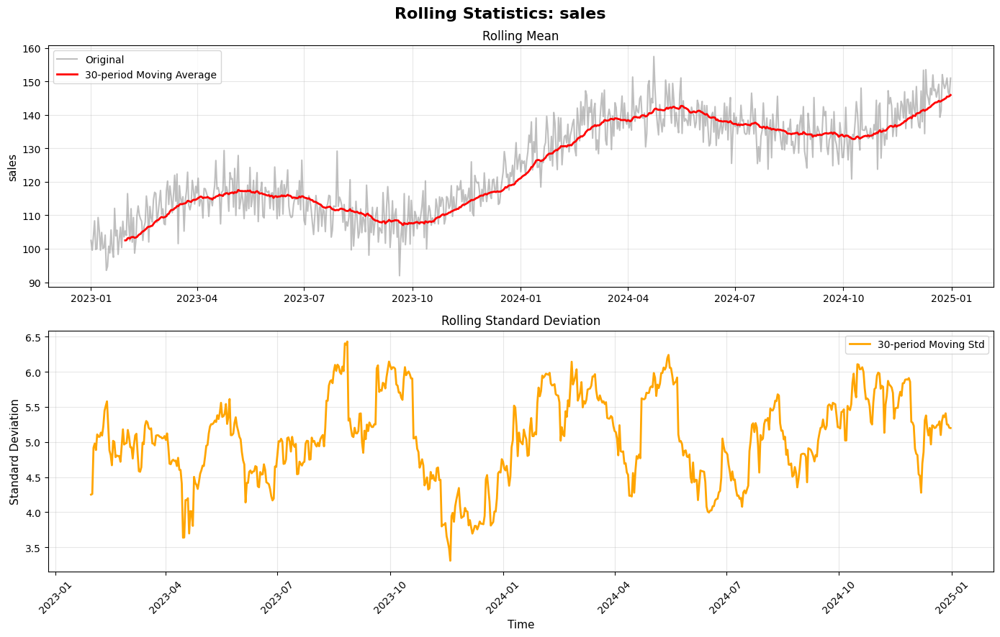

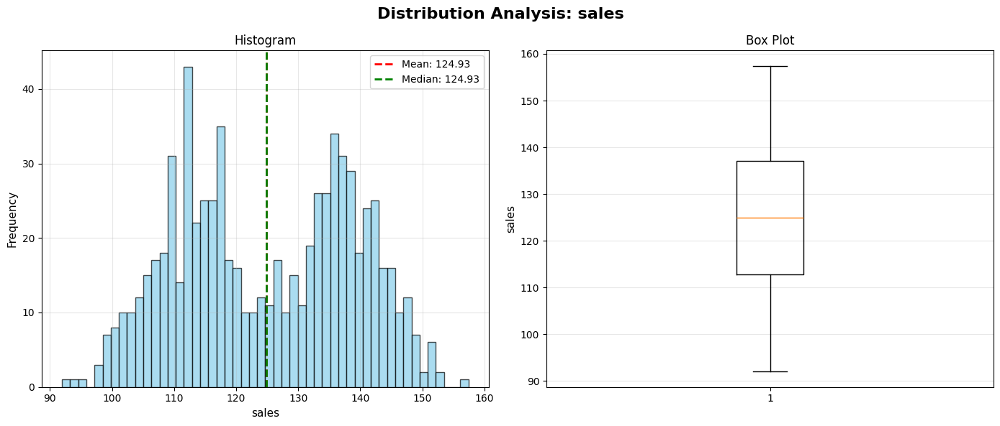


AGGREGATION BY M

Aggregated Statistics:
                  mean          sum         min         max  count
date                                                              
2023-01-31  102.543332  3178.843305   93.543225  112.073336     31
2023-02-28  109.198085  3057.546385   98.683163  116.867239     28
2023-03-31  114.737591  3556.865317  101.532116  122.879403     31
2023-04-30  116.689515  3500.685438  107.424006  129.363176     30
2023-05-31  116.036909  3597.144184  108.109158  127.873177     31
2023-06-30  115.644988  3469.349633  108.958960  126.463253     30
2023-07-31  111.640506  3460.855671  103.467119  129.173538     31
2023-08-31  108.589334  3366.269341   98.076842  120.625545     31
2023-09-30  107.676668  3230.300028   91.942732  118.563816     30
2023-10-31  110.464944  3424.413260   99.947044  120.272484     31


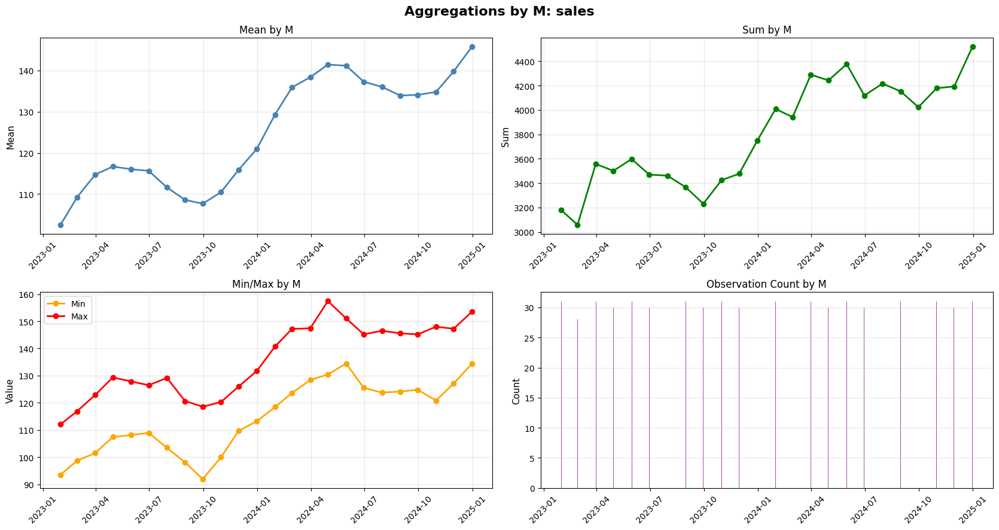


TREND ANALYSIS
Linear Trend Slope: 0.055190
R-squared: 0.6807
P-value: 0.000000
Trend Direction: Increasing


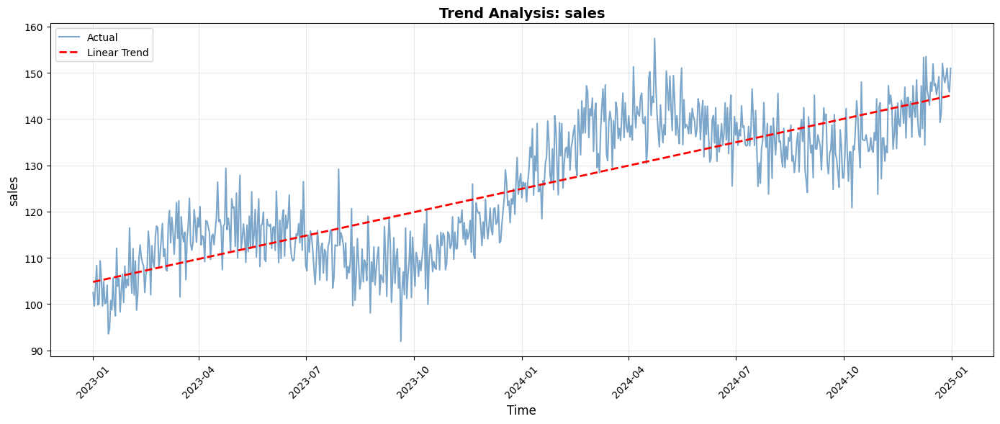


SEASONAL DECOMPOSITION (ADDITIVE)


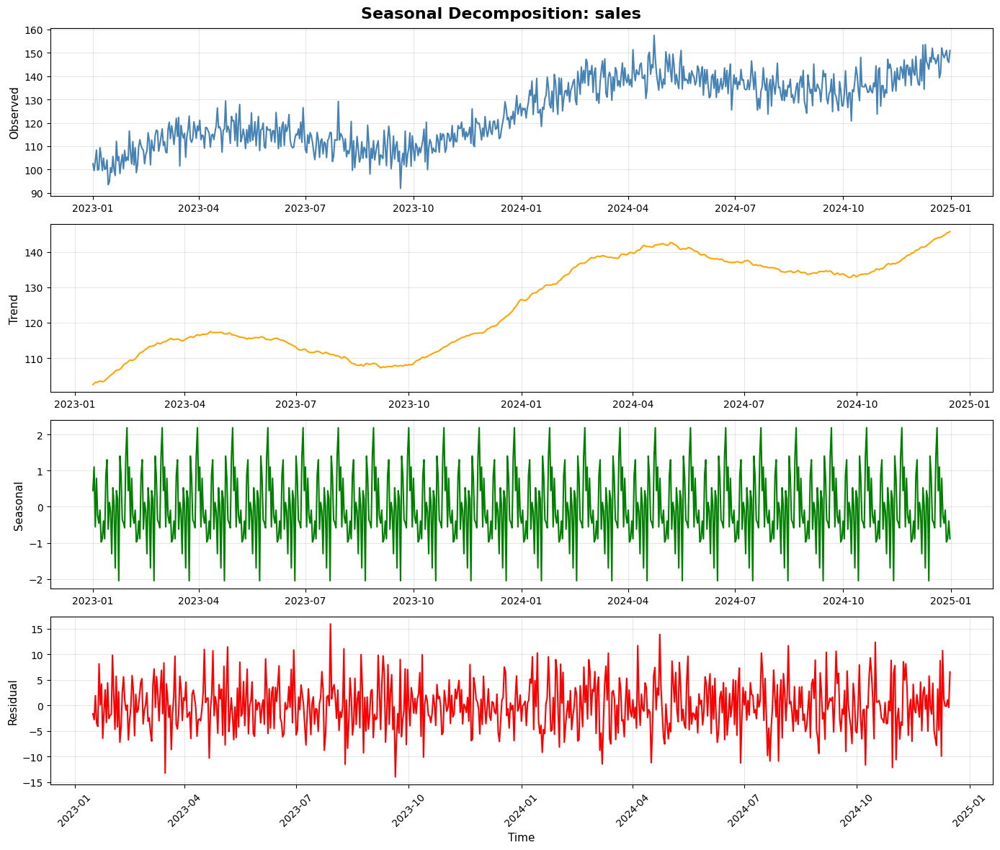

✓ Decomposition completed successfully

STATIONARITY TEST (Augmented Dickey-Fuller)
ADF Statistic: -0.680889
P-value: 0.851638
Critical Values:
  1%: -3.439490
  5%: -2.865574
  10%: -2.568918

Conclusion: Time series is NON-STATIONARY (p=> 0.05)

AUTOCORRELATION ANALYSIS


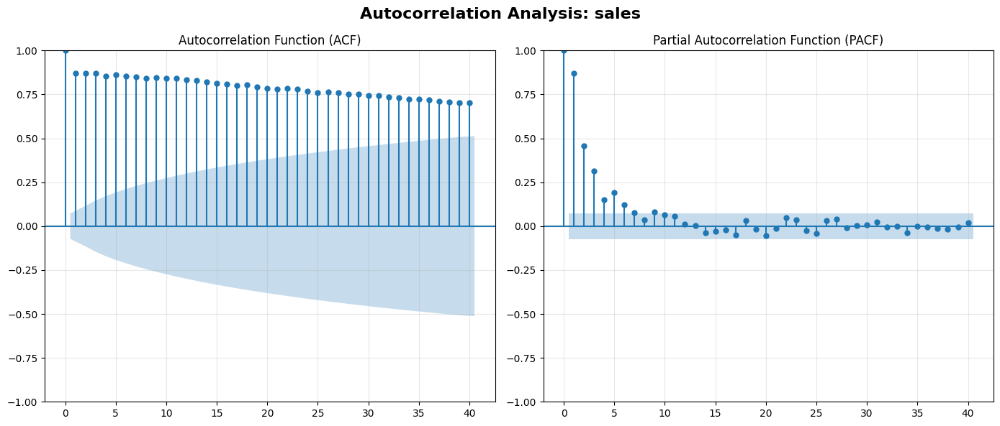

✓ Autocorrelation plots generated

CHANGE DETECTION
Average Daily Change: 0.22%
Max Increase: 17.06%
Max Decrease: -17.39%
Volatility (Std of % change): 5.73%


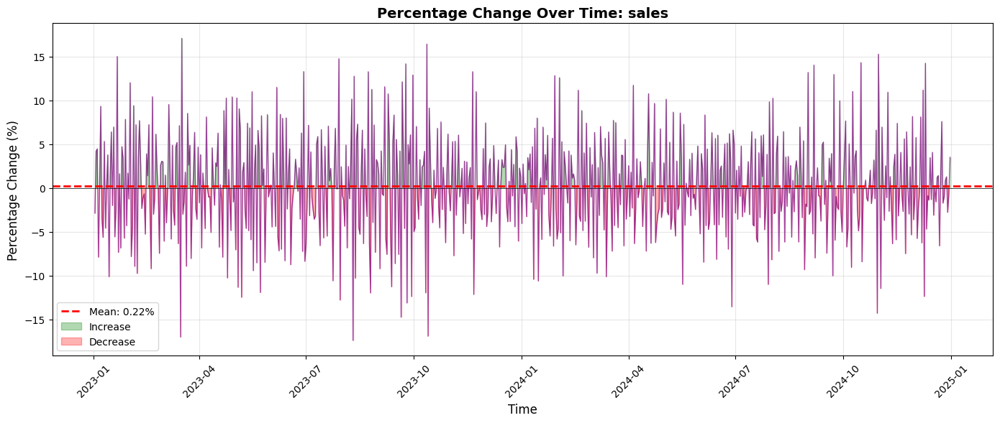


TIME SERIES ANALYSIS COMPLETE


EXAMPLE 2: Time Series with Filters
TIME SERIES ANALYSIS
APPLYING FILTERS
✓ Filter: product == A
  Rows removed: 483 (66.07%)
  Rows remaining: 248
✓ Filter: region == North
  Rows removed: 122 (49.19%)
  Rows remaining: 126

APPLYING PERCENTILE FILTERING (95th percentile)
✓ sales: [101.42, 149.19]

  Total outliers removed: 8 (6.35%)
  Rows remaining: 118

FILTERING SUMMARY
Original rows: 731
Final rows: 118
Total removed: 613 (83.86%)

ANALYZING: sales

--------------------------------------------------------------------------------
BASIC STATISTICS
--------------------------------------------------------------------------------
Count          : 118.0000
Mean           : 125.2478
Median         : 125.4748
Std            : 13.0375
Min            : 101.6430
Max            : 148.4714
Range          : 46.8284
Cv             : 10.4094
Skewness       : -0.1168
Kurtosis       : -1.2431

Time Range: 2023-01-10 00:00:00 to 2024-12-23 00:00:00
Duration: 713 day

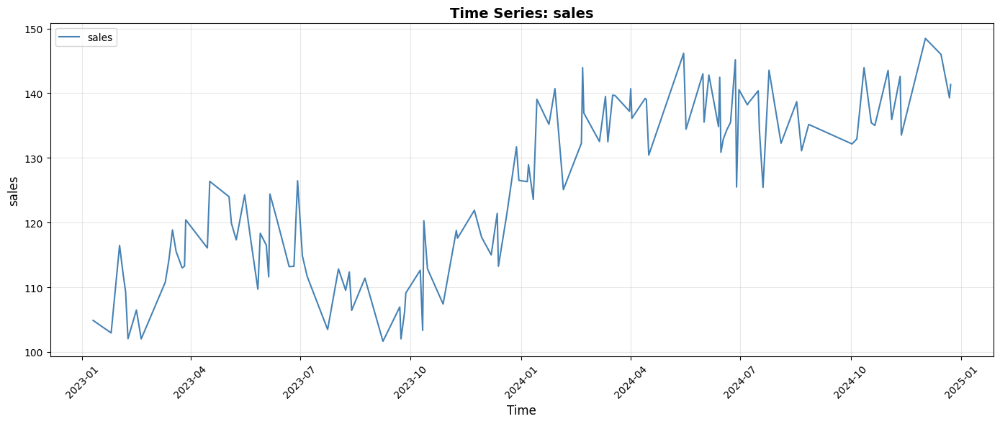


ROLLING STATISTICS (Window: 30)


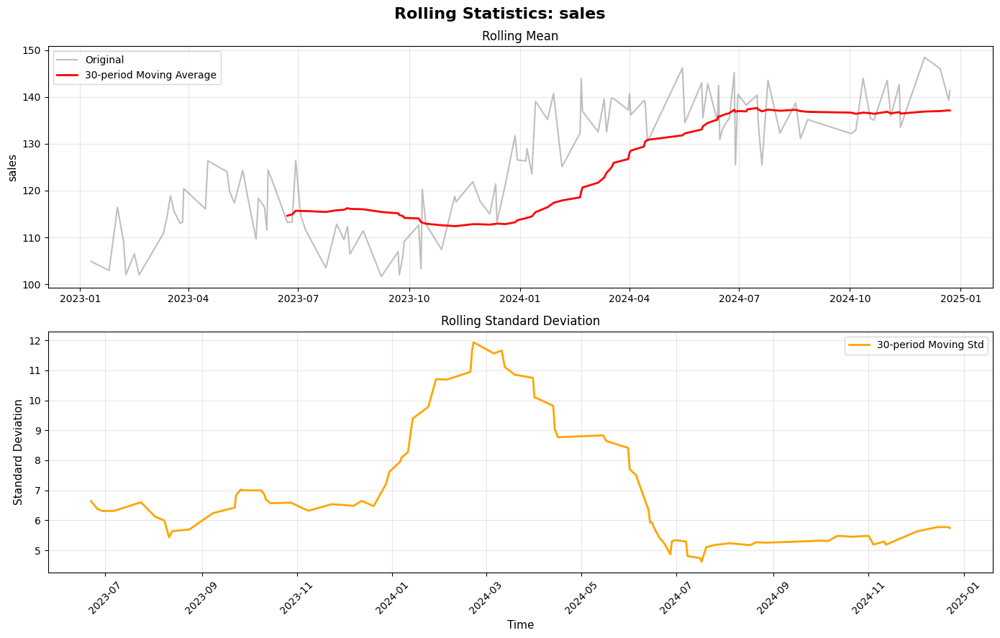

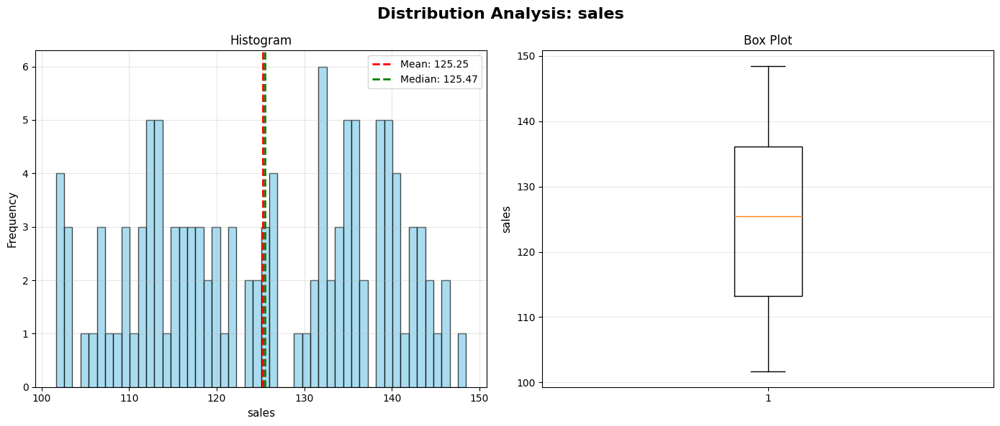


AGGREGATION BY M

Aggregated Statistics:
                  mean         sum         min         max  count
date                                                             
2023-01-31  103.904564  207.809129  102.936802  104.872327      2
2023-02-28  108.048354  648.290124  102.010684  116.471388      6
2023-03-31  115.151298  806.059085  110.775845  120.426612      7
2023-04-30  121.223773  242.447546  116.076965  126.370581      2
2023-05-31  118.706593  830.946152  109.693099  124.291823      7
2023-06-30  117.874892  942.999136  111.603748  126.463253      8
2023-07-31  109.999289  329.997867  103.467119  114.860539      3
2023-08-31  110.510896  552.554479  106.431243  112.833579      5
2023-09-30  105.188911  525.944555  101.643032  109.111771      5
2023-10-31  111.298651  556.493257  103.320990  120.272484      5


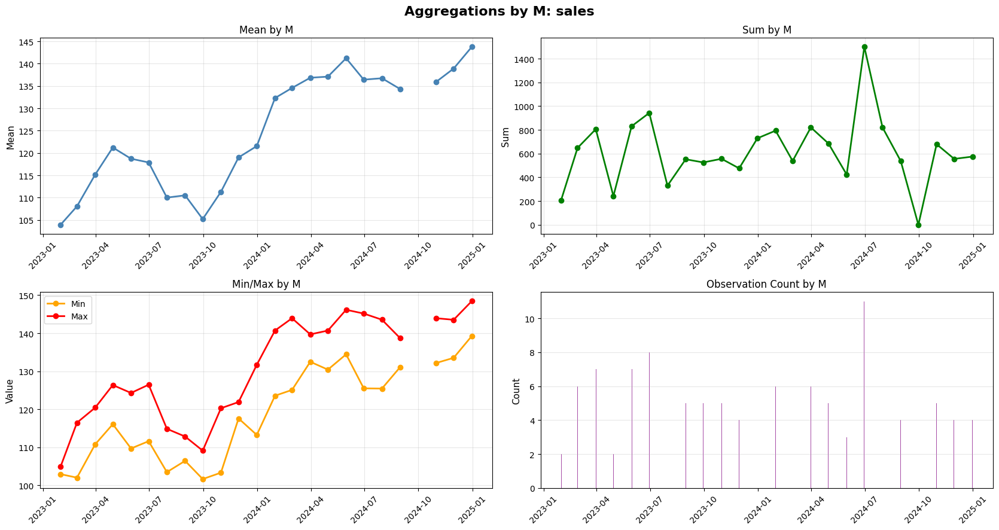


TREND ANALYSIS
Linear Trend Slope: 0.308867
R-squared: 0.6567
P-value: 0.000000
Trend Direction: Increasing


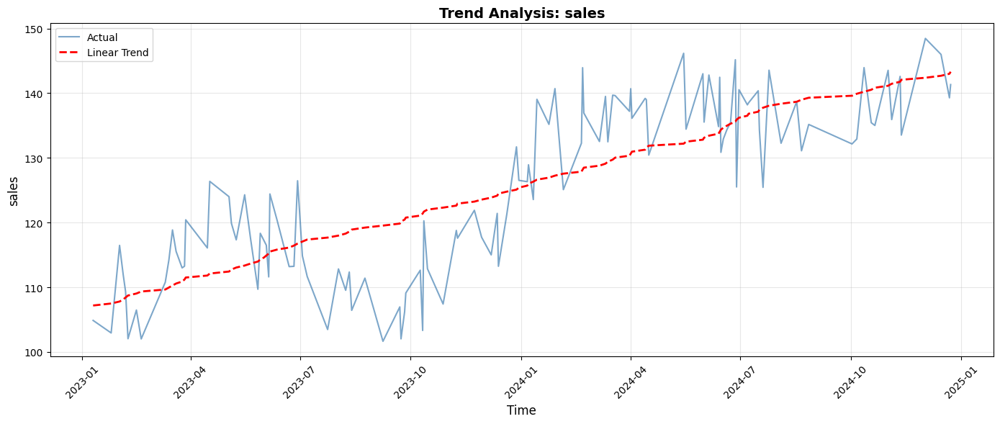


SEASONAL DECOMPOSITION (ADDITIVE)


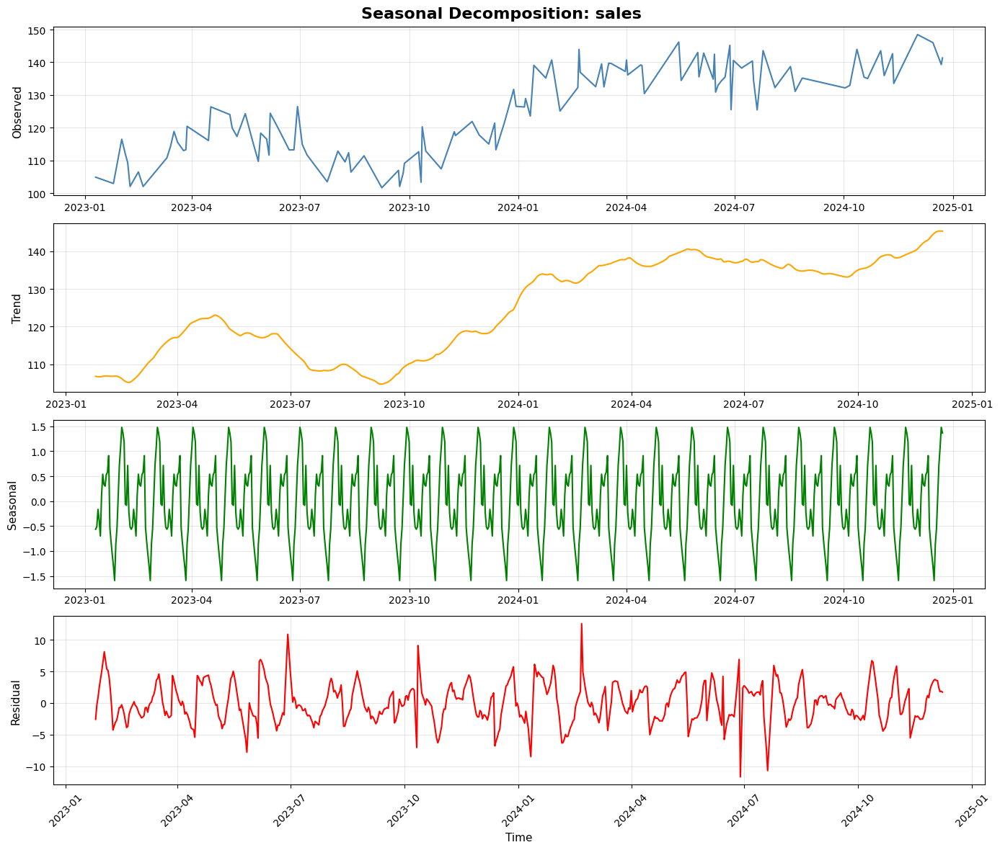

✓ Decomposition completed successfully

STATIONARITY TEST (Augmented Dickey-Fuller)
ADF Statistic: -1.370746
P-value: 0.596218
Critical Values:
  1%: -3.491818
  5%: -2.888444
  10%: -2.581120

Conclusion: Time series is NON-STATIONARY (p=> 0.05)

AUTOCORRELATION ANALYSIS


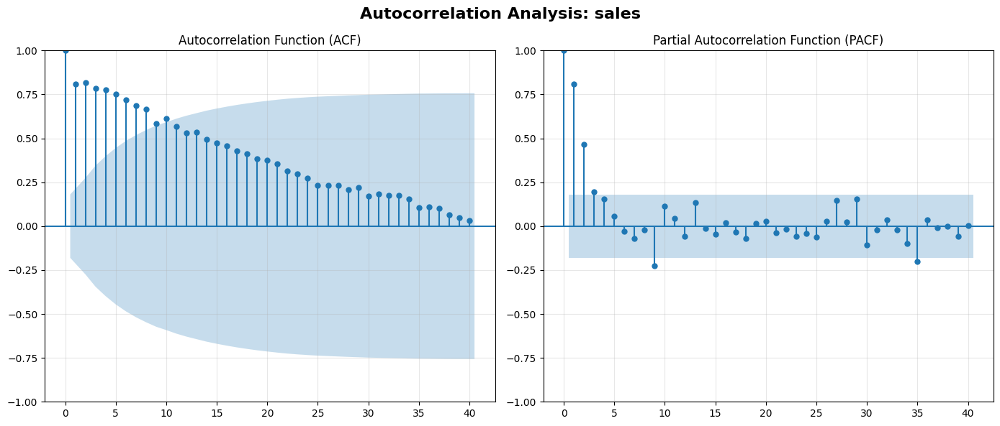

✓ Autocorrelation plots generated

CHANGE DETECTION
Average Daily Change: 0.44%
Max Increase: 16.41%
Max Decrease: -13.55%
Volatility (Std of % change): 6.20%


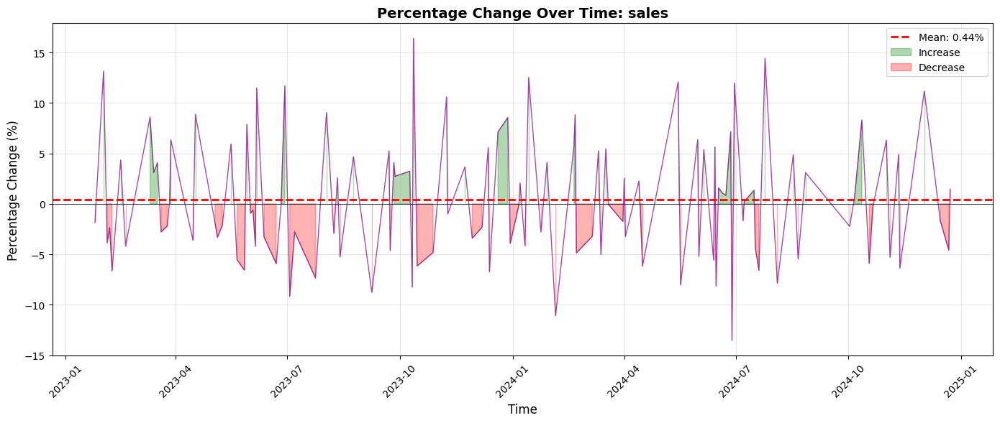


TIME SERIES ANALYSIS COMPLETE


EXAMPLE 3: Multiple Time Series
TIME SERIES ANALYSIS

FILTERING SUMMARY
Original rows: 731
Final rows: 731
Total removed: 0 (0.00%)

ANALYZING: sales

--------------------------------------------------------------------------------
BASIC STATISTICS
--------------------------------------------------------------------------------
Count          : 731.0000
Mean           : 124.9313
Median         : 124.9321
Std            : 14.1251
Min            : 91.9427
Max            : 157.4414
Range          : 65.4986
Cv             : 11.3063
Skewness       : -0.0191
Kurtosis       : -1.1755

Time Range: 2023-01-01 00:00:00 to 2024-12-31 00:00:00
Duration: 730 days


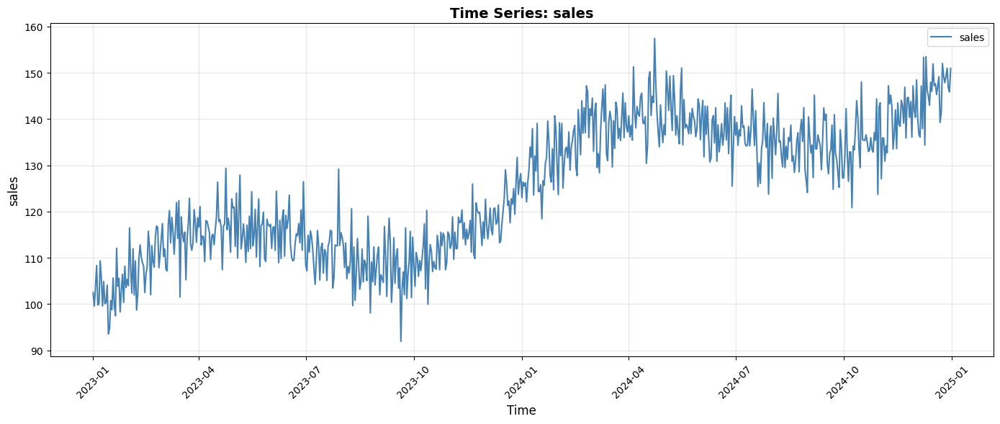


ROLLING STATISTICS (Window: 30)


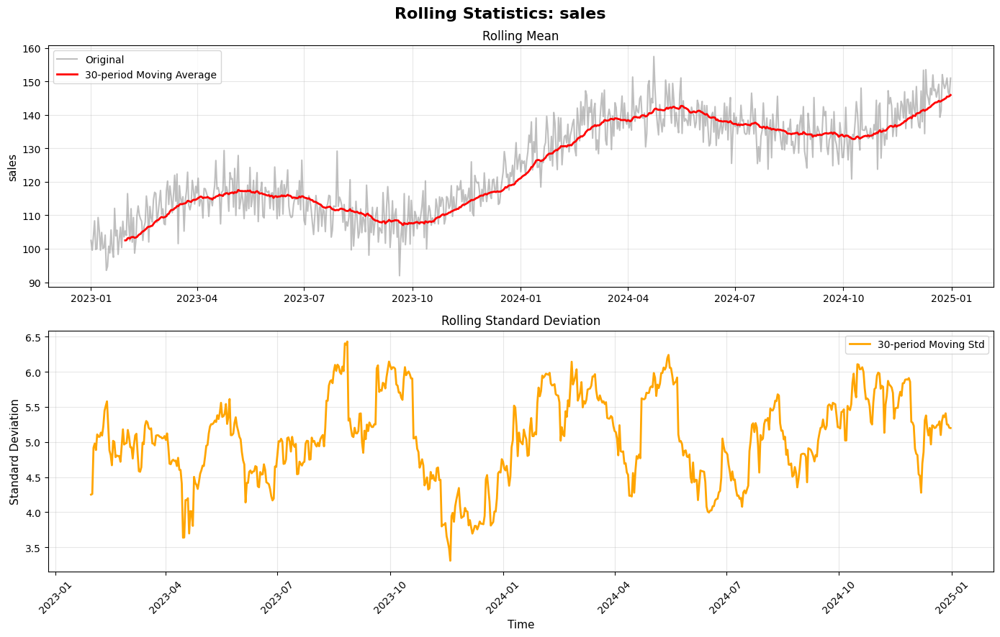

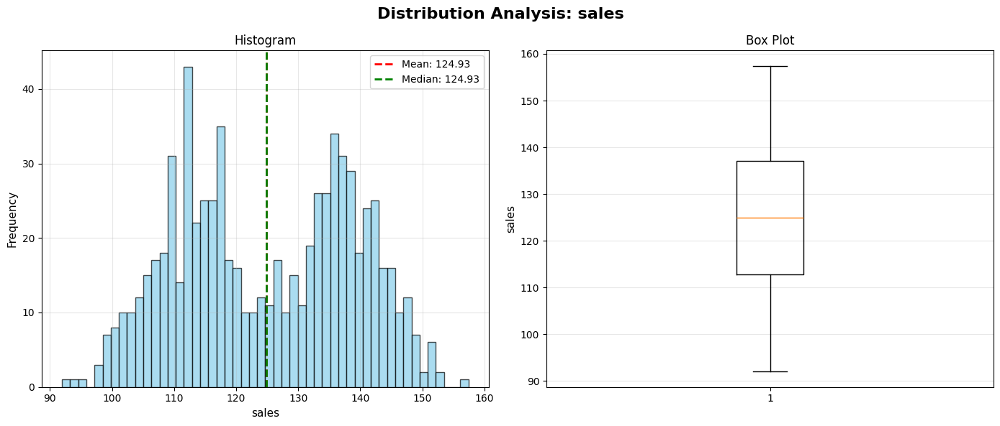


AGGREGATION BY M

Aggregated Statistics:
                  mean          sum         min         max  count
date                                                              
2023-01-31  102.543332  3178.843305   93.543225  112.073336     31
2023-02-28  109.198085  3057.546385   98.683163  116.867239     28
2023-03-31  114.737591  3556.865317  101.532116  122.879403     31
2023-04-30  116.689515  3500.685438  107.424006  129.363176     30
2023-05-31  116.036909  3597.144184  108.109158  127.873177     31
2023-06-30  115.644988  3469.349633  108.958960  126.463253     30
2023-07-31  111.640506  3460.855671  103.467119  129.173538     31
2023-08-31  108.589334  3366.269341   98.076842  120.625545     31
2023-09-30  107.676668  3230.300028   91.942732  118.563816     30
2023-10-31  110.464944  3424.413260   99.947044  120.272484     31


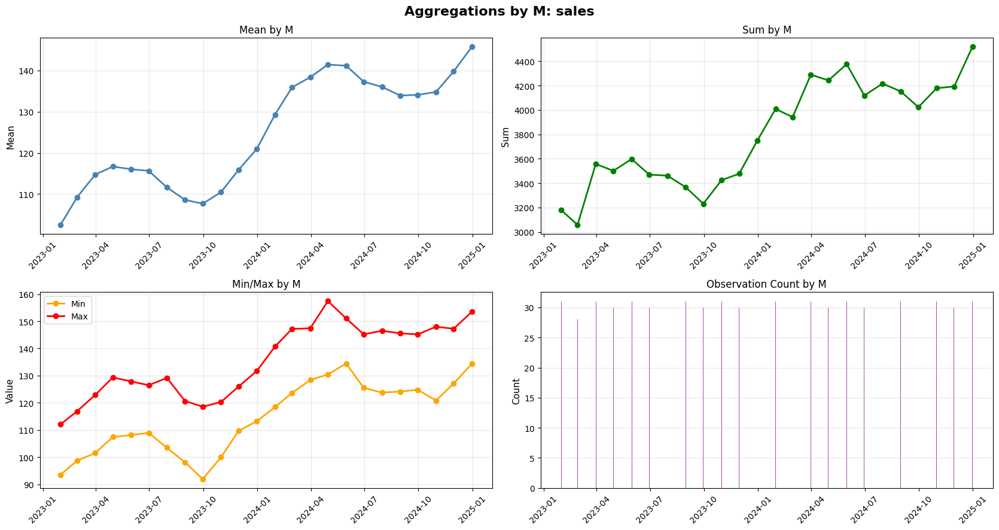


TREND ANALYSIS
Linear Trend Slope: 0.055190
R-squared: 0.6807
P-value: 0.000000
Trend Direction: Increasing


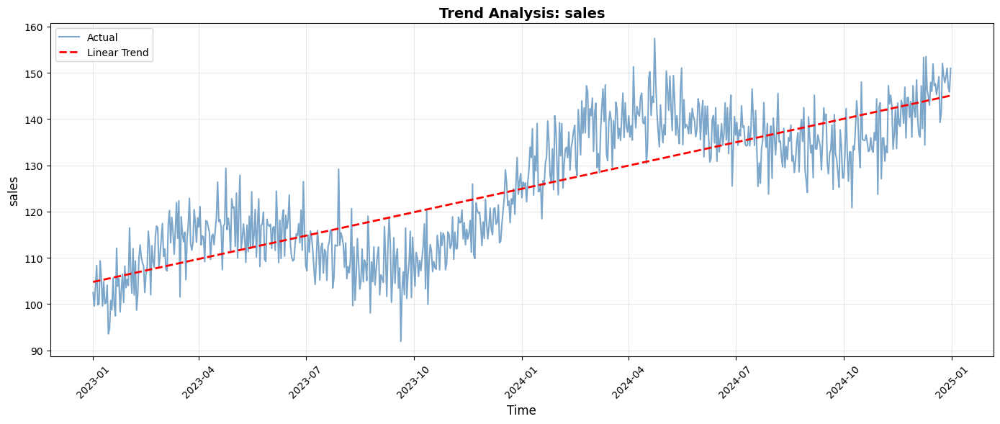


SEASONAL DECOMPOSITION (ADDITIVE)


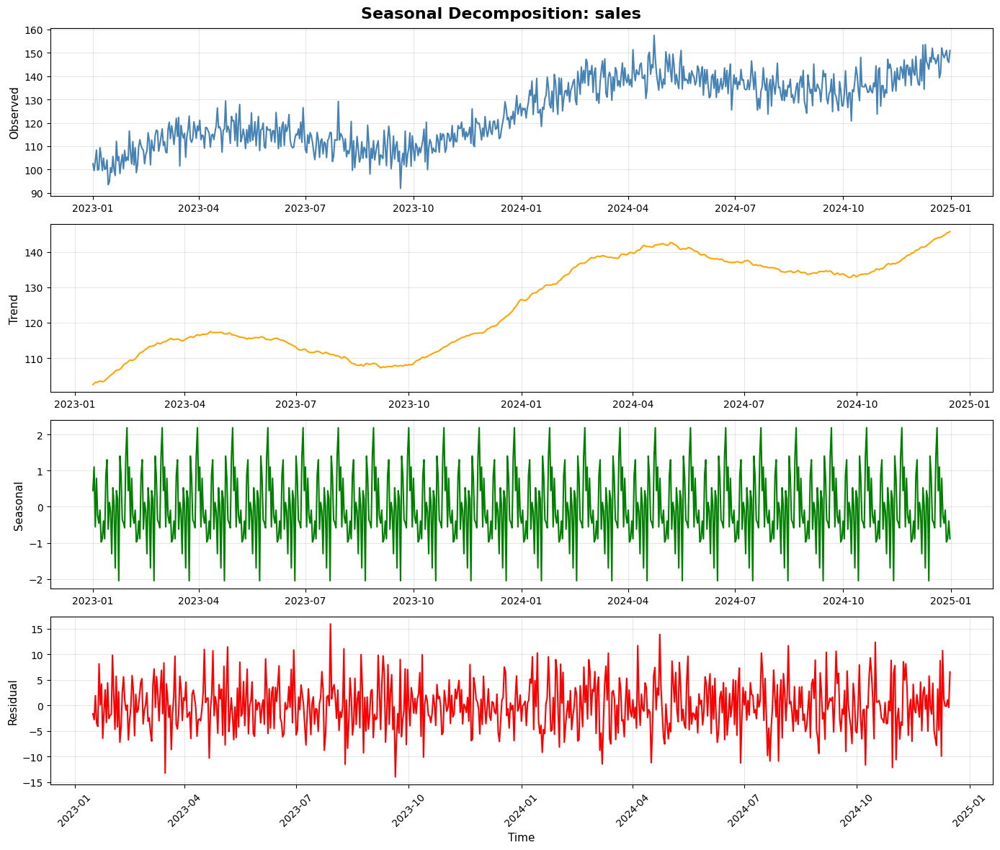

✓ Decomposition completed successfully

STATIONARITY TEST (Augmented Dickey-Fuller)
ADF Statistic: -0.680889
P-value: 0.851638
Critical Values:
  1%: -3.439490
  5%: -2.865574
  10%: -2.568918

Conclusion: Time series is NON-STATIONARY (p=> 0.05)

CHANGE DETECTION
Average Daily Change: 0.22%
Max Increase: 17.06%
Max Decrease: -17.39%
Volatility (Std of % change): 5.73%


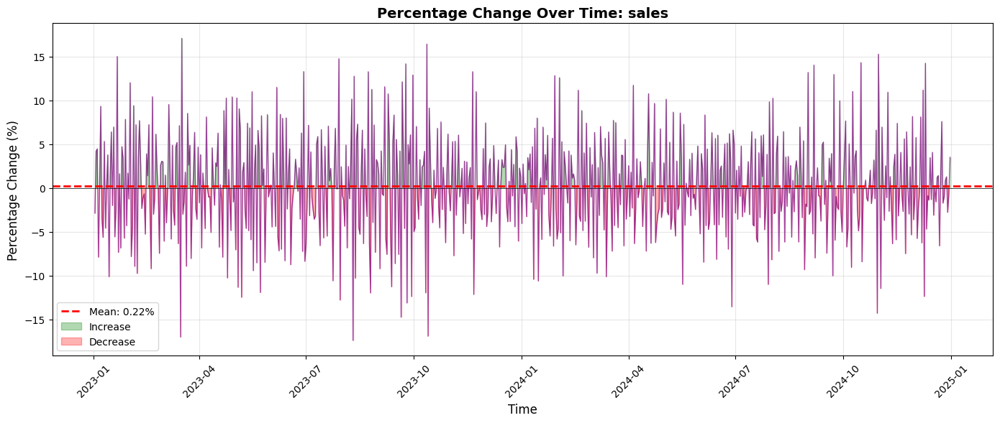


ANALYZING: revenue

--------------------------------------------------------------------------------
BASIC STATISTICS
--------------------------------------------------------------------------------
Count          : 731.0000
Mean           : 1,567.7750
Median         : 1,548.1120
Std            : 258.3614
Min            : 929.5978
Max            : 2,235.3268
Range          : 1,305.7290
Cv             : 16.4795
Skewness       : 0.2024
Kurtosis       : -0.5445

Time Range: 2023-01-01 00:00:00 to 2024-12-31 00:00:00
Duration: 730 days


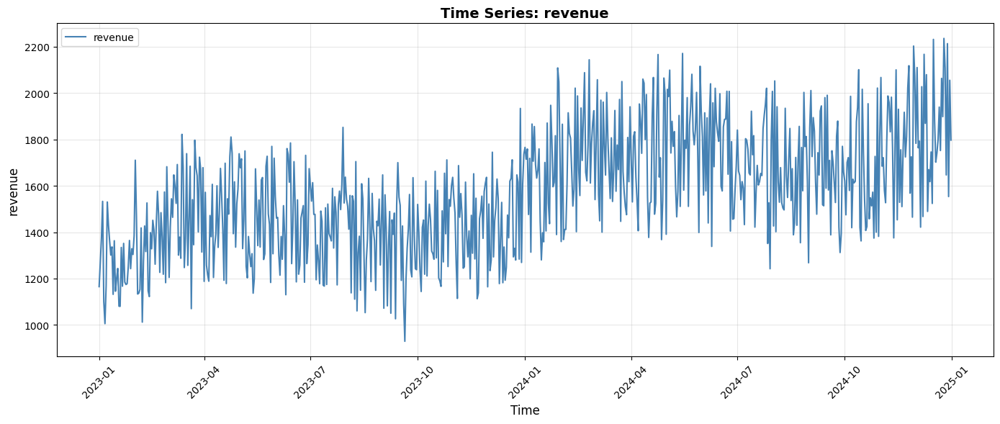


ROLLING STATISTICS (Window: 30)


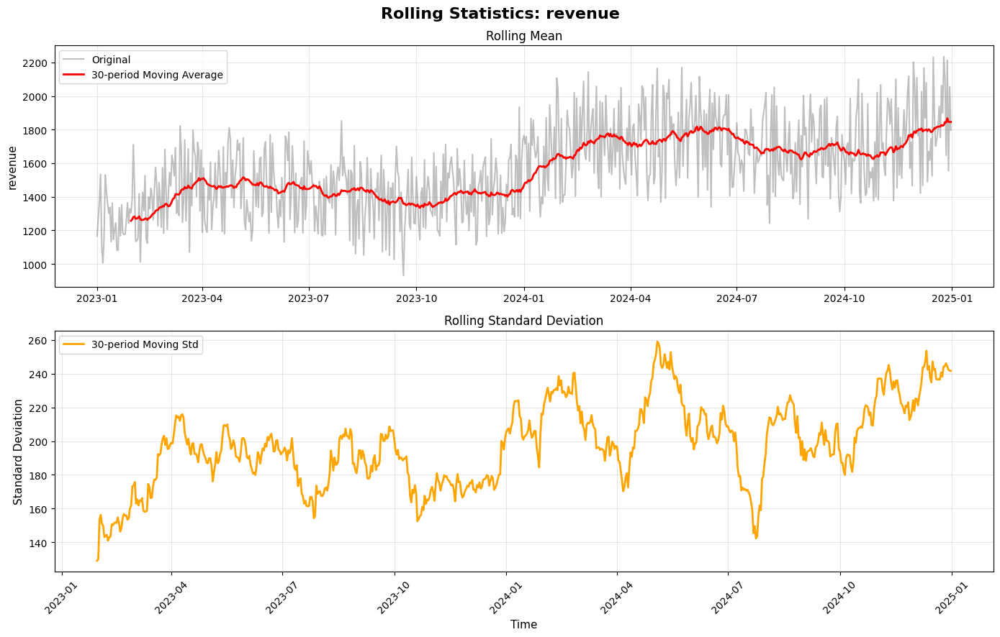

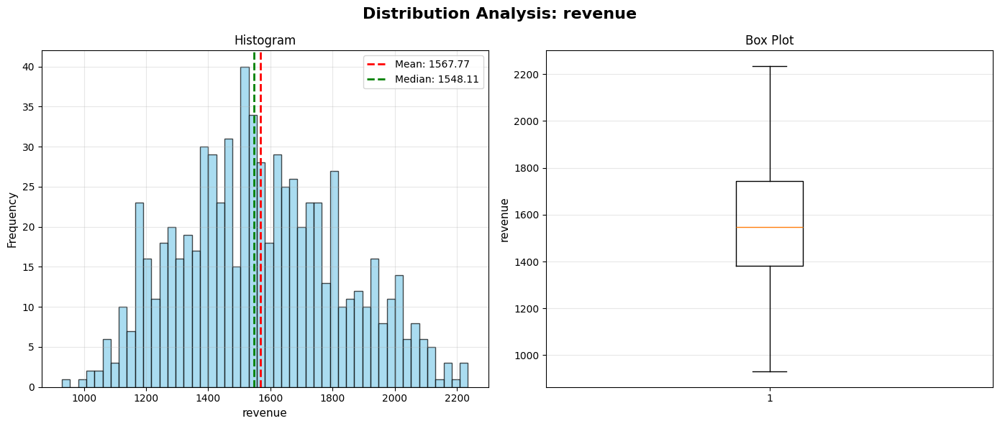


AGGREGATION BY M

Aggregated Statistics:
                   mean           sum          min          max  count
date                                                                  
2023-01-31  1261.137038  39095.248181  1005.813932  1532.826219     31
2023-02-28  1354.526246  37926.734878  1012.205938  1710.283181     28
2023-03-31  1504.061874  46625.918090  1070.380320  1821.756816     31
2023-04-30  1456.474594  43694.237815  1178.706631  1810.297440     30
2023-05-31  1459.873039  45256.064223  1137.123904  1769.913163     31
2023-06-30  1445.301797  43359.053897  1130.399481  1784.677967     30
2023-07-31  1440.531313  44656.470711  1167.736641  1851.892684     31
2023-08-31  1387.099256  43000.076948  1053.192912  1704.328433     31
2023-09-30  1346.972208  40409.166234   929.597817  1699.824590     30
2023-10-31  1409.311760  43688.664547  1144.340310  1711.667950     31


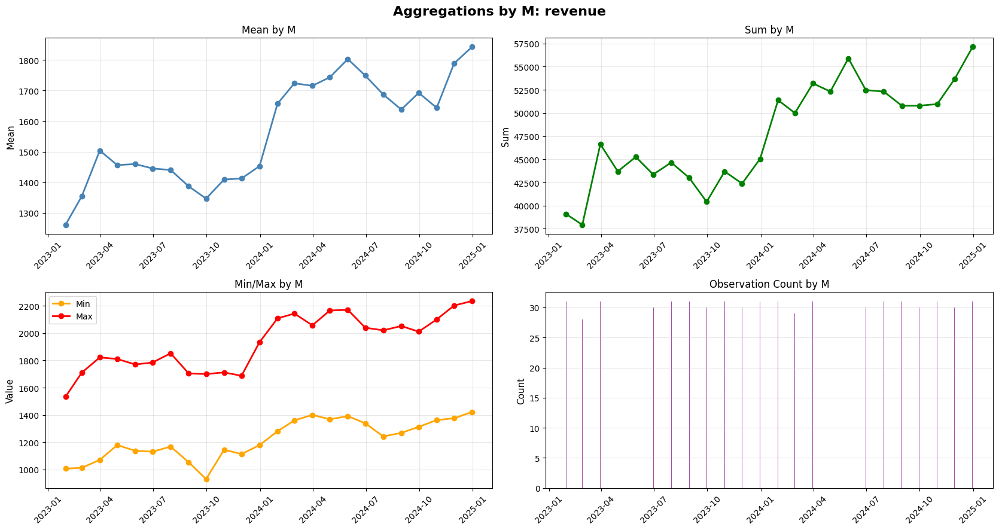


TREND ANALYSIS
Linear Trend Slope: 0.679985
R-squared: 0.3089
P-value: 0.000000
Trend Direction: Increasing


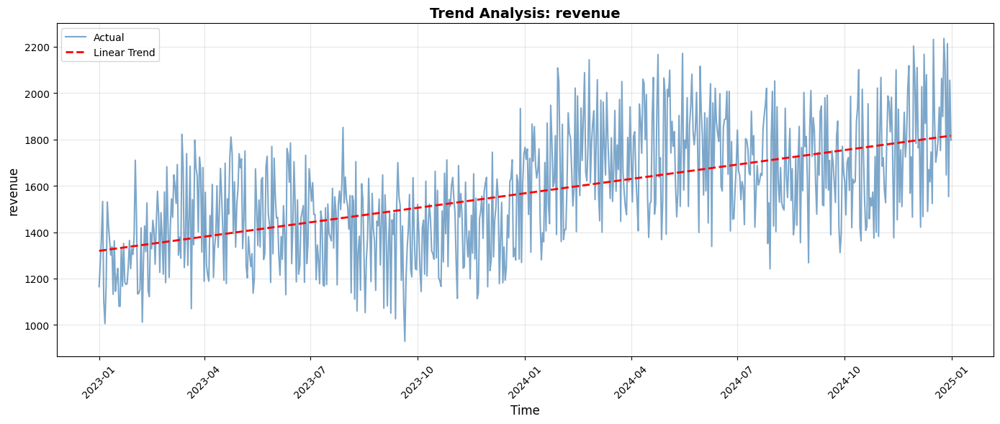


SEASONAL DECOMPOSITION (ADDITIVE)


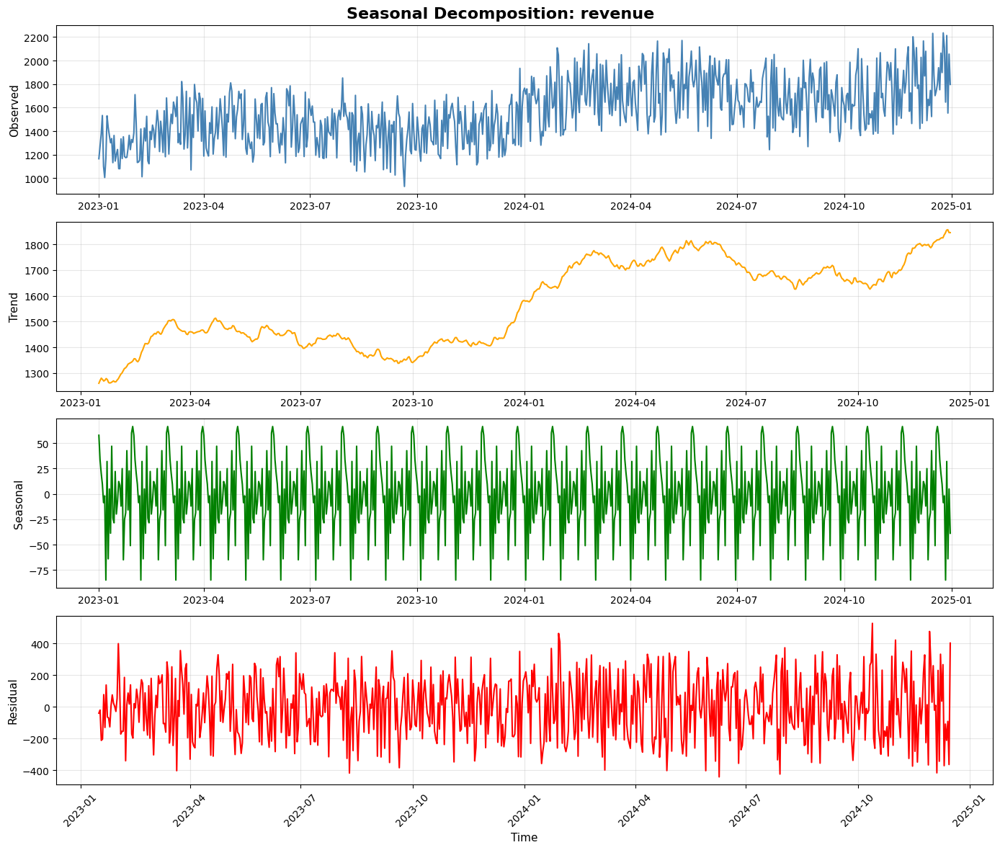

✓ Decomposition completed successfully

STATIONARITY TEST (Augmented Dickey-Fuller)
ADF Statistic: -2.153802
P-value: 0.223438
Critical Values:
  1%: -3.439490
  5%: -2.865574
  10%: -2.568918

Conclusion: Time series is NON-STATIONARY (p=> 0.05)

CHANGE DETECTION
Average Daily Change: 1.75%
Max Increase: 55.73%
Max Decrease: -37.77%
Volatility (Std of % change): 18.75%


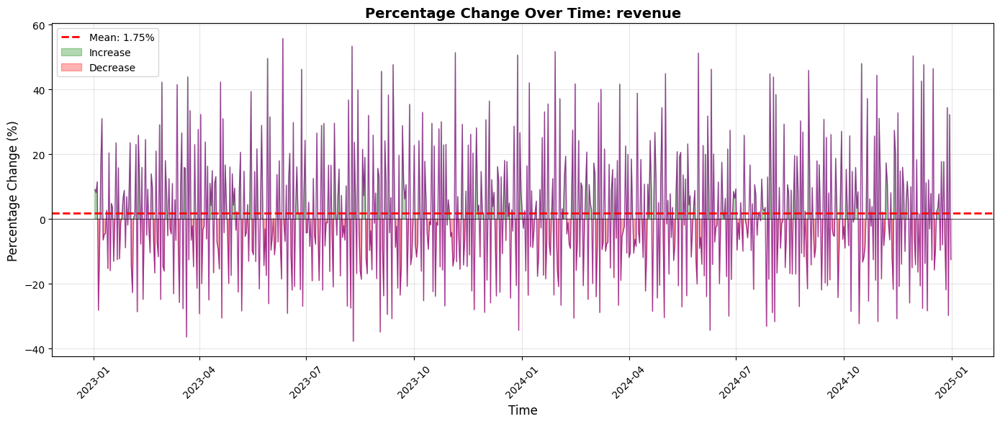


CORRELATION ANALYSIS BETWEEN TIME SERIES

Correlation Matrix:
         sales  revenue
sales    1.000    0.706
revenue  0.706    1.000


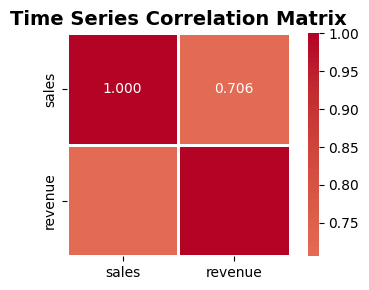

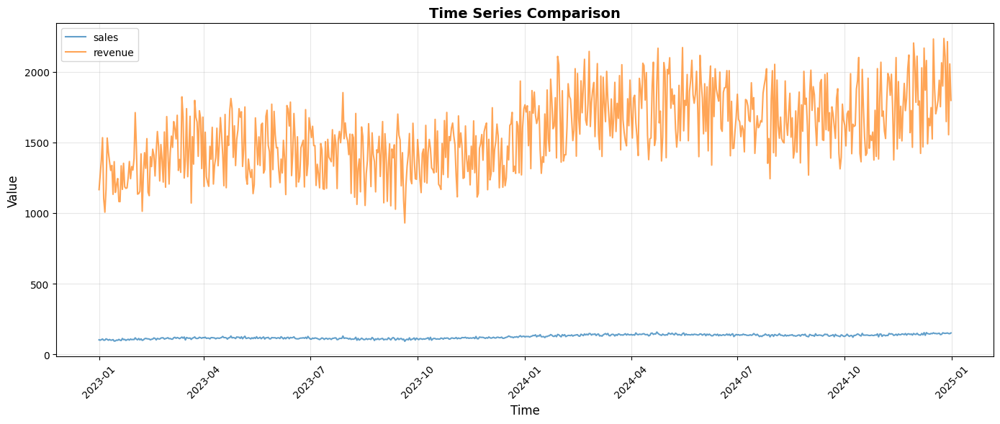


TIME SERIES ANALYSIS COMPLETE


In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
import warnings
warnings.filterwarnings('ignore')

# ===================================
# TIME SERIES ANALYSIS FUNCTIONS
# ===================================

def filter_timeseries_data(df, time_column, value_columns, filters=None, percentile=100):
    """
    Filter time series data based on conditions and percentile.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        The dataframe containing time series data
    time_column : str
        Name of the column containing datetime values
    value_columns : str or list
        Name(s) of the column(s) containing values to analyze
    filters : dict, default=None
        Dictionary of filters to apply. Format: {'column_name': value} or {'column_name': [list_of_values]}
        Example: {'product': 'A'} or {'product': ['A', 'B'], 'region': 'North'}
    percentile : float, default=100
        Percentile threshold for filtering outliers in value columns
    
    Returns:
    --------
    pandas.DataFrame : Filtered dataframe
    dict : Information about filtering applied
    """
    # Validate inputs
    if time_column not in df.columns:
        raise ValueError(f"Time column '{time_column}' not found in dataframe")
    
    # Handle single value column or multiple
    if isinstance(value_columns, str):
        value_columns = [value_columns]
    
    for col in value_columns:
        if col not in df.columns:
            raise ValueError(f"Value column '{col}' not found in dataframe")
    
    # Create copy
    df_filtered = df.copy()
    filter_info = {
        'original_shape': df.shape,
        'filters_applied': {},
        'filtered_rows_by_filter': {},
        'percentile_filtered_rows': 0,
        'final_shape': None
    }
    
    # Apply conditional filters
    if filters:
        print(f"{'='*80}")
        print("APPLYING FILTERS")
        print("="*80)
        
        for col, value in filters.items():
            if col not in df_filtered.columns:
                print(f"⚠️  Warning: Filter column '{col}' not found, skipping...")
                continue
            
            rows_before = len(df_filtered)
            
            # Handle list of values or single value
            if isinstance(value, (list, tuple)):
                df_filtered = df_filtered[df_filtered[col].isin(value)]
                filter_info['filters_applied'][col] = f"IN {value}"
            else:
                df_filtered = df_filtered[df_filtered[col] == value]
                filter_info['filters_applied'][col] = f"== {value}"
            
            rows_after = len(df_filtered)
            rows_removed = rows_before - rows_after
            filter_info['filtered_rows_by_filter'][col] = rows_removed
            
            print(f"✓ Filter: {col} {filter_info['filters_applied'][col]}")
            print(f"  Rows removed: {rows_removed:,} ({rows_removed/rows_before*100:.2f}%)")
            print(f"  Rows remaining: {rows_after:,}")
    
    # Apply percentile filtering to value columns
    if percentile < 100:
        print(f"\n{'='*80}")
        print(f"APPLYING PERCENTILE FILTERING ({percentile}th percentile)")
        print("="*80)
        
        rows_before = len(df_filtered)
        
        for col in value_columns:
            lower_bound = df_filtered[col].quantile((100 - percentile) / 200)
            upper_bound = df_filtered[col].quantile((100 + percentile) / 200)
            df_filtered = df_filtered[(df_filtered[col] >= lower_bound) & (df_filtered[col] <= upper_bound)]
            
            print(f"✓ {col}: [{lower_bound:.2f}, {upper_bound:.2f}]")
        
        rows_after = len(df_filtered)
        filter_info['percentile_filtered_rows'] = rows_before - rows_after
        
        print(f"\n  Total outliers removed: {rows_before - rows_after:,} ({(rows_before - rows_after)/rows_before*100:.2f}%)")
        print(f"  Rows remaining: {rows_after:,}")
    
    # Convert time column to datetime if not already
    if not pd.api.types.is_datetime64_any_dtype(df_filtered[time_column]):
        print(f"\n✓ Converting '{time_column}' to datetime format")
        df_filtered[time_column] = pd.to_datetime(df_filtered[time_column])
    
    # Sort by time
    df_filtered = df_filtered.sort_values(time_column).reset_index(drop=True)
    
    filter_info['final_shape'] = df_filtered.shape
    
    print(f"\n{'='*80}")
    print("FILTERING SUMMARY")
    print("="*80)
    print(f"Original rows: {filter_info['original_shape'][0]:,}")
    print(f"Final rows: {filter_info['final_shape'][0]:,}")
    print(f"Total removed: {filter_info['original_shape'][0] - filter_info['final_shape'][0]:,} "
          f"({(filter_info['original_shape'][0] - filter_info['final_shape'][0])/filter_info['original_shape'][0]*100:.2f}%)")
    
    return df_filtered, filter_info


def analyze_timeseries(df, time_column, value_columns, filters=None, percentile=100, 
                       freq='D', figsize=(14, 6), decomposition_model='additive',
                       rolling_window=7, show_acf=True):
    """
    Comprehensive time series analysis with filtering, visualizations, and statistics.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        The dataframe containing time series data
    time_column : str
        Name of the column containing datetime values
    value_columns : str or list
        Name(s) of the column(s) containing values to analyze
    filters : dict, default=None
        Dictionary of filters. Format: {'column_name': value} or {'column_name': [list_of_values]}
    percentile : float, default=100
        Percentile threshold for filtering outliers (e.g., 95, 99)
    freq : str, default='D'
        Frequency for resampling ('D'=daily, 'W'=weekly, 'M'=monthly, 'Q'=quarterly, 'Y'=yearly)
    figsize : tuple, default=(14, 6)
        Figure size for plots
    decomposition_model : str, default='additive'
        Decomposition model type ('additive' or 'multiplicative')
    rolling_window : int, default=7
        Window size for rolling statistics
    show_acf : bool, default=True
        Whether to show autocorrelation plots
    
    Returns:
    --------
    dict : Dictionary containing analysis results and statistics
    """
    
    print("="*80)
    print("TIME SERIES ANALYSIS")
    print("="*80)
    
    # Filter data
    df_filtered, filter_info = filter_timeseries_data(
        df, time_column, value_columns, filters, percentile
    )
    
    # Handle single or multiple value columns
    if isinstance(value_columns, str):
        value_columns = [value_columns]
    
    # Set time column as index
    df_ts = df_filtered.set_index(time_column)
    
    results = {
        'filter_info': filter_info,
        'time_range': (df_ts.index.min(), df_ts.index.max()),
        'total_observations': len(df_ts),
        'value_columns': value_columns,
        'statistics': {},
        'stationarity_tests': {},
        'decomposition': {}
    }
    
    # Analyze each value column
    for value_col in value_columns:
        print(f"\n{'='*80}")
        print(f"ANALYZING: {value_col}")
        print("="*80)
        
        ts_data = df_ts[value_col].dropna()
        
        # Basic statistics
        print("\n" + "-"*80)
        print("BASIC STATISTICS")
        print("-"*80)
        
        stats_dict = {
            'count': len(ts_data),
            'mean': ts_data.mean(),
            'median': ts_data.median(),
            'std': ts_data.std(),
            'min': ts_data.min(),
            'max': ts_data.max(),
            'range': ts_data.max() - ts_data.min(),
            'cv': (ts_data.std() / ts_data.mean()) * 100 if ts_data.mean() != 0 else 0,
            'skewness': ts_data.skew(),
            'kurtosis': ts_data.kurtosis()
        }
        
        for stat, value in stats_dict.items():
            print(f"{stat.capitalize():15s}: {value:,.4f}")
        
        results['statistics'][value_col] = stats_dict
        
        # Time range
        print(f"\nTime Range: {ts_data.index.min()} to {ts_data.index.max()}")
        print(f"Duration: {(ts_data.index.max() - ts_data.index.min()).days} days")
        
        # 1. TIME SERIES PLOT
        fig, ax = plt.subplots(figsize=figsize)
        ax.plot(ts_data.index, ts_data.values, linewidth=1.5, color='steelblue', label=value_col)
        ax.set_xlabel('Time', fontsize=12)
        ax.set_ylabel(value_col, fontsize=12)
        ax.set_title(f'Time Series: {value_col}', fontsize=14, fontweight='bold')
        ax.legend()
        ax.grid(alpha=0.3)
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
        
        # 2. ROLLING STATISTICS
        print(f"\n{'='*80}")
        print(f"ROLLING STATISTICS (Window: {rolling_window})")
        print("="*80)
        
        rolling_mean = ts_data.rolling(window=rolling_window).mean()
        rolling_std = ts_data.rolling(window=rolling_window).std()
        
        fig, axes = plt.subplots(2, 1, figsize=(figsize[0], figsize[1]*1.5))
        fig.suptitle(f'Rolling Statistics: {value_col}', fontsize=16, fontweight='bold')
        
        # Rolling mean
        axes[0].plot(ts_data.index, ts_data.values, label='Original', alpha=0.5, color='gray')
        axes[0].plot(rolling_mean.index, rolling_mean.values, label=f'{rolling_window}-period Moving Average', 
                    linewidth=2, color='red')
        axes[0].set_ylabel(value_col, fontsize=11)
        axes[0].legend(loc='best')
        axes[0].grid(alpha=0.3)
        axes[0].set_title('Rolling Mean', fontsize=12)
        
        # Rolling std
        axes[1].plot(rolling_std.index, rolling_std.values, label=f'{rolling_window}-period Moving Std', 
                    linewidth=2, color='orange')
        axes[1].set_xlabel('Time', fontsize=11)
        axes[1].set_ylabel('Standard Deviation', fontsize=11)
        axes[1].legend(loc='best')
        axes[1].grid(alpha=0.3)
        axes[1].set_title('Rolling Standard Deviation', fontsize=12)
        
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
        
        # 3. DISTRIBUTION ANALYSIS
        fig, axes = plt.subplots(1, 2, figsize=figsize)
        fig.suptitle(f'Distribution Analysis: {value_col}', fontsize=16, fontweight='bold')
        
        # Histogram
        axes[0].hist(ts_data.values, bins=50, color='skyblue', edgecolor='black', alpha=0.7)
        axes[0].axvline(stats_dict['mean'], color='red', linestyle='--', linewidth=2, label=f"Mean: {stats_dict['mean']:.2f}")
        axes[0].axvline(stats_dict['median'], color='green', linestyle='--', linewidth=2, label=f"Median: {stats_dict['median']:.2f}")
        axes[0].set_xlabel(value_col, fontsize=11)
        axes[0].set_ylabel('Frequency', fontsize=11)
        axes[0].set_title('Histogram', fontsize=12)
        axes[0].legend()
        axes[0].grid(alpha=0.3)
        
        # Box plot
        axes[1].boxplot(ts_data.values, vert=True)
        axes[1].set_ylabel(value_col, fontsize=11)
        axes[1].set_title('Box Plot', fontsize=12)
        axes[1].grid(alpha=0.3, axis='y')
        
        plt.tight_layout()
        plt.show()
        
        # 4. RESAMPLING AND AGGREGATION
        print(f"\n{'='*80}")
        print(f"AGGREGATION BY {freq}")
        print("="*80)
        
        ts_resampled = ts_data.resample(freq).agg(['mean', 'sum', 'min', 'max', 'count'])
        
        print("\nAggregated Statistics:")
        print(ts_resampled.head(10))
        
        fig, axes = plt.subplots(2, 2, figsize=(figsize[0]*1.2, figsize[1]*1.5))
        fig.suptitle(f'Aggregations by {freq}: {value_col}', fontsize=16, fontweight='bold')
        
        # Mean
        axes[0, 0].plot(ts_resampled.index, ts_resampled['mean'], marker='o', linewidth=2, color='steelblue')
        axes[0, 0].set_ylabel('Mean', fontsize=11)
        axes[0, 0].set_title(f'Mean by {freq}', fontsize=12)
        axes[0, 0].grid(alpha=0.3)
        axes[0, 0].tick_params(axis='x', rotation=45)
        
        # Sum
        axes[0, 1].plot(ts_resampled.index, ts_resampled['sum'], marker='o', linewidth=2, color='green')
        axes[0, 1].set_ylabel('Sum', fontsize=11)
        axes[0, 1].set_title(f'Sum by {freq}', fontsize=12)
        axes[0, 1].grid(alpha=0.3)
        axes[0, 1].tick_params(axis='x', rotation=45)
        
        # Min/Max
        axes[1, 0].plot(ts_resampled.index, ts_resampled['min'], marker='o', linewidth=2, 
                       color='orange', label='Min')
        axes[1, 0].plot(ts_resampled.index, ts_resampled['max'], marker='o', linewidth=2, 
                       color='red', label='Max')
        axes[1, 0].set_ylabel('Value', fontsize=11)
        axes[1, 0].set_title(f'Min/Max by {freq}', fontsize=12)
        axes[1, 0].legend()
        axes[1, 0].grid(alpha=0.3)
        axes[1, 0].tick_params(axis='x', rotation=45)
        
        # Count
        axes[1, 1].bar(ts_resampled.index, ts_resampled['count'], color='purple', alpha=0.7)
        axes[1, 1].set_ylabel('Count', fontsize=11)
        axes[1, 1].set_title(f'Observation Count by {freq}', fontsize=12)
        axes[1, 1].grid(alpha=0.3, axis='y')
        axes[1, 1].tick_params(axis='x', rotation=45)
        
        plt.tight_layout()
        plt.show()
        
        # 5. TREND ANALYSIS
        print(f"\n{'='*80}")
        print("TREND ANALYSIS")
        print("="*80)
        
        # Fit linear trend
        time_numeric = np.arange(len(ts_data))
        slope, intercept, r_value, p_value, std_err = stats.linregress(time_numeric, ts_data.values)
        
        trend_line = slope * time_numeric + intercept
        
        print(f"Linear Trend Slope: {slope:.6f}")
        print(f"R-squared: {r_value**2:.4f}")
        print(f"P-value: {p_value:.6f}")
        
        trend_direction = "Increasing" if slope > 0 else "Decreasing" if slope < 0 else "Flat"
        print(f"Trend Direction: {trend_direction}")
        
        fig, ax = plt.subplots(figsize=figsize)
        ax.plot(ts_data.index, ts_data.values, linewidth=1.5, color='steelblue', label='Actual', alpha=0.7)
        ax.plot(ts_data.index, trend_line, linewidth=2, color='red', linestyle='--', label='Linear Trend')
        ax.set_xlabel('Time', fontsize=12)
        ax.set_ylabel(value_col, fontsize=12)
        ax.set_title(f'Trend Analysis: {value_col}', fontsize=14, fontweight='bold')
        ax.legend()
        ax.grid(alpha=0.3)
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
        
        results['statistics'][value_col]['trend_slope'] = slope
        results['statistics'][value_col]['trend_r_squared'] = r_value**2
        results['statistics'][value_col]['trend_direction'] = trend_direction
        
        # 6. SEASONALITY DECOMPOSITION
        if len(ts_data) >= 2 * rolling_window:  # Need enough data for decomposition
            print(f"\n{'='*80}")
            print(f"SEASONAL DECOMPOSITION ({decomposition_model.upper()})")
            print("="*80)
            
            try:
                # Resample to regular frequency for decomposition
                ts_regular = ts_data.resample('D').mean().interpolate()
                
                if len(ts_regular) >= 2 * rolling_window:
                    decomposition = seasonal_decompose(ts_regular, model=decomposition_model, period=rolling_window)
                    
                    fig, axes = plt.subplots(4, 1, figsize=(figsize[0], figsize[1]*2))
                    fig.suptitle(f'Seasonal Decomposition: {value_col}', fontsize=16, fontweight='bold')
                    
                    # Original
                    axes[0].plot(decomposition.observed.index, decomposition.observed.values, color='steelblue')
                    axes[0].set_ylabel('Observed', fontsize=11)
                    axes[0].grid(alpha=0.3)
                    
                    # Trend
                    axes[1].plot(decomposition.trend.index, decomposition.trend.values, color='orange')
                    axes[1].set_ylabel('Trend', fontsize=11)
                    axes[1].grid(alpha=0.3)
                    
                    # Seasonal
                    axes[2].plot(decomposition.seasonal.index, decomposition.seasonal.values, color='green')
                    axes[2].set_ylabel('Seasonal', fontsize=11)
                    axes[2].grid(alpha=0.3)
                    
                    # Residual
                    axes[3].plot(decomposition.resid.index, decomposition.resid.values, color='red')
                    axes[3].set_ylabel('Residual', fontsize=11)
                    axes[3].set_xlabel('Time', fontsize=11)
                    axes[3].grid(alpha=0.3)
                    
                    plt.xticks(rotation=45)
                    plt.tight_layout()
                    plt.show()
                    
                    results['decomposition'][value_col] = {
                        'trend': decomposition.trend.dropna().values,
                        'seasonal': decomposition.seasonal.dropna().values,
                        'residual': decomposition.resid.dropna().values
                    }
                    
                    print("✓ Decomposition completed successfully")
            except Exception as e:
                print(f"⚠️  Could not perform decomposition: {str(e)}")
        
        # 7. STATIONARITY TEST (Augmented Dickey-Fuller)
        print(f"\n{'='*80}")
        print("STATIONARITY TEST (Augmented Dickey-Fuller)")
        print("="*80)
        
        try:
            adf_result = adfuller(ts_data.dropna())
            
            print(f"ADF Statistic: {adf_result[0]:.6f}")
            print(f"P-value: {adf_result[1]:.6f}")
            print("Critical Values:")
            for key, value in adf_result[4].items():
                print(f"  {key}: {value:.6f}")
            
            is_stationary = adf_result[1] < 0.05
            print(f"\nConclusion: Time series is {'STATIONARY' if is_stationary else 'NON-STATIONARY'} (p={'<' if is_stationary else '>'} 0.05)")
            
            results['stationarity_tests'][value_col] = {
                'adf_statistic': adf_result[0],
                'p_value': adf_result[1],
                'critical_values': adf_result[4],
                'is_stationary': is_stationary
            }
        except Exception as e:
            print(f"⚠️  Could not perform stationarity test: {str(e)}")
        
        # 8. AUTOCORRELATION ANALYSIS
        if show_acf and len(ts_data) > 10:
            print(f"\n{'='*80}")
            print("AUTOCORRELATION ANALYSIS")
            print("="*80)
            
            try:
                fig, axes = plt.subplots(1, 2, figsize=figsize)
                fig.suptitle(f'Autocorrelation Analysis: {value_col}', fontsize=16, fontweight='bold')
                
                # ACF
                plot_acf(ts_data.dropna(), lags=min(40, len(ts_data)//2), ax=axes[0])
                axes[0].set_title('Autocorrelation Function (ACF)', fontsize=12)
                axes[0].grid(alpha=0.3)
                
                # PACF
                plot_pacf(ts_data.dropna(), lags=min(40, len(ts_data)//2), ax=axes[1])
                axes[1].set_title('Partial Autocorrelation Function (PACF)', fontsize=12)
                axes[1].grid(alpha=0.3)
                
                plt.tight_layout()
                plt.show()
                
                print("✓ Autocorrelation plots generated")
            except Exception as e:
                print(f"⚠️  Could not generate autocorrelation plots: {str(e)}")
        
        # 9. CHANGE DETECTION
        print(f"\n{'='*80}")
        print("CHANGE DETECTION")
        print("="*80)
        
        # Calculate percentage changes
        pct_change = ts_data.pct_change() * 100
        
        print(f"Average Daily Change: {pct_change.mean():.2f}%")
        print(f"Max Increase: {pct_change.max():.2f}%")
        print(f"Max Decrease: {pct_change.min():.2f}%")
        print(f"Volatility (Std of % change): {pct_change.std():.2f}%")
        
        fig, ax = plt.subplots(figsize=figsize)
        ax.plot(pct_change.index, pct_change.values, linewidth=1, color='purple', alpha=0.7)
        ax.axhline(y=0, color='black', linestyle='-', linewidth=0.5)
        ax.axhline(y=pct_change.mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {pct_change.mean():.2f}%')
        ax.fill_between(pct_change.index, 0, pct_change.values, 
                        where=(pct_change.values > 0), color='green', alpha=0.3, label='Increase')
        ax.fill_between(pct_change.index, 0, pct_change.values, 
                        where=(pct_change.values < 0), color='red', alpha=0.3, label='Decrease')
        ax.set_xlabel('Time', fontsize=12)
        ax.set_ylabel('Percentage Change (%)', fontsize=12)
        ax.set_title(f'Percentage Change Over Time: {value_col}', fontsize=14, fontweight='bold')
        ax.legend()
        ax.grid(alpha=0.3)
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
        
        results['statistics'][value_col]['avg_pct_change'] = pct_change.mean()
        results['statistics'][value_col]['volatility'] = pct_change.std()
    
    # 10. CORRELATION ANALYSIS (if multiple value columns)
    if len(value_columns) > 1:
        print(f"\n{'='*80}")
        print("CORRELATION ANALYSIS BETWEEN TIME SERIES")
        print("="*80)
        
        corr_matrix = df_ts[value_columns].corr()
        
        print("\nCorrelation Matrix:")
        print(corr_matrix.round(3))
        
        fig, ax = plt.subplots(figsize=(min(10, len(value_columns)*2), min(8, len(value_columns)*1.5)))
        sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0, 
                   fmt='.3f', square=True, linewidths=1, ax=ax)
        ax.set_title('Time Series Correlation Matrix', fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.show()
        
        # Time series comparison plot
        fig, ax = plt.subplots(figsize=(figsize[0], figsize[1]))
        for col in value_columns:
            ax.plot(df_ts.index, df_ts[col], label=col, linewidth=1.5, alpha=0.7)
        ax.set_xlabel('Time', fontsize=12)
        ax.set_ylabel('Value', fontsize=12)
        ax.set_title('Time Series Comparison', fontsize=14, fontweight='bold')
        ax.legend()
        ax.grid(alpha=0.3)
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
        
        results['correlation_matrix'] = corr_matrix.to_dict()
    
    print(f"\n{'='*80}")
    print("TIME SERIES ANALYSIS COMPLETE")
    print("="*80)
    
    return results


# ===================================
# QUICK TIME SERIES FUNCTIONS
# ===================================

def quick_timeseries_plot(df, time_column, value_columns, filters=None, figsize=(14, 6)):
    """
    Quick time series plot with optional filtering.
    
    Parameters:
    -----------
    df : pandas.DataFrame
    time_column : str
    value_columns : str or list
    filters : dict, default=None
    figsize : tuple
    """
    df_filtered, _ = filter_timeseries_data(df, time_column, value_columns, filters, percentile=100)
    
    if isinstance(value_columns, str):
        value_columns = [value_columns]
    
    df_ts = df_filtered.set_index(time_column)
    
    fig, ax = plt.subplots(figsize=figsize)
    for col in value_columns:
        ax.plot(df_ts.index, df_ts[col], label=col, linewidth=2, alpha=0.7)
    
    ax.set_xlabel('Time', fontsize=12)
    ax.set_ylabel('Value', fontsize=12)
    ax.set_title('Time Series Plot', fontsize=14, fontweight='bold')
    ax.legend()
    ax.grid(alpha=0.3)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


# ===================================
# EXAMPLE USAGE
# ===================================

if __name__ == "__main__":
    # Create sample time series data
    np.random.seed(42)
    dates = pd.date_range('2023-01-01', '2024-12-31', freq='D')
    
    # Generate data with trend and seasonality
    trend = np.linspace(100, 150, len(dates))
    seasonal = 10 * np.sin(2 * np.pi * np.arange(len(dates)) / 365)
    noise = np.random.normal(0, 5, len(dates))
    
    df = pd.DataFrame({
        'date': dates,
        'sales': trend + seasonal + noise,
        'revenue': (trend + seasonal + noise) * np.random.uniform(10, 15, len(dates)),
        'product': np.random.choice(['A', 'B', 'C'], len(dates)),
        'region': np.random.choice(['North', 'South'], len(dates))
    })
    
    print("EXAMPLE 1: Basic Time Series Analysis")
    print("="*80)
    results = analyze_timeseries(
        df,
        time_column='date',
        value_columns='sales',
        freq='M',
        rolling_window=30
    )
    
    print("\n\n" + "="*80)
    print("EXAMPLE 2: Time Series with Filters")
    print("="*80)
    results = analyze_timeseries(
        df,
        time_column='date',
        value_columns='sales',
        filters={'product': 'A', 'region': 'North'},
        percentile=95,
        freq='M',
        rolling_window=30
    )
    
    print("\n\n" + "="*80)
    print("EXAMPLE 3: Multiple Time Series")
    print("="*80)
    results = analyze_timeseries(
        df,
        time_column='date',
        value_columns=['sales', 'revenue'],
        freq='M',
        rolling_window=30,
        show_acf=False
    )